## 1. Load libraries

In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd

# crs transformer
import pyproj
from shapely.geometry import Point

# shape merge
from shapely.ops import unary_union
from shapely.ops import cascaded_union
from shapely.geometry import MultiPolygon

# Packages for standardising the dataset
from sklearn.preprocessing import RobustScaler

# Packages for clustering analysis
import sklearn.cluster as sklc  # for clustering
import sklearn.metrics as sklm  # for the silhouette score
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans, DBSCAN, OPTICS, AgglomerativeClustering


# plot
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
from matplotlib_scalebar.scalebar import ScaleBar
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import plotly.express as px
from scipy.cluster.hierarchy import dendrogram, linkage # hierarchical clustering visualisation

# file path
import os

## 2. Read in files

Data Sources:

- borough - London Borough boundary (GLA https://data.london.gov.uk/dataset/london_boroughs )

- high_street - High Street Boundary (GLA https://data.london.gov.uk/dataset/gla-high-street-boundaries)

- 2021 England LSOA boundary (ONS Geography https://geoportal.statistics.gov.uk/datasets/766da1380a3544c5a7ca9131dfd4acb6_0/explore)

- 2011 London LSOA boundary (ONS https://data.london.gov.uk/dataset/super-output-area-population-lsoa-msoa-london)

- LSOA (2011) to LSOA (2021) to Local Authority District (2022) Lookup for England and Wales (Version 2) (ONS Geography https://geoportal.statistics.gov.uk/datasets/ons::lsoa-2011-to-lsoa-2021-to-local-authority-district-2022-lookup-for-england-and-wales-version-2/explore)

- onspd - ONS Postcode Directory (May 2023) (https://geoportal.statistics.gov.uk/datasets/bd25c421196b4546a7830e95ecdd70bc/about)

- deprivation & age - 2021 census LSOA demography and migration (Census Information Scheme https://data.london.gov.uk/dataset/2021-census-lsoa-demography-and-migration)

- occupation - 2021 census lsoa labour market (Census Information Scheme https://data.london.gov.uk/dataset/2021-census-lsoa-labour-market)

- houseprice - Median house prices by lower layer super output area: HPSSA dataset 46 (release date:21 June 2023) (ONS https://www.ons.gov.uk/peoplepopulationandcommunity/housing/datasets/medianpricepaidbylowerlayersuperoutputareahpssadataset46)

- openLocal - Commercial composition data (OpenLocal https://openlocal.uk, https://openlocal.uk/publishers/E09000031)

#### Geography Boundaries

In [2]:
borough = gpd.read_file('./Data/London_Boroughs.gpkg')

In [3]:
high_street = gpd.read_file('./Data/GLA_High_Street_boundaries.gpkg')

In [4]:
lsoa11_LD = gpd.read_file('./Data/statistical-gis-boundaries-london/ESRI/LSOA_2011_London_gen_MHW.shp') 

In [5]:
lsoa21_ENG = gpd.read_file('./Data/LSOA_Dec_2021_Boundaries_Generalised_Clipped_EW_BGC_2022_5000101660793162025/LSOA_2021_EW_BGC.shp')

#### LSOA Variables

In [6]:
deprivation11 = pd.read_excel('./Data/Household_deprivation.xlsx', sheet_name=2)
deprivation21 = pd.read_excel('./Data/Household_deprivation.xlsx', sheet_name=3)
# deprivation_changes = pd.read_excel('./Data/Household_deprivation.xlsx', sheet_name=4) # change 2011-2021

In [7]:
age11 = pd.read_excel('./Data/Five_year_age_bands.xlsx', sheet_name=2)
age21 = pd.read_excel('./Data/Five_year_age_bands.xlsx', sheet_name=3)
# age_changes = pd.read_excel('./Data/Five_year_age_bands.xlsx', sheet_name=4) # change 2011-2021

In [8]:
occupation11 = pd.read_excel('./Data/occupation.xlsx', sheet_name=2)
occupation21 = pd.read_excel('./Data/occupation.xlsx', sheet_name=3)
# occupation_changes = pd.read_excel('./Data/occupation.xlsx', sheet_name=4) # change 2011-2021

In [9]:
# houseprice contains data of all lsoas in the england
houseprice = pd.read_excel('./Data/hpssadataset46medianpricepaidforresidentialpropertiesbylsoa.xls', sheet_name=5, skiprows=range(5))

#### openLocal Data

In [10]:
openlocal11_wf = pd.read_csv('./Data/2021-03-E09000031-waltham-forest-location-report/2011-03-E09000031-waltham-forest-location-report.csv')

In [11]:
openlocal21_wf = pd.read_csv('./Data/2021-03-E09000031-waltham-forest-location-report/2021-03-E09000031-waltham-forest-location-report.csv')

#### ONS lookup

In [12]:
# ONS LSOA lookup
lsoa_lookup = pd.read_csv('./Data/LSOA_(2011)_to_LSOA_(2021)_to_Local_Authority_District_(2022)_Lookup_for_England_and_Wales_(Version_2).csv', low_memory=False)

In [13]:

# ONS Postcode Dictionary
onspd = pd.read_csv('./Data/ONSPD_MAY_2023_UK/Data/ONSPD_MAY_2023_UK.csv', low_memory=False)

#### 2.1 Preview and check the data types

In [14]:
borough.head()

,objectid,name,gss_code,hectares,nonld_area,ons_inner,sub_2011,geometry
0,1,Kingston upon Thames,E09000021,3726.117,0.000,F,South,"POLYGON ((516401.600 160201.800, 516407.300 16..."
1,2,Croydon,E09000008,8649.441,0.000,F,South,"POLYGON ((535009.200 159504.700, 535005.500 15..."
2,3,Bromley,E09000006,15013.487,0.000,F,South,"POLYGON ((540373.600 157530.400, 540361.200 15..."
3,4,Hounslow,E09000018,5658.541,60.755,F,West,"POLYGON ((509703.400 175356.600, 509712.600 17..."
4,5,Ealing,E09000009,5554.428,0.000,F,West,"POLYGON ((515647.200 178787.800, 515608.800 17..."


In [15]:
borough.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   objectid    33 non-null     int64   
 1   name        33 non-null     object  
 2   gss_code    33 non-null     object  
 3   hectares    33 non-null     float64 
 4   nonld_area  33 non-null     float64 
 5   ons_inner   33 non-null     object  
 6   sub_2011    33 non-null     object  
 7   geometry    33 non-null     geometry
dtypes: float64(2), geometry(1), int64(1), object(4)
memory usage: 2.2+ KB


In [16]:
borough.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [17]:
lsoa11_LD.head()

,LSOA11CD,LSOA11NM,MSOA11CD,MSOA11NM,LAD11CD,LAD11NM,RGN11CD,RGN11NM,USUALRES,HHOLDRES,COMESTRES,POPDEN,HHOLDS,AVHHOLDSZ,geometry
0,E01000001,City of London 001A,E02000001,City of London 001,E09000001,City of London,E12000007,London,1465,1465,0,112.9,876,1.7,"POLYGON ((532105.092 182011.230, 532162.491 18..."
1,E01000002,City of London 001B,E02000001,City of London 001,E09000001,City of London,E12000007,London,1436,1436,0,62.9,830,1.7,"POLYGON ((532746.813 181786.891, 532671.688 18..."
2,E01000003,City of London 001C,E02000001,City of London 001,E09000001,City of London,E12000007,London,1346,1250,96,227.7,817,1.5,"POLYGON ((532135.145 182198.119, 532158.250 18..."
3,E01000005,City of London 001E,E02000001,City of London 001,E09000001,City of London,E12000007,London,985,985,0,52.0,467,2.1,"POLYGON ((533807.946 180767.770, 533649.063 18..."
4,E01000006,Barking and Dagenham 016A,E02000017,Barking and Dagenham 016,E09000002,Barking and Dagenham,E12000007,London,1703,1699,4,116.2,543,3.1,"POLYGON ((545122.049 184314.931, 545271.917 18..."


In [18]:
lsoa11_LD.crs

<Derived Projected CRS: PROJCS["OSGB36 / British National Grid",GEOGCS["OS ...>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [19]:
lsoa21_ENG.head()

,LSOA21CD,LSOA21NM,GlobalID,geometry
0,E01000001,City of London 001A,f1865556-4e62-48e3-a025-d93a40f15e46,"POLYGON ((532105.312 182010.574, 532162.491 18..."
1,E01000002,City of London 001B,83e78aad-ee05-44a5-a8d3-077de6ed4053,"POLYGON ((532634.497 181926.016, 532619.141 18..."
2,E01000003,City of London 001C,69c457df-229e-4446-9577-95ac1c9be694,"POLYGON ((532135.138 182198.131, 532158.250 18..."
3,E01000005,City of London 001E,d537d59f-237a-45ed-a514-b0ab2a93e510,"POLYGON ((533808.018 180767.774, 533649.037 18..."
4,E01000006,Barking and Dagenham 016A,8d0081fe-69e2-48ac-aaf9-fd270d60e339,"POLYGON ((545122.049 184314.931, 545271.849 18..."


In [20]:
lsoa21_ENG.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [21]:
high_street.head()

,objectid,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,geometry
0,1,1,"Pimlico Road, Belgravia",10.564859,None,"POLYGON ((528532.653 178503.913, 528533.610 17..."
1,2,2,"Queensway, Westbourne Grove, Bayswater",31.812834,None,"POLYGON ((525909.685 181229.993, 525902.809 18..."
2,3,3,"Carshalton Road, Carshalton.",4.462210,None,"POLYGON ((527372.837 164353.214, 527376.960 16..."
3,4,4,"Mitcham Road, Croydon.",6.936039,None,"POLYGON ((531381.957 166498.580, 531386.088 16..."
4,5,5,"Bridge Road, Chessington.",4.907169,None,"POLYGON ((518643.379 164208.685, 518642.422 16..."


In [22]:
high_street.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 638 entries, 0 to 637
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   objectid           638 non-null    int64   
 1   highstreet_id      638 non-null    int64   
 2   highstreet_name    638 non-null    object  
 3   area_ha            638 non-null    float64 
 4   gdb_geomattr_data  0 non-null      object  
 5   geometry           638 non-null    geometry
dtypes: float64(1), geometry(1), int64(2), object(2)
memory usage: 30.0+ KB


In [23]:
# convert highstreet_id, objectid dtype from int64 to object
high_street['objectid'] = high_street['objectid'].astype('object')
high_street['highstreet_id'] = high_street['highstreet_id'].astype('object')

high_street.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 638 entries, 0 to 637
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   objectid           638 non-null    object  
 1   highstreet_id      638 non-null    object  
 2   highstreet_name    638 non-null    object  
 3   area_ha            638 non-null    float64 
 4   gdb_geomattr_data  0 non-null      object  
 5   geometry           638 non-null    geometry
dtypes: float64(1), geometry(1), object(4)
memory usage: 30.0+ KB


In [24]:
high_street.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [25]:
deprivation11.head()

,LSOA code,local authority name,local authority code,All Households,deprived in: no dimensions,1 dimension,2 dimensions,3 dimensions,4 dimensions
0,E01000001,City of London,E09000001,876,488,314,61,12,1
1,E01000002,City of London,E09000001,830,490,288,47,4,1
2,E01000003,City of London,E09000001,817,235,359,169,47,7
3,E01000005,City of London,E09000001,467,107,187,113,51,9
4,E01032739,City of London,E09000001,676,344,276,53,2,1


In [26]:
deprivation11.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   LSOA code                   4994 non-null   object
 1   local authority name        4994 non-null   object
 2   local authority code        4994 non-null   object
 3   All Households              4994 non-null   int64 
 4   deprived in: no dimensions  4994 non-null   int64 
 5   1 dimension                 4994 non-null   int64 
 6   2 dimensions                4994 non-null   int64 
 7   3 dimensions                4994 non-null   int64 
 8   4 dimensions                4994 non-null   int64 
dtypes: int64(6), object(3)
memory usage: 351.3+ KB


In [27]:
deprivation21.head()

,LSOA code,local authority name,local authority code,All Households,deprived in: no dimensions,1 dimension,2 dimensions,3 dimensions,4 dimensions
0,E01000001,City of London,E09000001,838,550,253,32,3,0
1,E01000002,City of London,E09000001,824,541,254,28,1,0
2,E01000003,City of London,E09000001,1015,486,389,110,27,3
3,E01000005,City of London,E09000001,474,163,175,95,37,4
4,E01032739,City of London,E09000001,881,610,234,34,3,0


In [28]:
deprivation21.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   LSOA code                   4994 non-null   object
 1   local authority name        4994 non-null   object
 2   local authority code        4994 non-null   object
 3   All Households              4994 non-null   int64 
 4   deprived in: no dimensions  4994 non-null   int64 
 5   1 dimension                 4994 non-null   int64 
 6   2 dimensions                4994 non-null   int64 
 7   3 dimensions                4994 non-null   int64 
 8   4 dimensions                4994 non-null   int64 
dtypes: int64(6), object(3)
memory usage: 351.3+ KB


In [29]:
age11.head()

,LSOA code,local authority code,local authority name,All usual residents,Aged 4 and under,Aged 5 to 9,Aged 10 to 14,Aged 15 to 19,Aged 20 to 24,Aged 25 to 29,...,Aged 40 to 44,Aged 45 to 49,Aged 50 to 54,Aged 55 to 59,Aged 60 to 64,Aged 65 to 69,Aged 70 to 74,Aged 75 to 79,Aged 80 to 84,Aged 85 and over
0,E01000001,E09000001,City of London,1465,50,33,26,19,63,140,...,107,119,102,138,128,72,67,60,43,26
1,E01000002,E09000001,City of London,1436,60,46,30,28,40,92,...,156,130,131,102,115,94,78,38,26,33
2,E01000003,E09000001,City of London,1346,53,22,24,72,77,144,...,112,107,79,78,74,70,44,43,58,39
3,E01000005,E09000001,City of London,985,42,60,49,48,97,122,...,80,76,56,53,43,36,43,28,9,11
4,E01032739,E09000001,City of London,1044,13,17,34,23,117,235,...,87,71,47,46,42,24,6,5,2,1


In [30]:
age11.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   LSOA code             4994 non-null   object
 1   local authority code  4994 non-null   object
 2   local authority name  4994 non-null   object
 3   All usual residents   4994 non-null   int64 
 4   Aged 4 and under      4994 non-null   int64 
 5   Aged 5 to 9           4994 non-null   int64 
 6   Aged 10 to 14         4994 non-null   int64 
 7   Aged 15 to 19         4994 non-null   int64 
 8   Aged 20 to 24         4994 non-null   int64 
 9   Aged 25 to 29         4994 non-null   int64 
 10  Aged 30 to 34         4994 non-null   int64 
 11  Aged 35 to 39         4994 non-null   int64 
 12  Aged 40 to 44         4994 non-null   int64 
 13  Aged 45 to 49         4994 non-null   int64 
 14  Aged 50 to 54         4994 non-null   int64 
 15  Aged 55 to 59         4994 non-null   

In [31]:
age21.head()

,LSOA code,local authority code,local authority name,All usual residents,Aged 4 and under,Aged 5 to 9,Aged 10 to 14,Aged 15 to 19,Aged 20 to 24,Aged 25 to 29,...,Aged 40 to 44,Aged 45 to 49,Aged 50 to 54,Aged 55 to 59,Aged 60 to 64,Aged 65 to 69,Aged 70 to 74,Aged 75 to 79,Aged 80 to 84,Aged 85 and over
0,E01000001,E09000001,City of London,1484,52,35,32,23,91,160,...,114,105,89,74,84,120,101,58,57,36
1,E01000002,E09000001,City of London,1382,34,23,22,30,100,166,...,92,95,122,89,87,74,70,59,43,32
2,E01000003,E09000001,City of London,1617,40,35,33,23,95,187,...,113,111,155,118,111,85,87,50,31,34
3,E01000005,E09000001,City of London,1098,50,44,35,89,118,96,...,62,59,87,84,65,35,26,17,13,13
4,E01032739,E09000001,City of London,1613,18,17,34,24,305,326,...,101,81,104,68,54,31,14,8,7,2


In [32]:
age21.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   LSOA code             4994 non-null   object
 1   local authority code  4994 non-null   object
 2   local authority name  4994 non-null   object
 3   All usual residents   4994 non-null   int64 
 4   Aged 4 and under      4994 non-null   int64 
 5   Aged 5 to 9           4994 non-null   int64 
 6   Aged 10 to 14         4994 non-null   int64 
 7   Aged 15 to 19         4994 non-null   int64 
 8   Aged 20 to 24         4994 non-null   int64 
 9   Aged 25 to 29         4994 non-null   int64 
 10  Aged 30 to 34         4994 non-null   int64 
 11  Aged 35 to 39         4994 non-null   int64 
 12  Aged 40 to 44         4994 non-null   int64 
 13  Aged 45 to 49         4994 non-null   int64 
 14  Aged 50 to 54         4994 non-null   int64 
 15  Aged 55 to 59         4994 non-null   

In [33]:
occupation11.head()

,local authority code,local authority name,LSOA code,All usual residents aged 16-74 in employment,"1. Managers, directors and senior officials",2. Professional occupations,3. Associate professional and technical occupations,4. Adminis-trative and secretarial occupations,5. Skilled trades occupations,"6. Caring, leisure and other service occupations",7. Sales and customer service occupations,"8. Process, plant and machine operatives",9. Elementary occupations
0,E09000001,City of London,E01000001,926,167,446,208,53,15,17,6,2,12
1,E09000001,City of London,E01000002,910,171,417,207,61,12,8,18,3,13
2,E09000001,City of London,E01000003,764,89,285,183,67,19,36,29,11,45
3,E09000001,City of London,E01000005,476,49,81,90,64,31,33,33,26,69
4,E09000001,City of London,E01032739,819,180,286,223,51,22,27,11,8,11


In [34]:
occupation11.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 13 columns):
 #   Column                                               Non-Null Count  Dtype 
---  ------                                               --------------  ----- 
 0   local authority code                                 4994 non-null   object
 1   local authority name                                 4994 non-null   object
 2   LSOA code                                            4994 non-null   object
 3   All usual residents aged 16-74 in employment         4994 non-null   int64 
 4   1. Managers, directors and senior officials          4994 non-null   int64 
 5   2. Professional occupations                          4994 non-null   int64 
 6   3. Associate professional and technical occupations  4994 non-null   int64 
 7   4. Adminis-trative and secretarial occupations       4994 non-null   int64 
 8   5. Skilled trades occupations                        4994 non-null   int64 
 9

In [35]:
occupation21.head()

,local authority code,local authority name,LSOA code,All usual residents aged 16 and over in employment,"1. Managers, directors and senior officials",2. Professional occupations,3. Associate professional and technical occupations,4. Adminis-trative and secretarial occupations,5. Skilled trades occupations,"6. Caring, leisure and other service occupations",7. Sales and customer service occupations,"8. Process, plant and machine operatives",9. Elementary occupations
0,E09000001,City of London,E01000001,868,194,406,184,39,5,19,11,6,4
1,E09000001,City of London,E01000002,875,218,414,187,35,3,5,3,3,7
2,E09000001,City of London,E01000003,1002,191,388,217,72,28,27,26,11,42
3,E09000001,City of London,E01000005,494,52,129,61,43,21,52,34,16,86
4,E09000001,City of London,E01032739,1184,253,540,216,48,23,37,40,6,21


In [36]:
occupation21.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 13 columns):
 #   Column                                               Non-Null Count  Dtype 
---  ------                                               --------------  ----- 
 0   local authority code                                 4994 non-null   object
 1   local authority name                                 4994 non-null   object
 2   LSOA code                                            4994 non-null   object
 3   All usual residents aged 16 and over in employment   4994 non-null   int64 
 4   1. Managers, directors and senior officials          4994 non-null   int64 
 5   2. Professional occupations                          4994 non-null   int64 
 6   3. Associate professional and technical occupations  4994 non-null   int64 
 7   4. Adminis-trative and secretarial occupations       4994 non-null   int64 
 8   5. Skilled trades occupations                        4994 non-null   int64 
 9

changes

In [37]:
houseprice.head()

,Local authority code,Local authority name,LSOA code,LSOA name,Year ending Dec 1995,Year ending Mar 1996,Year ending Jun 1996,Year ending Sep 1996,Year ending Dec 1996,Year ending Mar 1997,...,Year ending Sep 2020,Year ending Dec 2020,Year ending Mar 2021,Year ending Jun 2021,Year ending Sep 2021,Year ending Dec 2021,Year ending Mar 2022,Year ending Jun 2022,Year ending Sep 2022,Year ending Dec 2022
0,E06000001,Hartlepool,E01011949,Hartlepool 009A,34750,34500,30500,30000,29950,29000,...,88000,88000,81500,80500,85500,100750,92000,113000,100000,102500
1,E06000001,Hartlepool,E01011950,Hartlepool 008A,25000,25000,25300,25625,25000,24800,...,28500,30000,33000,47000,50079,50159,50159,47879,41749.5,41000
2,E06000001,Hartlepool,E01011951,Hartlepool 007A,27000,27000,27250,28950,28500,28950,...,30000,50000,51500,53000,58573.5,60000,61499.5,60000,60000,64000
3,E06000001,Hartlepool,E01011952,Hartlepool 002A,44500,44500,30000,26675,26000,25500,...,85000,85000,:,83500,83000,80000,76000,75000,75000,70000
4,E06000001,Hartlepool,E01011953,Hartlepool 002B,22000,27000,27000,20600,20000,19500,...,:,:,:,:,95000,92500,95000,95000,92500,93750


In [38]:
houseprice.info() # object data types, to be converted into int

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34753 entries, 0 to 34752
Columns: 113 entries, Local authority code to Year ending Dec 2022
dtypes: object(113)
memory usage: 30.0+ MB


In [39]:
onspd.head()

,pcd,pcd2,pcds,dointr,doterm,oscty,ced,oslaua,osward,parish,...,long,lep1,lep2,pfa,imd,calncv,icb,oa21,lsoa21,msoa21
0,AB1 0AA,AB1 0AA,AB1 0AA,198001,199606.0,S99999999,S99999999,S12000033,S13002843,S99999999,...,-2.242851,S99999999,NaN,S23000009,6715,S99999999,S99999999,NaN,NaN,NaN
1,AB1 0AB,AB1 0AB,AB1 0AB,198001,199606.0,S99999999,S99999999,S12000033,S13002843,S99999999,...,-2.246308,S99999999,NaN,S23000009,6715,S99999999,S99999999,NaN,NaN,NaN
2,AB1 0AD,AB1 0AD,AB1 0AD,198001,199606.0,S99999999,S99999999,S12000033,S13002843,S99999999,...,-2.248342,S99999999,NaN,S23000009,6715,S99999999,S99999999,NaN,NaN,NaN
3,AB1 0AE,AB1 0AE,AB1 0AE,199402,199606.0,S99999999,S99999999,S12000034,S13002864,S99999999,...,-2.255708,S99999999,NaN,S23000009,5069,S99999999,S99999999,NaN,NaN,NaN
4,AB1 0AF,AB1 0AF,AB1 0AF,199012,199207.0,S99999999,S99999999,S12000033,S13002843,S99999999,...,-2.258102,S99999999,NaN,S23000009,6253,S99999999,S99999999,NaN,NaN,NaN


In [40]:
lsoa_lookup.head()

,LSOA11CD,LSOA11NM,LSOA21CD,LSOA21NM,CHGIND,LAD22CD,LAD22NM,LAD22NMW,ObjectId
0,E01000001,City of London 001A,E01000001,City of London 001A,U,E09000001,City of London,NaN,1
1,E01000002,City of London 001B,E01000002,City of London 001B,U,E09000001,City of London,NaN,2
2,E01000003,City of London 001C,E01000003,City of London 001C,U,E09000001,City of London,NaN,3
3,E01000005,City of London 001E,E01000005,City of London 001E,U,E09000001,City of London,NaN,4
4,E01000006,Barking and Dagenham 016A,E01000006,Barking and Dagenham 016A,U,E09000002,Barking and Dagenham,NaN,5


## 3. Data preprocessing

- Filter out 2021 LSOA codes for London

- Put all LSOAs level data in one dataframe

- Filter out the high streets and lsoas of the borough we studied, and the same for the control group

- Add geographic information to openlocal data, and filter data (Waltham Forest)

- Extract commercial points and LSOAs within the radiation range of the high street (Waltham Forest)

LSOAs Variables:

- **deprivation**: Removing households deprived in no dimensions, and the remainings account for the proportions of deprivation, The higher the value, the higher the degree of deprivation;

- **age**: Groupby 3 groups, 14 and under (Youth), 15 - 64 (Working Age), 65 and above (Seniors) to get the proportions;

- **professions**: Using the three most affluent occupational classes of residents: Managers, Professionals and Associate Professionals；

- **houseprice**: Calculating the average value of the annual quarterly house price that is not 0 as the representative house price. 

### 3.1 Filter out 2021 LSOA codes for London

1. Filter out the LSOA code in London in 2021 through the two dataframes of LSOA code and lookup in London in 2011;
2. Then screen out the geography boundary of LSOA in 2021.

#### 1) Filter out the LSOA code in London in 2021 through the two dataframes of LSOA code and lookup in London in 2011;

lsoa11_LD, lsoa_lookup

In [41]:
lsoa21cd = lsoa11_LD.merge(lsoa_lookup, on='LSOA11CD', how='inner', suffixes=('', '*'))

lsoa21cd = lsoa21cd[['LSOA11CD', 'LSOA11NM', 'LSOA21CD', 'LSOA21NM']]

lsoa21cd.head()

,LSOA11CD,LSOA11NM,LSOA21CD,LSOA21NM
0,E01000001,City of London 001A,E01000001,City of London 001A
1,E01000002,City of London 001B,E01000002,City of London 001B
2,E01000003,City of London 001C,E01000003,City of London 001C
3,E01000005,City of London 001E,E01000005,City of London 001E
4,E01000006,Barking and Dagenham 016A,E01000006,Barking and Dagenham 016A


#### 2) Screen out the geography boundary of LSOA in 2021

lsoa21cd, lsoa21_ENG

In [42]:
lsoa21_LD = lsoa21cd.merge(lsoa21_ENG, on='LSOA21CD', how='inner', suffixes=('', '*'))

lsoa21_LD = lsoa21_LD[['LSOA21CD', 'LSOA21NM', 'geometry']]

lsoa21_LD.head()

,LSOA21CD,LSOA21NM,geometry
0,E01000001,City of London 001A,"POLYGON ((532105.312 182010.574, 532162.491 18..."
1,E01000002,City of London 001B,"POLYGON ((532634.497 181926.016, 532619.141 18..."
2,E01000003,City of London 001C,"POLYGON ((532135.138 182198.131, 532158.250 18..."
3,E01000005,City of London 001E,"POLYGON ((533808.018 180767.774, 533649.037 18..."
4,E01000006,Barking and Dagenham 016A,"POLYGON ((545122.049 184314.931, 545271.849 18..."


In [43]:
# transform df to gdf
lsoa21 = gpd.GeoDataFrame(lsoa21_LD, geometry='geometry', crs='EPSG:27700')

lsoa21.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

***the number of code does not match the number of code in ONS data***

In [44]:
# check if there are duplicated items
duplicates_count = lsoa21['LSOA21CD'].duplicated().sum()

print("Number of duplicated items：", duplicates_count)

Number of duplicated items： 22


In [45]:
# drop duplicates
lsoa21_new = lsoa21.drop_duplicates()

lsoa21_new.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 4994 entries, 0 to 5015
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   LSOA21CD  4994 non-null   object  
 1   LSOA21NM  4994 non-null   object  
 2   geometry  4994 non-null   geometry
dtypes: geometry(1), object(2)
memory usage: 156.1+ KB


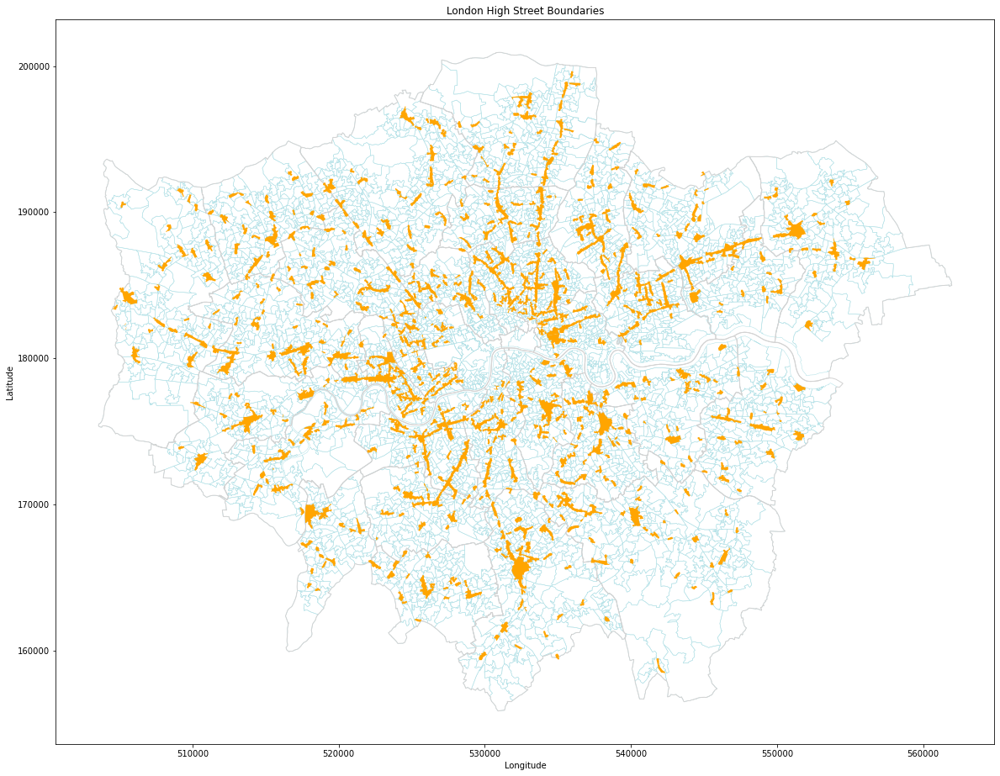

In [46]:
# plot and check
# plot and check
fig, ax = plt.subplots(figsize=(20, 20))

lsoa21.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=0.5)

borough.plot(ax=ax, facecolor='none', edgecolor='lightgrey')

high_street.plot(ax=ax, linewidth=0.5, color='orange')

ax.set_title('London High Street Boundaries')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.show()

### 3.2 Put all LSOAs level data in one dataframe (calculating for percentage changes)

1. Filter out columns we needed for deprivation and occupation;
2. Integrate the columns of age data into the groups we need;
3. Filter out the house prices in London, then calculate the average house prices for each LSOA in 2011 and 2021 (calculating the quarters that are not 0);
4. Merge these data with the lsoa geography dataframe.

#### 1) Filter out columns we needed for deprivation and occupation

In [47]:
# select lsoas codes and names
deprivation = deprivation11.iloc[:, :3]

# calculate the proportions
deprivation['deprivation11'] = ((deprivation11['All Households'] - deprivation11['deprived in: no dimensions']) / deprivation11['All Households'] * 100).round(2)

deprivation['deprivation21'] = ((deprivation21['All Households'] - deprivation21['deprived in: no dimensions']) / deprivation21['All Households'] * 100).round(2)

# there are more LSAOAs in 2021, fill NaN with 0 in 2011
# deprivation['deprivation11'] = deprivation['deprivation11'].fillna(0).round(2)

# get the changes
deprivation['deprivation'] = deprivation['deprivation21'] - deprivation['deprivation11']

# check the df
deprivation.head()

,LSOA code,local authority name,local authority code,deprivation11,deprivation21,deprivation
0,E01000001,City of London,E09000001,44.29,34.37,-9.92
1,E01000002,City of London,E09000001,40.96,34.34,-6.62
2,E01000003,City of London,E09000001,71.24,52.12,-19.12
3,E01000005,City of London,E09000001,77.09,65.61,-11.48
4,E01032739,City of London,E09000001,49.11,30.76,-18.35


In [48]:
deprivation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   LSOA code             4994 non-null   object 
 1   local authority name  4994 non-null   object 
 2   local authority code  4994 non-null   object 
 3   deprivation11         4957 non-null   float64
 4   deprivation21         4994 non-null   float64
 5   deprivation           4957 non-null   float64
dtypes: float64(3), object(3)
memory usage: 234.2+ KB


In [49]:
# Check for NaN values
nan_locations1 = deprivation.isna()
nan_rows1 = deprivation[nan_locations1.any(axis=1)]

print("Rows with NaN values:")
print(nan_rows1)

Rows with NaN values:
      LSOA code  local authority name local authority code  deprivation11  \
119   E01034478  Barking and Dagenham            E09000002            NaN   
330   E01033915                Barnet            E09000003            NaN   
336   E01033921                Barnet            E09000003            NaN   
667   E01033940                 Brent            E09000005            NaN   
669   E01033942                 Brent            E09000005            NaN   
994   E01035708                Camden            E09000007            NaN   
1222  E01034147               Croydon            E09000008            NaN   
1223  E01034148               Croydon            E09000008            NaN   
1426  E01034031                Ealing            E09000009            NaN   
1753  E01034177             Greenwich            E09000011            NaN   
1754  E01034178             Greenwich            E09000011            NaN   
1764  E01034188             Greenwich            E0900

In [50]:
# select lsoas codes and names
professions = occupation11.iloc[:, :3]

# calculate the proportions
professions['professions11'] = ((occupation11.iloc[:, 4:7].sum(axis=1)) / occupation11['All usual residents aged 16-74 in employment'] * 100).round(2)

professions['professions21'] = ((occupation21.iloc[:, 4:7].sum(axis=1)) / occupation21['All usual residents aged 16 and over in employment'] * 100).round(2)

# there are more LSAOAs in 2021, fill NaN with 0 in 2011
# professions['professions11'] = professions['professions11'].fillna(0).round(2)

professions['professions'] = professions['professions21'] - professions['professions11']

# check the df
professions.head()

,local authority code,local authority name,LSOA code,professions11,professions21,professions
0,E09000001,City of London,E01000001,88.66,90.32,1.66
1,E09000001,City of London,E01000002,87.36,93.60,6.24
2,E09000001,City of London,E01000003,72.91,79.44,6.53
3,E09000001,City of London,E01000005,46.22,48.99,2.77
4,E09000001,City of London,E01032739,84.13,85.22,1.09


In [51]:
professions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   local authority code  4994 non-null   object 
 1   local authority name  4994 non-null   object 
 2   LSOA code             4994 non-null   object 
 3   professions11         4957 non-null   float64
 4   professions21         4994 non-null   float64
 5   professions           4957 non-null   float64
dtypes: float64(3), object(3)
memory usage: 234.2+ KB


In [52]:
# Check for NaN values
nan_locations2 = professions.isna()
nan_rows2 = professions[nan_locations2.any(axis=1)]

print("Rows with NaN values:")
print(nan_rows2)

Rows with NaN values:
     local authority code  local authority name  LSOA code  professions11  \
119             E09000002  Barking and Dagenham  E01034478            NaN   
330             E09000003                Barnet  E01033915            NaN   
336             E09000003                Barnet  E01033921            NaN   
667             E09000005                 Brent  E01033940            NaN   
669             E09000005                 Brent  E01033942            NaN   
994             E09000007                Camden  E01035708            NaN   
1222            E09000008               Croydon  E01034147            NaN   
1223            E09000008               Croydon  E01034148            NaN   
1426            E09000009                Ealing  E01034031            NaN   
1753            E09000011             Greenwich  E01034177            NaN   
1754            E09000011             Greenwich  E01034178            NaN   
1764            E09000011             Greenwich  E0103

#### 2) Integrate the columns of age data into the groups we need

In [53]:
# select lsoas codes and names
age = age11.iloc[:, :3]

# divide into 5 groups and calculate the proportions
age['youth11'] = ((age11.iloc[:, 4:7].sum(axis=1)) / age11['All usual residents'] * 100).round(2)
age['working_age11'] = ((age11.iloc[:, 7:17].sum(axis=1)) / age11['All usual residents'] * 100).round(2)
age['seniors11'] = ((age11.iloc[:, 17:22].sum(axis=1)) / age11['All usual residents'] * 100).round(2)

age['youth21'] = ((age21.iloc[:, 4:7].sum(axis=1)) / age21['All usual residents'] * 100).round(2)
age['working_age21'] = ((age21.iloc[:, 7:17].sum(axis=1)) / age21['All usual residents'] * 100).round(2)
age['seniors21'] = ((age21.iloc[:, 17:22].sum(axis=1)) / age21['All usual residents'] * 100).round(2)

# fill NaN with 0
# age['youth11'] = age['youth11'].fillna(0).round(2)
# age['young_adults11'] = age['young_adults11'].fillna(0).round(2)
# age['middle_aged_adults11'] = age['middle_aged_adults11'].fillna(0).round(2)
# age['mature_adults11'] = age['mature_adults11'].fillna(0).round(2)
# age['seniors11'] = age['seniors11'].fillna(0).round(2)

# get the changes
age['youth'] = age['youth21'] - age['youth11']
age['working_age'] = age['working_age21'] - age['working_age11']
age['seniors'] = age['seniors21'] - age['seniors11']

# check the df
age.head()

,LSOA code,local authority code,local authority name,youth11,working_age11,seniors11,youth21,working_age21,seniors21,youth,working_age,seniors
0,E01000001,E09000001,City of London,7.44,74.27,18.29,8.02,66.91,25.07,0.58,-7.36,6.78
1,E01000002,E09000001,City of London,9.47,71.80,18.73,5.72,74.17,20.12,-3.75,2.37,1.39
2,E01000003,E09000001,City of London,7.36,73.77,18.87,6.68,75.57,17.75,-0.68,1.80,-1.12
3,E01000005,E09000001,City of London,15.33,71.78,12.89,11.75,78.78,9.47,-3.58,7.00,-3.42
4,E01032739,E09000001,City of London,6.13,90.23,3.64,4.28,91.88,3.84,-1.85,1.65,0.20


In [54]:
# Check for NaN values
nan_locations3 = age.isna()
nan_rows3 = age[nan_locations3.any(axis=1)]

print("Rows with NaN values:")
print(nan_rows3)

Rows with NaN values:
      LSOA code local authority code  local authority name  youth11  \
119   E01034478            E09000002  Barking and Dagenham      NaN   
330   E01033915            E09000003                Barnet      NaN   
336   E01033921            E09000003                Barnet      NaN   
667   E01033940            E09000005                 Brent      NaN   
669   E01033942            E09000005                 Brent      NaN   
994   E01035708            E09000007                Camden      NaN   
1222  E01034147            E09000008               Croydon      NaN   
1223  E01034148            E09000008               Croydon      NaN   
1426  E01034031            E09000009                Ealing      NaN   
1753  E01034177            E09000011             Greenwich      NaN   
1754  E01034178            E09000011             Greenwich      NaN   
1764  E01034188            E09000011             Greenwich      NaN   
1765  E01034189            E09000011             Greenw

#### 3) Filter out the house prices in London, then calculate the average house prices for each LSOA in 2011 and 2021 

calculating the quarters that are not 0

In [55]:
# filter out the data only in London
houseprice_LD = houseprice[houseprice['LSOA code'].isin(lsoa21['LSOA21CD'])]
houseprice_LD.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4659 entries, 28009 to 32840
Columns: 113 entries, Local authority code to Year ending Dec 2022
dtypes: object(113)
memory usage: 4.1+ MB


In [56]:
# get the indexes for columns we need
year_ending_mar_2011_index = houseprice_LD.columns.get_loc('Year ending Mar 2011')
year_ending_dec_2011_index = houseprice_LD.columns.get_loc('Year ending Dec 2011')
year_ending_mar_2021_index = houseprice_LD.columns.get_loc('Year ending Mar 2021')
year_ending_dec_2021_index = houseprice_LD.columns.get_loc('Year ending Dec 2021')

print(year_ending_mar_2011_index, year_ending_dec_2011_index, year_ending_mar_2021_index, year_ending_dec_2021_index)

65 68 105 108


In [57]:
# Replace ":" with 0
houseprice_copy = houseprice_LD.copy()
houseprice_copy.replace(':', 0, inplace=True)

# first select lsoas codes, names and prices in 2011 and 2021
selcted_houseprice = houseprice_copy.iloc[:, list(range(4)) + list(range(65, 69)) + list(range(105, 109))]

# check the df
selcted_houseprice.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4659 entries, 28009 to 32840
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Local authority code  4659 non-null   object 
 1   Local authority name  4659 non-null   object 
 2   LSOA code             4659 non-null   object 
 3   LSOA name             4659 non-null   object 
 4   Year ending Mar 2011  4659 non-null   float64
 5   Year ending Jun 2011  4659 non-null   float64
 6   Year ending Sep 2011  4659 non-null   float64
 7   Year ending Dec 2011  4659 non-null   float64
 8   Year ending Mar 2021  4659 non-null   float64
 9   Year ending Jun 2021  4659 non-null   float64
 10  Year ending Sep 2021  4659 non-null   float64
 11  Year ending Dec 2021  4659 non-null   float64
dtypes: float64(8), object(4)
memory usage: 473.2+ KB


In [58]:
# dtype float64 shoule be int64
columns_to_convert = selcted_houseprice.columns[4:12]
selcted_houseprice.loc[:, columns_to_convert] = selcted_houseprice.loc[:, columns_to_convert].astype(int)

selcted_houseprice.head()

/tmp/ipykernel_99642/1399194943.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selcted_houseprice.loc[:, columns_to_convert] = selcted_houseprice.loc[:, columns_to_convert].astype(int)


,Local authority code,Local authority name,LSOA code,LSOA name,Year ending Mar 2011,Year ending Jun 2011,Year ending Sep 2011,Year ending Dec 2011,Year ending Mar 2021,Year ending Jun 2021,Year ending Sep 2021,Year ending Dec 2021
28009,E09000001,City of London,E01000001,City of London 001A,497000,499000,518750,504999,800000,817500,820000,840000
28010,E09000001,City of London,E01000002,City of London 001B,528750,530000,500000,527500,808500,807500,822500,817500
28011,E09000001,City of London,E01000003,City of London 001C,335000,350000,431000,425150,639500,574250,545000,540000
28012,E09000001,City of London,E01000005,City of London 001E,300000,310000,305000,300000,0,0,0,0
28013,E09000001,City of London,E01032739,City of London 001F,402500,423000,423000,445000,722250,711000,652500,670000


In [59]:
# select lsoas codes and names
mean_houseprice = selcted_houseprice.iloc[:, :4]

# calculate the mean house price for each year in each lsoa
# Quarters with a value of zero are excluded
mean_houseprice['houseprice11'] = selcted_houseprice.iloc[:, 4:8][selcted_houseprice.iloc[:, 4:8] != 0].mean(axis=1).round(1)
mean_houseprice['houseprice21'] = selcted_houseprice.iloc[:, 8:12][selcted_houseprice.iloc[:, 8:12] != 0].mean(axis=1).round(1)

# change the column names to match other dataframes we get above
# mean_houseprice = mean_houseprice.rename(columns={'Local authority code': 'local authority code', 'Local authority name': 'local authority name'}, inplace=True)
mean_houseprice.columns = [col.lower() if i < 2 else col for i, col in enumerate(mean_houseprice.columns)]

# check the df
mean_houseprice.head()

,local authority code,local authority name,LSOA code,LSOA name,houseprice11,houseprice21
28009,E09000001,City of London,E01000001,City of London 001A,504937.2,819375.0
28010,E09000001,City of London,E01000002,City of London 001B,521562.5,814000.0
28011,E09000001,City of London,E01000003,City of London 001C,385287.5,574687.5
28012,E09000001,City of London,E01000005,City of London 001E,303750.0,NaN
28013,E09000001,City of London,E01032739,City of London 001F,423375.0,688937.5


In [60]:
mean_houseprice.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4659 entries, 28009 to 32840
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   local authority code  4659 non-null   object 
 1   local authority name  4659 non-null   object 
 2   LSOA code             4659 non-null   object 
 3   LSOA name             4659 non-null   object 
 4   houseprice11          4545 non-null   float64
 5   houseprice21          4543 non-null   float64
dtypes: float64(2), object(4)
memory usage: 254.8+ KB


In [61]:
mean_houseprice_changes = mean_houseprice.iloc[:, :4]
mean_houseprice_changes['houseprice'] = ((mean_houseprice['houseprice21'] - mean_houseprice['houseprice11']) *100 / mean_houseprice['houseprice11']).round(2)
mean_houseprice_changes.head()

,local authority code,local authority name,LSOA code,LSOA name,houseprice
28009,E09000001,City of London,E01000001,City of London 001A,62.27
28010,E09000001,City of London,E01000002,City of London 001B,56.07
28011,E09000001,City of London,E01000003,City of London 001C,49.16
28012,E09000001,City of London,E01000005,City of London 001E,NaN
28013,E09000001,City of London,E01032739,City of London 001F,62.73


In [62]:
# Check if there are nan values, such as items with missing house price data for the whole year
rows_with_nan = mean_houseprice[mean_houseprice_changes.isna().any(axis=1)]
print(rows_with_nan)

      local authority code  local authority name  LSOA code  \
28012            E09000001        City of London  E01000005   
28016            E09000002  Barking and Dagenham  E01000007   
28056            E09000002  Barking and Dagenham  E01000049   
28058            E09000002  Barking and Dagenham  E01000051   
28068            E09000002  Barking and Dagenham  E01000061   
...                    ...                   ...        ...   
32738            E09000033           Westminster  E01004670   
32795            E09000033           Westminster  E01004732   
32817            E09000033           Westminster  E01004754   
32827            E09000033           Westminster  E01032513   
32839            E09000033           Westminster  E01033604   

                       LSOA name  houseprice11  houseprice21  
28012        City of London 001E      303750.0           NaN  
28016  Barking and Dagenham 015A           NaN      328750.0  
28056  Barking and Dagenham 021C      135000.0        

#### 4) Merge these data with the lsoa geography dataframe

In [63]:
merged_df1 = deprivation.iloc[:, [0, 1, 2, 5]].merge(professions.iloc[:, [0, 1, 2, 5]], on='LSOA code', how='outer', suffixes=('', '*'))
merged_df1 = merged_df1.filter(regex='^[^*]*$')

# change column order
# merged_df1.insert(4, 'All usual residents aged 16 -74/16+ in employment', merged_df1.pop('All usual residents aged 16 -74/16+ in employment'))

merged_df1.head()

,LSOA code,local authority name,local authority code,deprivation,professions
0,E01000001,City of London,E09000001,-9.92,1.66
1,E01000002,City of London,E09000001,-6.62,6.24
2,E01000003,City of London,E09000001,-19.12,6.53
3,E01000005,City of London,E09000001,-11.48,2.77
4,E01032739,City of London,E09000001,-18.35,1.09


In [64]:
merged_df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4994 entries, 0 to 4993
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   LSOA code             4994 non-null   object 
 1   local authority name  4994 non-null   object 
 2   local authority code  4994 non-null   object 
 3   deprivation           4957 non-null   float64
 4   professions           4957 non-null   float64
dtypes: float64(2), object(3)
memory usage: 234.1+ KB


In [65]:
merged_df2 = merged_df1.merge(age.iloc[:, list(range(0, 3)) + list(range(9, 12))], on='LSOA code', how='outer', suffixes=('', '*'))
merged_df2 = merged_df2.filter(regex='^[^*]*$')

# change column order
# merged_df2.insert(4, 'All usual residents', merged_df2.pop('All usual residents'))

merged_df3 = pd.merge(merged_df2, mean_houseprice_changes, on='LSOA code', how='left', suffixes=('', '*')) # to select the houseprices of London only
merged_df3 = merged_df3.filter(regex='^[^*]*$')

merged_df3 = merged_df3.drop(columns=['LSOA name'])

merged_df3.head()

,LSOA code,local authority name,local authority code,deprivation,professions,youth,working_age,seniors,houseprice
0,E01000001,City of London,E09000001,-9.92,1.66,0.58,-7.36,6.78,62.27
1,E01000002,City of London,E09000001,-6.62,6.24,-3.75,2.37,1.39,56.07
2,E01000003,City of London,E09000001,-19.12,6.53,-0.68,1.80,-1.12,49.16
3,E01000005,City of London,E09000001,-11.48,2.77,-3.58,7.00,-3.42,NaN
4,E01032739,City of London,E09000001,-18.35,1.09,-1.85,1.65,0.20,62.73


In [66]:
# change the column names to match the ones of 'lsoa' dataframe
merged_df3 = merged_df3.rename(columns={'LSOA code': 'LSOA21CD'})
merged_df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4994 entries, 0 to 4993
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   LSOA21CD              4994 non-null   object 
 1   local authority name  4994 non-null   object 
 2   local authority code  4994 non-null   object 
 3   deprivation           4957 non-null   float64
 4   professions           4957 non-null   float64
 5   youth                 4957 non-null   float64
 6   working_age           4957 non-null   float64
 7   seniors               4957 non-null   float64
 8   houseprice            4470 non-null   float64
dtypes: float64(6), object(3)
memory usage: 390.2+ KB


In [67]:
lsoa_merged = pd.merge(merged_df3, lsoa21_new, on='LSOA21CD', how='left')

# adjust the column order
lsoa_merged.insert(1, 'LSOA21NM', lsoa_merged.pop('LSOA21NM'))

lsoa_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4994 entries, 0 to 4993
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   LSOA21CD              4994 non-null   object  
 1   LSOA21NM              4994 non-null   object  
 2   local authority name  4994 non-null   object  
 3   local authority code  4994 non-null   object  
 4   deprivation           4957 non-null   float64 
 5   professions           4957 non-null   float64 
 6   youth                 4957 non-null   float64 
 7   working_age           4957 non-null   float64 
 8   seniors               4957 non-null   float64 
 9   houseprice            4470 non-null   float64 
 10  geometry              4994 non-null   geometry
dtypes: float64(6), geometry(1), object(4)
memory usage: 468.2+ KB


In [68]:
# convert df to gdf
gdf_lsoa_merged = gpd.GeoDataFrame(lsoa_merged, geometry='geometry', crs='EPSG:27700')

gdf_lsoa_merged.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [69]:
gdf_lsoa_merged.head()

,LSOA21CD,LSOA21NM,local authority name,local authority code,deprivation,professions,youth,working_age,seniors,houseprice,geometry
0,E01000001,City of London 001A,City of London,E09000001,-9.92,1.66,0.58,-7.36,6.78,62.27,"POLYGON ((532105.312 182010.574, 532162.491 18..."
1,E01000002,City of London 001B,City of London,E09000001,-6.62,6.24,-3.75,2.37,1.39,56.07,"POLYGON ((532634.497 181926.016, 532619.141 18..."
2,E01000003,City of London 001C,City of London,E09000001,-19.12,6.53,-0.68,1.80,-1.12,49.16,"POLYGON ((532135.138 182198.131, 532158.250 18..."
3,E01000005,City of London 001E,City of London,E09000001,-11.48,2.77,-3.58,7.00,-3.42,NaN,"POLYGON ((533808.018 180767.774, 533649.037 18..."
4,E01032739,City of London 001F,City of London,E09000001,-18.35,1.09,-1.85,1.65,0.20,62.73,"POLYGON ((533410.692 182037.874, 533352.014 18..."


In [70]:
gdf_lsoa_merged.tail()

,LSOA21CD,LSOA21NM,local authority name,local authority code,deprivation,professions,youth,working_age,seniors,houseprice,geometry
4989,E01035718,Westminster 019G,Westminster,E09000033,-4.90,4.87,2.33,-3.17,0.85,NaN,"POLYGON ((528427.719 180115.109, 528410.126 17..."
4990,E01035719,Westminster 021F,Westminster,E09000033,-10.07,-1.35,4.05,2.52,-6.57,NaN,"POLYGON ((530276.465 178962.701, 530238.780 17..."
4991,E01035720,Westminster 021G,Westminster,E09000033,-6.65,-5.33,-3.11,2.90,0.20,NaN,"POLYGON ((529867.785 178609.306, 529892.537 17..."
4992,E01035721,Westminster 023H,Westminster,E09000033,-14.49,8.51,-1.26,3.07,-1.80,NaN,"POLYGON ((528674.775 178693.078, 528612.868 17..."
4993,E01035722,Westminster 024G,Westminster,E09000033,-10.11,1.81,0.24,-1.81,1.57,NaN,"POLYGON ((529651.808 178210.675, 529692.695 17..."


##### Replace NaN with avarage change percentages

In [71]:
column_means = gdf_lsoa_merged.iloc[:, 4:10].mean().round(2)
gdf_lsoa_merged.iloc[:, 4:10] = gdf_lsoa_merged.iloc[:, 4:10].fillna(column_means)

gdf_lsoa_merged.tail()

,LSOA21CD,LSOA21NM,local authority name,local authority code,deprivation,professions,youth,working_age,seniors,houseprice,geometry
4989,E01035718,Westminster 019G,Westminster,E09000033,-4.90,4.87,2.33,-3.17,0.85,83.08,"POLYGON ((528427.719 180115.109, 528410.126 17..."
4990,E01035719,Westminster 021F,Westminster,E09000033,-10.07,-1.35,4.05,2.52,-6.57,83.08,"POLYGON ((530276.465 178962.701, 530238.780 17..."
4991,E01035720,Westminster 021G,Westminster,E09000033,-6.65,-5.33,-3.11,2.90,0.20,83.08,"POLYGON ((529867.785 178609.306, 529892.537 17..."
4992,E01035721,Westminster 023H,Westminster,E09000033,-14.49,8.51,-1.26,3.07,-1.80,83.08,"POLYGON ((528674.775 178693.078, 528612.868 17..."
4993,E01035722,Westminster 024G,Westminster,E09000033,-10.11,1.81,0.24,-1.81,1.57,83.08,"POLYGON ((529651.808 178210.675, 529692.695 17..."



##### plot to check

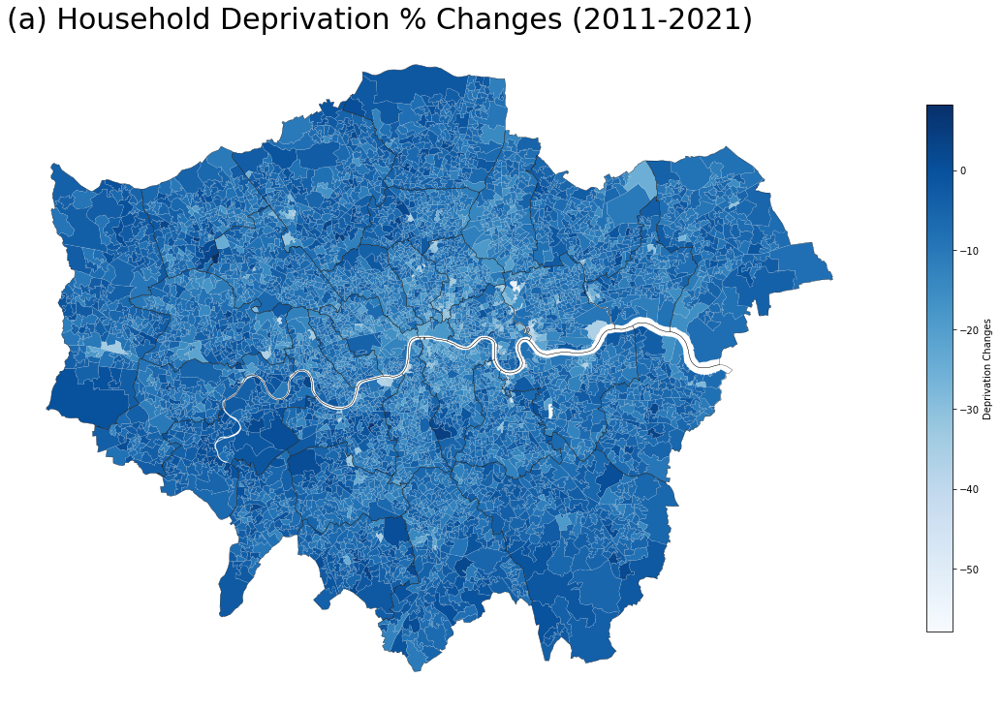

In [72]:
# plot and check
fig, ax = plt.subplots(figsize=(20, 20))

gdf_lsoa_merged.plot(ax=ax, column='deprivation',  cmap='Blues', legend=True, 
                    legend_kwds = {'label':'Deprivation Changes','shrink': 0.5}, 
                     edgecolor='lightgray', linewidth=0.1)

borough.plot(ax=ax, facecolor='none', edgecolor='Black', linewidth=0.3)

ax.set_title('(a) Household Deprivation % Changes (2011-2021)', loc='left', fontsize=30)

ax.axis('off') # turn off axis
ax.set_xticks([])
ax.set_yticks([])

plt.show()

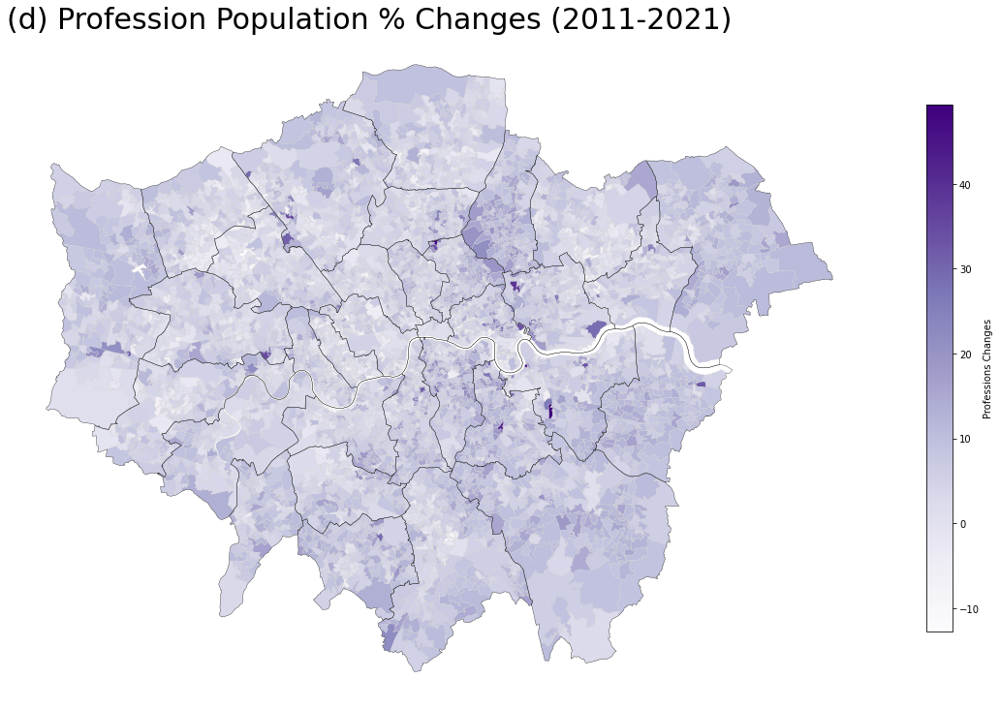

In [73]:
# plot and check
fig, ax = plt.subplots(figsize=(20, 20))

gdf_lsoa_merged.plot(ax=ax, column='professions',  cmap='Purples', legend=True, legend_kwds = {'label':'Professions Changes','shrink': 0.5}, 
                     edgecolor='lightgray', linewidth=0.3)

borough.plot(ax=ax, facecolor='none', edgecolor='Black', linewidth=0.3)

ax.set_title('(d) Profession Population % Changes (2011-2021)',  loc='left', fontsize=30)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

ax.axis('off') # turn off axis
ax.set_xticks([])
ax.set_yticks([])

plt.show()

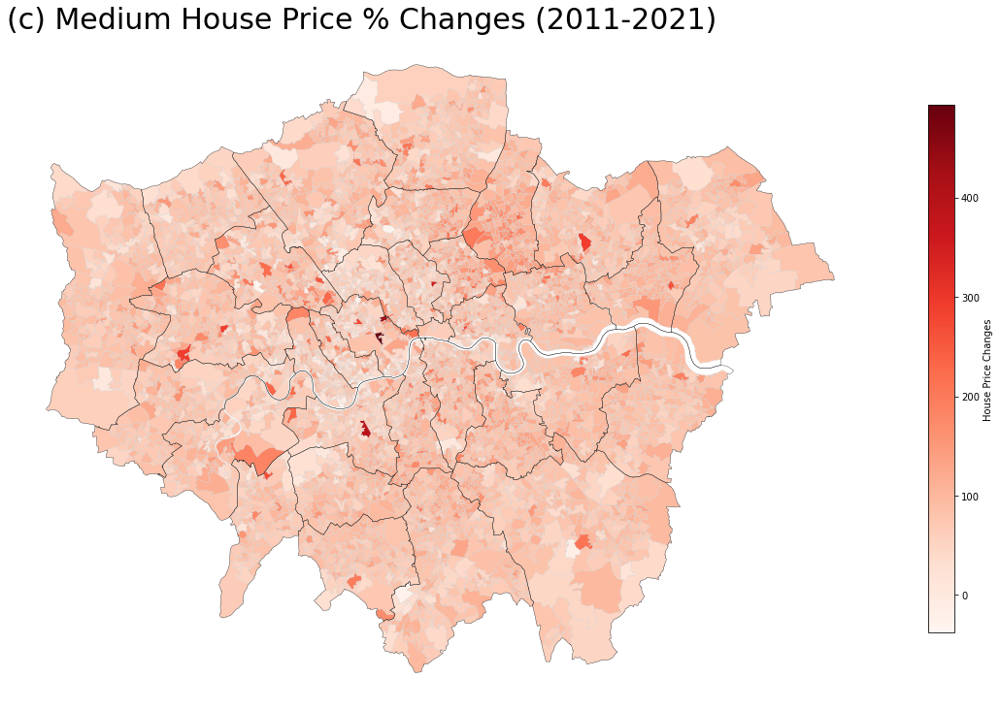

In [74]:
# plot and check
fig, ax = plt.subplots(figsize=(20, 20))

gdf_lsoa_merged.plot(ax=ax, column='houseprice',  cmap='Reds', legend=True, legend_kwds = {'label':'House Price Changes','shrink': 0.5}, 
                     edgecolor='lightgray', linewidth=0.3)

borough.plot(ax=ax, facecolor='none', edgecolor='Black', linewidth=0.3)

ax.set_title('(c) Medium House Price % Changes (2011-2021)',  loc='left', fontsize=30)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

ax.axis('off') # turn off axis
ax.set_xticks([])
ax.set_yticks([])

plt.show()

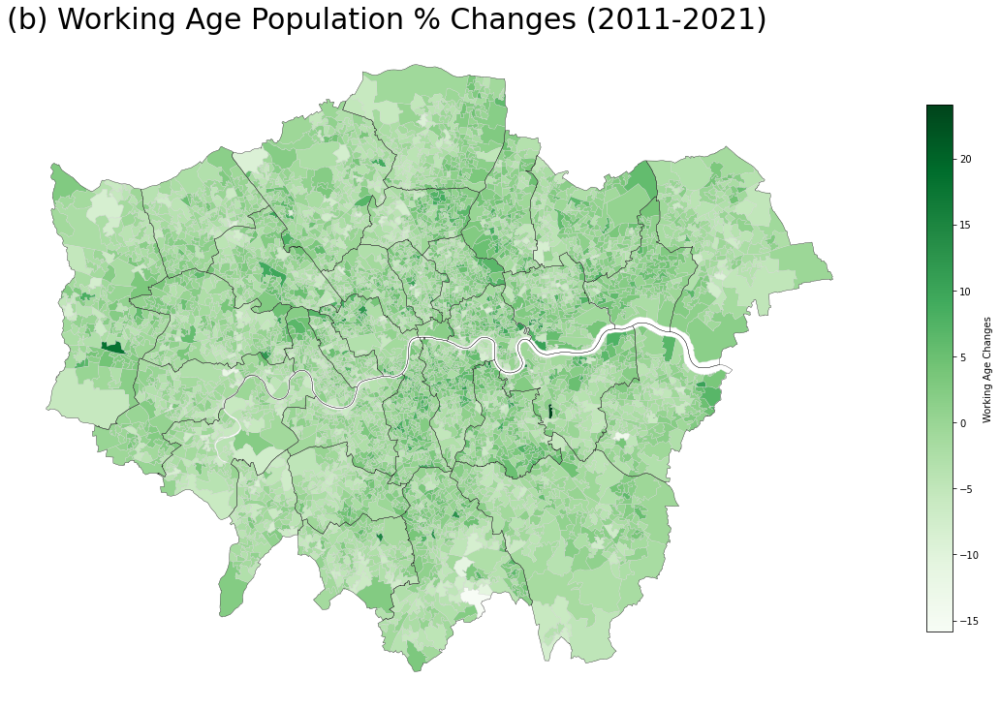

In [75]:
# plot and check
fig, ax = plt.subplots(figsize=(20, 20))

gdf_lsoa_merged.plot(ax=ax, column='working_age',  cmap='Greens', legend=True, legend_kwds = {'label':'Working Age Changes','shrink': 0.5}, 
                     edgecolor='lightgray', linewidth=0.3)

borough.plot(ax=ax, facecolor='none', edgecolor='Black', linewidth=0.3)

ax.set_title('(b) Working Age Population % Changes (2011-2021)',  loc='left', fontsize=30)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

ax.axis('off') # turn off axis
ax.set_xticks([])
ax.set_yticks([])

plt.show()

### 3.3 Filter out the high streets and lsoas of the study area

Waltham Forest

#### 1) Filter out high streets

In [76]:
# join the hs boundary with selected borough
wf_highstreet = gpd.sjoin(high_street, borough[borough['name'].str.contains('Waltham Forest')], predicate='within')

# select columns we need and rename them
wf_highstreet = wf_highstreet[['highstreet_id', 'highstreet_name', 'area_ha', 'gdb_geomattr_data', 'name', 'gss_code', 'geometry']]
wf_highstreet = wf_highstreet.rename(columns={'gss_code': 'LAD11CD', 'name': 'BoroughNM'})

wf_highstreet.head()

,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,geometry
242,237,"Billet Road, Walthamstow.",4.395863,None,Waltham Forest,E09000031,"POLYGON ((536538.954 190900.525, 536542.912 19..."
250,244,"Forest Road (Pembar Avenue), Blackhorse Road",5.781402,None,Waltham Forest,E09000031,"POLYGON ((536387.113 189539.524, 536388.069 18..."
255,249,"Burnside Avenue, Walthamstow.",7.221877,None,Waltham Forest,E09000031,"POLYGON ((537128.872 191807.945, 537130.364 19..."
256,250,"Chingford Mount Road, Walthamstow.",9.698066,None,Waltham Forest,E09000031,"POLYGON ((537509.991 191894.780, 537509.035 19..."
258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,"POLYGON ((537451.583 192633.269, 537451.715 19..."


In [77]:
csv_hs = os.path.join('Data', "wf_highstreet.csv")
wf_highstreet.to_csv(csv_hs, index=False)
print(f"DataFrame saved in {csv_hs}")

DataFrame saved in Data/wf_highstreet.csv


#### 2) Waltham Forest LSOA and Variables

In [78]:
wf_borough = borough[borough['name'].str.contains('Waltham Forest')]

wf_lsoa = gdf_lsoa_merged[gdf_lsoa_merged['LSOA21NM'].str.contains('Waltham Forest')]

wf_lsoa.head()

,LSOA21CD,LSOA21NM,local authority name,local authority code,deprivation,professions,youth,working_age,seniors,houseprice,geometry
4539,E01004327,Waltham Forest 028A,Waltham Forest,E09000031,-10.06,12.82,2.08,0.44,-2.52,142.15,"POLYGON ((539738.262 186535.091, 539762.948 18..."
4540,E01004328,Waltham Forest 028B,Waltham Forest,E09000031,-8.61,9.36,1.62,-3.20,1.58,140.06,"POLYGON ((539425.622 186339.169, 539416.149 18..."
4541,E01004329,Waltham Forest 028C,Waltham Forest,E09000031,-13.37,11.10,-1.09,-1.06,2.15,145.93,"POLYGON ((539906.047 186314.947, 539940.976 18..."
4542,E01004330,Waltham Forest 028D,Waltham Forest,E09000031,-10.96,16.07,-1.34,-1.42,2.76,147.22,"POLYGON ((539455.978 186230.423, 539496.056 18..."
4543,E01004331,Waltham Forest 028E,Waltham Forest,E09000031,-13.85,15.33,-1.30,-0.72,2.02,158.96,"POLYGON ((540216.570 185919.303, 540149.151 18..."


In [79]:
wf_borough

,objectid,name,gss_code,hectares,nonld_area,ons_inner,sub_2011,geometry
14,15,Waltham Forest,E09000031,3880.793,0.0,F,East,"POLYGON ((539923.100 191863.100, 539928.100 19..."


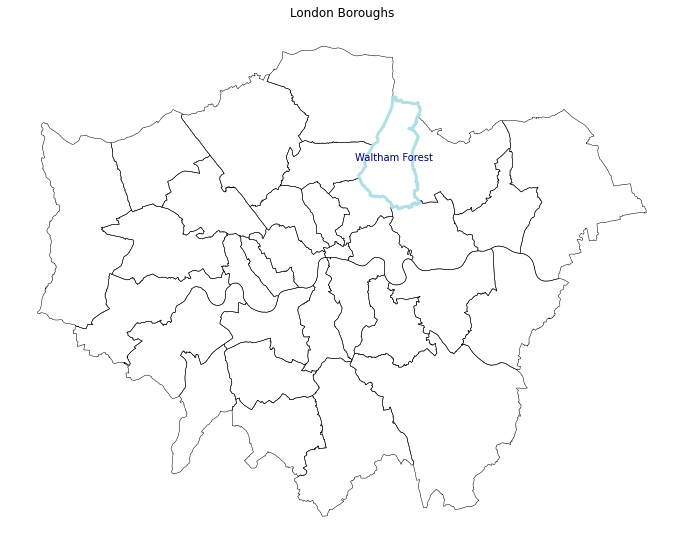

In [80]:
fig, ax = plt.subplots(figsize=(12, 12))
ax.set_facecolor('white')

borough.plot(ax=ax, facecolor='none', edgecolor='Black', linewidth=0.5)
wf_borough.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=3)

for index, row in wf_borough.iterrows():
    borough_name = row['name']
    centroid = row['geometry'].centroid
    ax.text(centroid.x, centroid.y, borough_name, fontsize=10, color='Navy', ha='center', va='center')

ax.set_title('London Boroughs')

ax.axis('off') # turn off axis
ax.set_xticks([])
ax.set_yticks([])
ax.grid(False) # turn off the grids

plt.show()

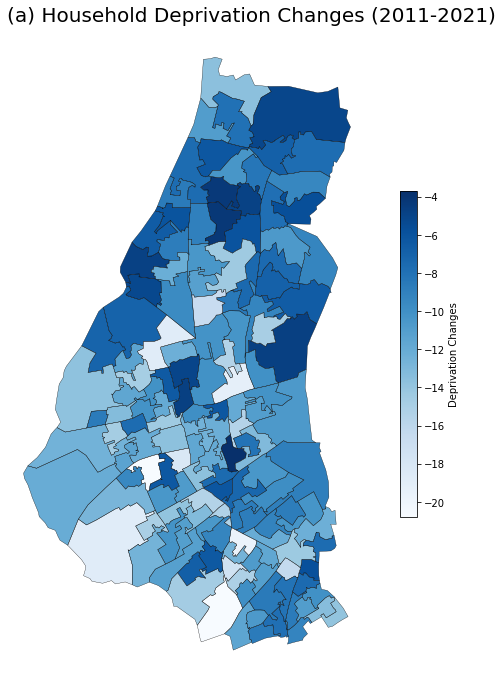

In [81]:
# plot and check
fig, ax = plt.subplots(figsize=(12, 12))

wf_lsoa.plot(ax=ax, column='deprivation',  cmap='Blues', legend=True, legend_kwds = {'label':'Deprivation Changes','shrink': 0.5})

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='Black', linewidth=0.3)

ax.set_title('(a) Household Deprivation Changes (2011-2021)', loc='left', fontsize=20)

ax.axis('off') # turn off axis
ax.set_xticks([])
ax.set_yticks([])

plt.show()

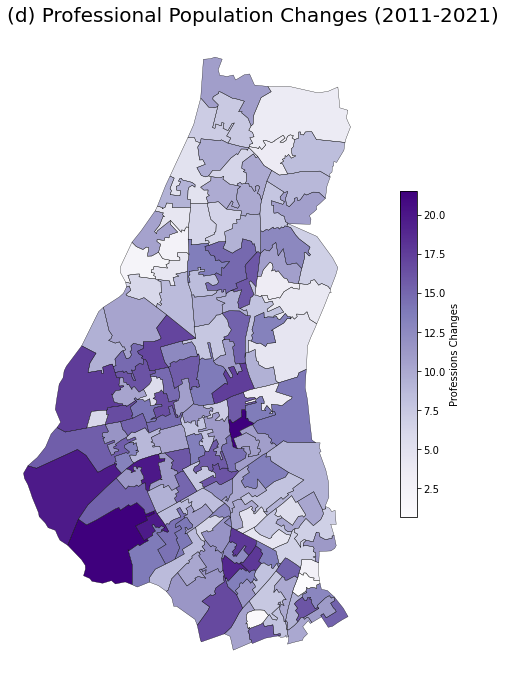

In [82]:
# plot and check
fig, ax = plt.subplots(figsize=(12, 12))

wf_lsoa.plot(ax=ax, column='professions',  cmap='Purples', legend=True, legend_kwds = {'label':'Professions Changes','shrink': 0.5})

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='Black', linewidth=0.3)

ax.set_title('(d) Professional Population Changes (2011-2021)', loc='left', fontsize=20)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')


ax.axis('off') # turn off axis
ax.set_xticks([])
ax.set_yticks([])

plt.show()

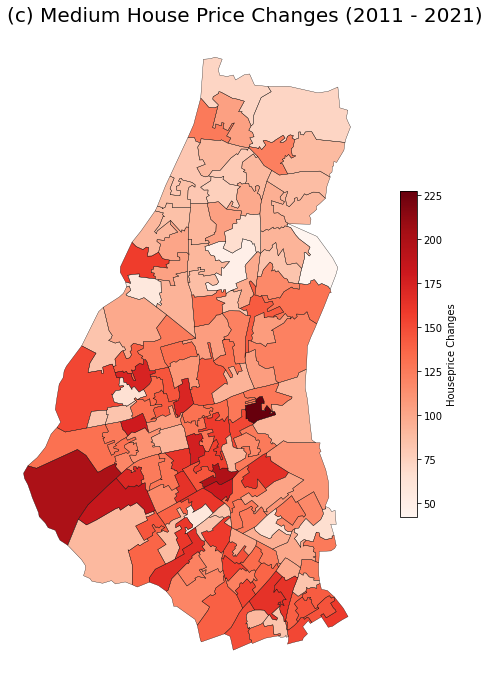

In [83]:
# plot and check
fig, ax = plt.subplots(figsize=(12, 12))

wf_lsoa.plot(ax=ax, column='houseprice',  cmap='Reds', legend=True, legend_kwds = {'label':'Houseprice Changes','shrink': 0.5})

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='Black', linewidth=0.3)

ax.set_title('(c) Medium House Price Changes (2011 - 2021)', loc='left', fontsize=20)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')


ax.axis('off') # turn off axis
ax.set_xticks([])
ax.set_yticks([])

plt.show()

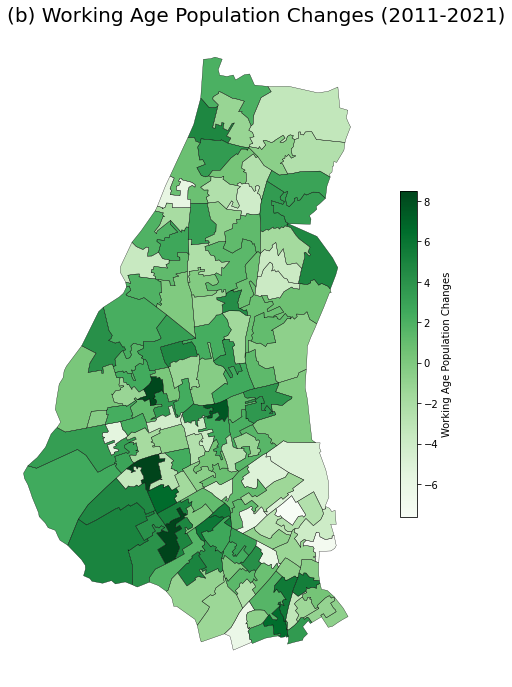

In [84]:
# plot and check
fig, ax = plt.subplots(figsize=(12, 12))

wf_lsoa.plot(ax=ax, column='working_age',  cmap='Greens', legend=True, legend_kwds = {'label':'Working Age Population Changes','shrink': 0.5})

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='Black', linewidth=0.3)

ax.set_title('(b) Working Age Population Changes (2011-2021)',loc='left', fontsize=20)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

ax.axis('off') # turn off axis
ax.set_xticks([])
ax.set_yticks([])

plt.show()

##### plot to check high streets boundaries

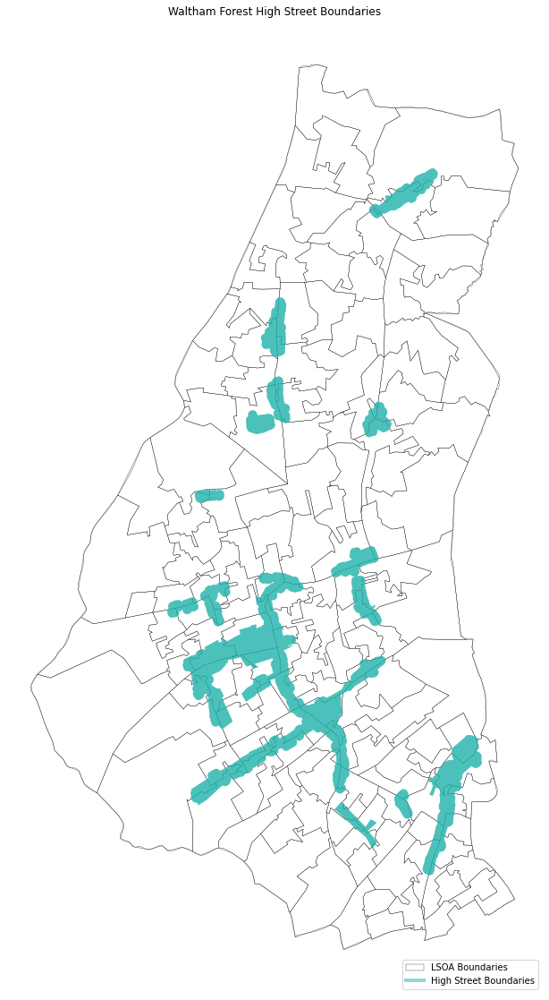

In [85]:
# plot and check
fig, ax = plt.subplots(figsize=(20, 20))

wf_borough.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.3)

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='Black', linewidth=0.3)
wf_highstreet.plot(ax=ax, linewidth=0.5, facecolor='lightseagreen', edgecolor = 'lightseagreen', alpha=0.8)

ax.set_title('Waltham Forest High Street Boundaries')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# create legend
lsoa_patch = mpatches.Patch(facecolor='none', edgecolor='black', linewidth=0.3, label='LSOA Boundaries')
highstreet_line = mlines.Line2D([], [], color='lightseagreen', linewidth=4, alpha=0.5, label='High Street Boundaries')

# add legend
ax.legend(handles=[lsoa_patch, highstreet_line], loc='lower right', bbox_to_anchor=(1, 0))

ax.axis('off') # turn off axis
ax.set_xticks([])
ax.set_yticks([])

plt.show()

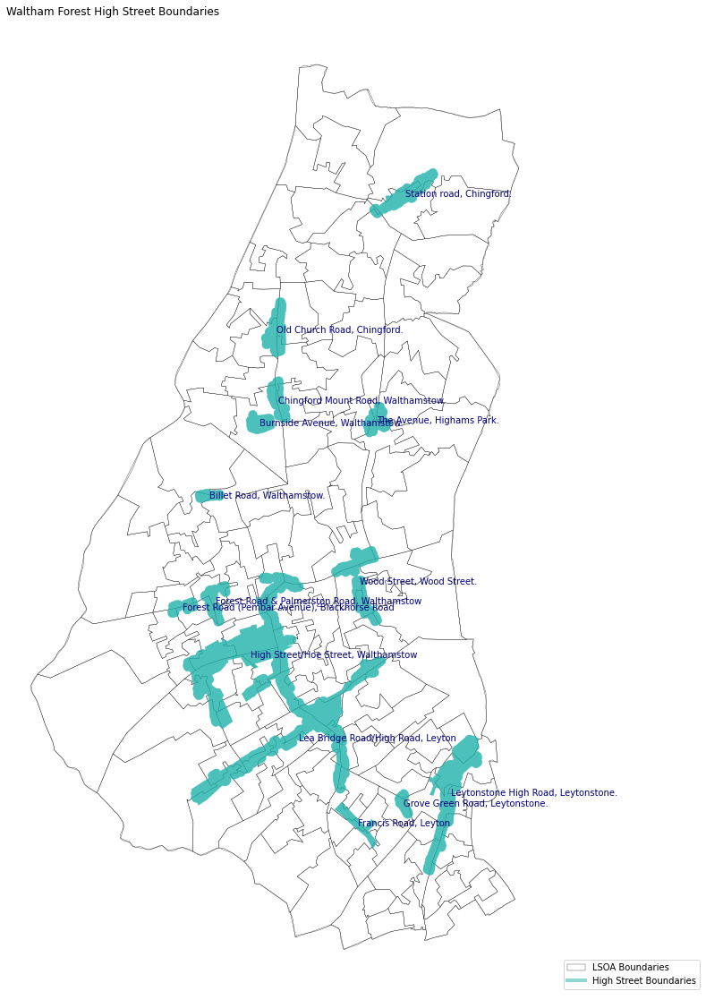

In [86]:
# plot and check
fig, ax = plt.subplots(figsize=(20, 20))

wf_borough.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.3)

wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='Black', linewidth=0.3)
wf_highstreet.plot(ax=ax, linewidth=0.5, facecolor='lightseagreen', edgecolor = 'lightseagreen', alpha=0.8)

ax.set_title('Waltham Forest High Street Boundaries', loc='left', fontsize=12)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

for index, row in wf_highstreet.iterrows():
    highstreet_name = row['highstreet_name']
    centroid = row['geometry'].centroid
    ax.text(centroid.x, centroid.y, highstreet_name, fontsize=10, color='navy', ha='left', va='center')


# add legend
ax.legend(handles=[lsoa_patch, highstreet_line], loc='lower right', bbox_to_anchor=(1.3, 0))

ax.axis('off') # turn off axis
ax.set_xticks([])
ax.set_yticks([])

plt.show()

#### 3) Merge those connected high streets

We will also merge polygons that are very close but not adjacent, so add a distance threshold to the condition for judging whether they are adjacent. 

Use the `distance` function in the `shapely` library to achieve, set distance=50 (unit:meters) .

In [87]:
gdf = wf_highstreet.copy()

# create buffer zone
gdf['buffer_area'] = gdf.geometry.buffer(50)

# merge intersected polygon
merged_rows = []
visited_indices = set()

for i, row1 in gdf.iterrows():
    if i not in visited_indices:
        overlapping_indices = [i]
        overlapping_geometries = [row1['geometry']]
        
        for j, row2 in gdf.iterrows():
            if i != j and row1['buffer_area'].intersects(row2['buffer_area']):
                overlapping_indices.append(j)
                overlapping_geometries.append(row2['geometry'])
                visited_indices.add(j)
        
        if len(overlapping_geometries) > 1:
            merged_geometry = cascaded_union(overlapping_geometries)
            merged_row = row1.copy()
            merged_row['geometry'] = merged_geometry
            merged_row['merged_hs'] = 'merged'
            merged_rows.append(merged_row)
        else:
            merged_rows.append(row1)
            
# create new gdf to save the results
merged_gdf = gpd.GeoDataFrame(merged_rows, crs=gdf.crs)

merged_gdf = merged_gdf.reset_index()

merged_gdf

/tmp/ipykernel_99642/1225253521.py:22: ShapelyDeprecationWarning: The 'cascaded_union()' function is deprecated. Use 'unary_union()' instead.
  merged_geometry = cascaded_union(overlapping_geometries)
/tmp/ipykernel_99642/1225253521.py:22: ShapelyDeprecationWarning: The 'cascaded_union()' function is deprecated. Use 'unary_union()' instead.
  merged_geometry = cascaded_union(overlapping_geometries)
/tmp/ipykernel_99642/1225253521.py:22: ShapelyDeprecationWarning: The 'cascaded_union()' function is deprecated. Use 'unary_union()' instead.
  merged_geometry = cascaded_union(overlapping_geometries)


,index,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,geometry,buffer_area,merged_hs
0,242,237,"Billet Road, Walthamstow.",4.395863,None,Waltham Forest,E09000031,"POLYGON ((536538.954 190900.525, 536542.912 19...",POLYGON ((536317.1279748465 190793.49168352372...,NaN
1,250,244,"Forest Road (Pembar Avenue), Blackhorse Road",5.781402,None,Waltham Forest,E09000031,"MULTIPOLYGON (((536388.069 189529.767, 536387....","POLYGON ((535976.1294545642 189418.4748457088,...",merged
2,255,249,"Burnside Avenue, Walthamstow.",7.221877,None,Waltham Forest,E09000031,"MULTIPOLYGON (((537130.364 191807.225, 537155....",POLYGON ((536932.1837392963 191734.05490058535...,merged
3,258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,"POLYGON ((537451.583 192633.269, 537451.715 19...",POLYGON ((537114.3598635946 192747.22868296417...,NaN
4,263,257,"Grove Green Road, Leytonstone.",4.605851,None,Waltham Forest,E09000031,"POLYGON ((538947.848 186917.325, 538938.094 18...",POLYGON ((538742.4465305256 187192.56284856045...,NaN
5,403,397,"The Avenue, Highams Park.",9.215191,None,Waltham Forest,E09000031,"POLYGON ((538679.256 191889.252, 538684.327 19...",POLYGON ((538367.7122723864 191623.83327590418...,NaN
6,474,466,"Francis Road, Leyton",6.813432,None,Waltham Forest,E09000031,"POLYGON ((538057.472 187025.286, 538112.679 18...",POLYGON ((538028.7776765112 186984.33963686196...,NaN
7,515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,"POLYGON ((539839.361 187616.515, 539842.206 18...","POLYGON ((539083.870988097 186329.85026445508,...",NaN
8,519,507,"Wood Street, Wood Street.",21.766876,None,Waltham Forest,E09000031,"POLYGON ((538548.242 190188.508, 538559.398 19...","POLYGON ((537969.8181828558 189887.1579009944,...",NaN
9,520,508,"High Street/Hoe Street, Walthamstow",95.428617,None,Waltham Forest,E09000031,"POLYGON ((537813.332 188310.594, 537812.973 18...","POLYGON ((536168.2661723318 188803.6199209405,...",merged


In [88]:
merged_hs = merged_gdf.drop(columns=['merged_hs', 'buffer_area'])

merged_hs.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

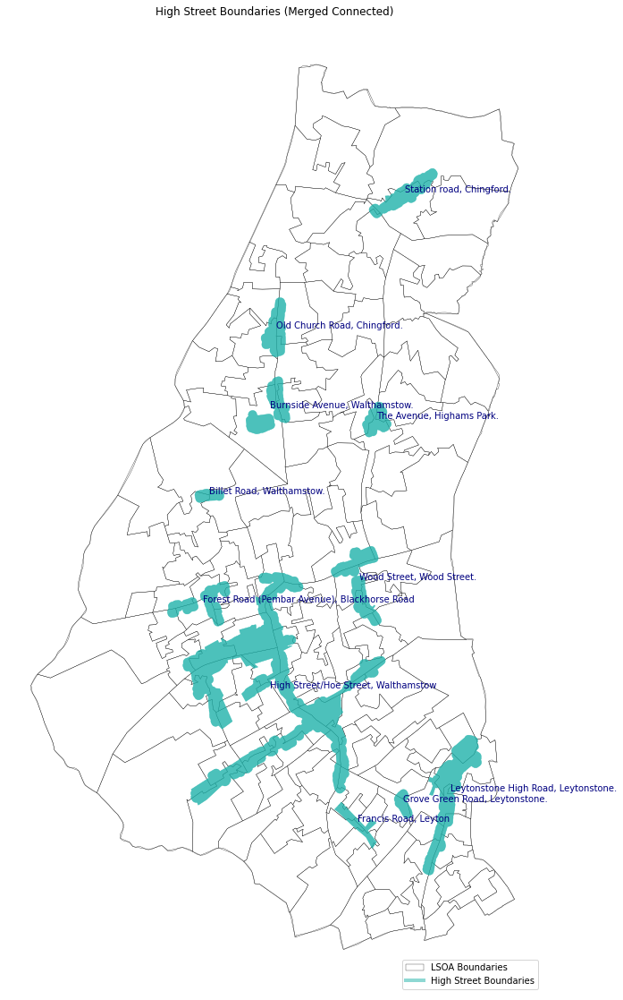

In [89]:
# plot and check
fig, ax = plt.subplots(figsize=(20, 20))

wf_borough.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.3)
wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='Black', linewidth=0.3)
merged_hs.plot(ax=ax, linewidth=0.5, facecolor='lightseagreen', edgecolor = 'lightseagreen', alpha=0.8)

ax.set_title('High Street Boundaries (Merged Connected)')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

for index, row in merged_hs.iterrows():
    highstreet_name = row['highstreet_name']
    centroid = row['geometry'].centroid
    ax.text(centroid.x, centroid.y, highstreet_name, fontsize=10, color='navy', ha='left', va='bottom')

# create legend
lsoa_patch = mpatches.Patch(facecolor='none', edgecolor='black', linewidth=0.3, label='LSOA Boundaries')
highstreet_line = mlines.Line2D([], [], color='lightseagreen', linewidth=4, alpha=0.5, label='High Street Boundaries')

# add legend
ax.legend(handles=[lsoa_patch, highstreet_line], loc='lower right', bbox_to_anchor=(1, 0))

ax.axis('off') # turn off axis
ax.set_xticks([])
ax.set_yticks([])

plt.show()

### 3.4 Add geographic information to openlocal data, and filter data for Waltham Forest

1. Match openlocal's postcode with ons postcode dictionary;

2. Get the composition of category (overview).

##### check the files first

In [90]:
openlocal11_wf.head()

,rates_code,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,pc__pcs,use_category,...,valuation_date,revaluation_year,period,rates_expected,name,rates_paid,status,status_date,status_duration,ratepayers_published
0,00000000510140,E09000031,Waltham Forest,Outer London - East and North East,8745032000,14,LEYTON GRANGE ESTATE,LONDON,E10 5HN,Offices (Inc Computer Centres),...,2010-04-29 00:00:00+00:00,2010,2011-03,1221.00,NaN,NaN,True,2010-04-29,NaN,True
1,00000001023335,E09000031,Waltham Forest,Outer London - East and North East,2977620000,UNIT 5 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,2010-04-01 00:00:00+00:00,2010,2011-03,11599.50,NaN,NaN,True,2010-04-01,NaN,True
2,0000000102334A,E09000031,Waltham Forest,Outer London - East and North East,2976536000,UNIT 6 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,2010-04-01 00:00:00+00:00,2010,2011-03,11904.75,CAPITAL TSHIRTS LIMITED,14607.25,True,1997-05-01,5083.0,True
3,00000001023354,E09000031,Waltham Forest,Outer London - East and North East,2975207000,UNIT 7 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,2010-04-01 00:00:00+00:00,2010,2011-03,10683.75,NaN,NaN,True,2010-04-01,NaN,True
4,00000001023369,E09000031,Waltham Forest,Outer London - East and North East,2975617000,UNIT 8 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,2010-04-01 00:00:00+00:00,2010,2011-03,10887.25,THE TEXTILE CENTRE LTD,13257.00,True,2007-09-12,1297.0,True


In [91]:
openlocal11_wf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4582 entries, 0 to 4581
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   rates_code            4582 non-null   object 
 1   rates_authority_id    4582 non-null   object 
 2   rates_authority       4582 non-null   object 
 3   region                4582 non-null   object 
 4   location_code         4582 non-null   int64  
 5   address_no            4582 non-null   object 
 6   address_street        4546 non-null   object 
 7   address_town          4582 non-null   object 
 8   pc__pcs               4582 non-null   object 
 9   use_category          4582 non-null   object 
 10  scat_code             4582 non-null   int64  
 11  sub_category          4582 non-null   object 
 12  category              4283 non-null   object 
 13  floor_area            4582 non-null   float64
 14  rental_valuation      4582 non-null   float64
 15  valuation_date       

In [92]:
# some dtypes need to be changed

# scat_code, location_code should be object not numbers
openlocal11_wf['scat_code'] = openlocal11_wf['scat_code'].astype('object')
openlocal11_wf['location_code'] = openlocal11_wf['location_code'].astype('object')

# Convert object dtype to datetime type
openlocal11_wf['status_date'] = pd.to_datetime(openlocal11_wf['status_date'])
openlocal11_wf['period'] = pd.to_datetime(openlocal11_wf['period'])

openlocal11_wf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4582 entries, 0 to 4581
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   rates_code            4582 non-null   object        
 1   rates_authority_id    4582 non-null   object        
 2   rates_authority       4582 non-null   object        
 3   region                4582 non-null   object        
 4   location_code         4582 non-null   object        
 5   address_no            4582 non-null   object        
 6   address_street        4546 non-null   object        
 7   address_town          4582 non-null   object        
 8   pc__pcs               4582 non-null   object        
 9   use_category          4582 non-null   object        
 10  scat_code             4582 non-null   object        
 11  sub_category          4582 non-null   object        
 12  category              4283 non-null   object        
 13  floor_area        

In [93]:
openlocal21_wf.head()

,rates_code,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,pc__pcs,use_category,...,valuation_date,revaluation_year,period,rates_expected,name,rates_paid,status,status_date,status_duration,ratepayers_published
0,0000000022016166,E09000031,Waltham Forest,Outer London - East and North East,11244514000,BUXTON SCHOOL,CANN HALL ROAD,LONDON,E11 3NN,Local Authority Schools (National Scheme),...,2017-12-20 00:00:00+00:00,2017,2021-03,212480.00,NaN,NaN,True,2017-12-20,NaN,True
1,00000000510140,E09000031,Waltham Forest,Outer London - East and North East,8745032000,14,LEYTON GRANGE ESTATE,LONDON,E10 5HN,Offices (Inc Computer Centres),...,2017-04-01 00:00:00+00:00,2017,2021-03,2195.60,NaN,NaN,True,2017-04-01,NaN,True
2,0000000101,E09000031,Waltham Forest,Outer London - East and North East,12549805000,SUITE 101 GND FLR OCEANAIR HOUSE 750-760,HIGH ROAD LEYTONSTONE,LONDON,E11 3AW,Offices (Inc Computer Centres),...,2019-04-01 00:00:00+00:00,2017,2021-03,3243.50,NaN,NaN,True,2019-04-01,NaN,True
3,0000000102,E09000031,Waltham Forest,Outer London - East and North East,12549819000,SUITE 102 GND FLR OCEANAIR HSE 750-760,HIGH ROAD LEYTONSTONE,LONDON,E11 3AW,Offices (Inc Computer Centres),...,2019-04-01 00:00:00+00:00,2017,2021-03,2070.85,NaN,NaN,True,2019-04-01,NaN,True
4,00000001023335,E09000031,Waltham Forest,Outer London - East and North East,2977620000,UNIT 5 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,2017-04-01 00:00:00+00:00,2017,2021-03,14471.00,NaN,NaN,True,2017-04-01,NaN,True


In [94]:
openlocal21_wf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6968 entries, 0 to 6967
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   rates_code            6968 non-null   object 
 1   rates_authority_id    6968 non-null   object 
 2   rates_authority       6968 non-null   object 
 3   region                6968 non-null   object 
 4   location_code         6968 non-null   int64  
 5   address_no            6968 non-null   object 
 6   address_street        6922 non-null   object 
 7   address_town          6968 non-null   object 
 8   pc__pcs               6968 non-null   object 
 9   use_category          6968 non-null   object 
 10  scat_code             6968 non-null   int64  
 11  sub_category          6968 non-null   object 
 12  category              6282 non-null   object 
 13  floor_area            6968 non-null   float64
 14  rental_valuation      6968 non-null   float64
 15  valuation_date       

In [95]:
# some dtypes need to be changed

# scat_code, location_code should be object not numbers
openlocal21_wf['scat_code'] = openlocal21_wf['scat_code'].astype('object')
openlocal21_wf['location_code'] = openlocal21_wf['location_code'].astype('object')

# Convert object dtype to datetime type
openlocal21_wf['status_date'] = pd.to_datetime(openlocal21_wf['status_date'])
openlocal21_wf['period'] = pd.to_datetime(openlocal21_wf['period'])

openlocal21_wf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6968 entries, 0 to 6967
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   rates_code            6968 non-null   object        
 1   rates_authority_id    6968 non-null   object        
 2   rates_authority       6968 non-null   object        
 3   region                6968 non-null   object        
 4   location_code         6968 non-null   object        
 5   address_no            6968 non-null   object        
 6   address_street        6922 non-null   object        
 7   address_town          6968 non-null   object        
 8   pc__pcs               6968 non-null   object        
 9   use_category          6968 non-null   object        
 10  scat_code             6968 non-null   object        
 11  sub_category          6968 non-null   object        
 12  category              6282 non-null   object        
 13  floor_area        

***Datatypes of 'period' and 'status_date' need to be converted to datetime for duration calculation later***

In [96]:
onspd.head()

,pcd,pcd2,pcds,dointr,doterm,oscty,ced,oslaua,osward,parish,...,long,lep1,lep2,pfa,imd,calncv,icb,oa21,lsoa21,msoa21
0,AB1 0AA,AB1 0AA,AB1 0AA,198001,199606.0,S99999999,S99999999,S12000033,S13002843,S99999999,...,-2.242851,S99999999,NaN,S23000009,6715,S99999999,S99999999,NaN,NaN,NaN
1,AB1 0AB,AB1 0AB,AB1 0AB,198001,199606.0,S99999999,S99999999,S12000033,S13002843,S99999999,...,-2.246308,S99999999,NaN,S23000009,6715,S99999999,S99999999,NaN,NaN,NaN
2,AB1 0AD,AB1 0AD,AB1 0AD,198001,199606.0,S99999999,S99999999,S12000033,S13002843,S99999999,...,-2.248342,S99999999,NaN,S23000009,6715,S99999999,S99999999,NaN,NaN,NaN
3,AB1 0AE,AB1 0AE,AB1 0AE,199402,199606.0,S99999999,S99999999,S12000034,S13002864,S99999999,...,-2.255708,S99999999,NaN,S23000009,5069,S99999999,S99999999,NaN,NaN,NaN
4,AB1 0AF,AB1 0AF,AB1 0AF,199012,199207.0,S99999999,S99999999,S12000033,S13002843,S99999999,...,-2.258102,S99999999,NaN,S23000009,6253,S99999999,S99999999,NaN,NaN,NaN


In [97]:
onspd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2690851 entries, 0 to 2690850
Data columns (total 53 columns):
 #   Column     Dtype  
---  ------     -----  
 0   pcd        object 
 1   pcd2       object 
 2   pcds       object 
 3   dointr     int64  
 4   doterm     float64
 5   oscty      object 
 6   ced        object 
 7   oslaua     object 
 8   osward     object 
 9   parish     object 
 10  usertype   int64  
 11  oseast1m   float64
 12  osnrth1m   float64
 13  osgrdind   int64  
 14  oshlthau   object 
 15  nhser      object 
 16  ctry       object 
 17  rgn        object 
 18  streg      object 
 19  pcon       object 
 20  eer        object 
 21  teclec     object 
 22  ttwa       object 
 23  pct        object 
 24  itl        object 
 25  statsward  object 
 26  oa01       object 
 27  casward    object 
 28  park       object 
 29  lsoa01     object 
 30  msoa01     object 
 31  ur01ind    object 
 32  oac01      object 
 33  oa11       object 
 34  lsoa11     object 

#### 1) Match openlocal's postcode with ons postcode dictionary

In [98]:
onspd_selected = onspd[['pcds', 'lat', 'long']]

onspd_selected.head()

,pcds,lat,long
0,AB1 0AA,57.101474,-2.242851
1,AB1 0AB,57.102554,-2.246308
2,AB1 0AD,57.100556,-2.248342
3,AB1 0AE,57.084444,-2.255708
4,AB1 0AF,57.096656,-2.258102


Match pcd with coordinates for 2011 Waltham Forest data

In [99]:
openlocal11_wf_coor = pd.merge(openlocal11_wf, onspd_selected, left_on='pc__pcs', right_on='pcds')

# WGS84 coordinates (long, lat)

geometry11_wf = [Point(xy) for xy in zip(openlocal11_wf_coor['long'], openlocal11_wf_coor['lat'])]

geo_openlocal11_wf = gpd.GeoDataFrame(openlocal11_wf_coor, geometry=geometry11_wf)

geo_openlocal11_wf.head()

,rates_code,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,pc__pcs,use_category,...,name,rates_paid,status,status_date,status_duration,ratepayers_published,pcds,lat,long,geometry
0,00000000510140,E09000031,Waltham Forest,Outer London - East and North East,8745032000,14,LEYTON GRANGE ESTATE,LONDON,E10 5HN,Offices (Inc Computer Centres),...,NaN,NaN,True,2010-04-29,NaN,True,E10 5HN,51.564894,-0.019575,POINT (-0.01957 51.56489)
1,00000001023335,E09000031,Waltham Forest,Outer London - East and North East,2977620000,UNIT 5 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,NaN,NaN,True,2010-04-01,NaN,True,E10 7FB,51.572346,-0.041360,POINT (-0.04136 51.57235)
2,0000000102334A,E09000031,Waltham Forest,Outer London - East and North East,2976536000,UNIT 6 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,CAPITAL TSHIRTS LIMITED,14607.25,True,1997-05-01,5083.0,True,E10 7FB,51.572346,-0.041360,POINT (-0.04136 51.57235)
3,00000001023354,E09000031,Waltham Forest,Outer London - East and North East,2975207000,UNIT 7 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,NaN,NaN,True,2010-04-01,NaN,True,E10 7FB,51.572346,-0.041360,POINT (-0.04136 51.57235)
4,00000001023369,E09000031,Waltham Forest,Outer London - East and North East,2975617000,UNIT 8 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,THE TEXTILE CENTRE LTD,13257.00,True,2007-09-12,1297.0,True,E10 7FB,51.572346,-0.041360,POINT (-0.04136 51.57235)


In [100]:
# set CRS for geo_openlocal11_wf, the CRS is WGS 84

geo_openlocal11_wf = geo_openlocal11_wf.set_crs('EPSG:4326')

# define transformer: crs4326 to crs27700
crs_4326 = pyproj.CRS('EPSG:4326')
crs_27700 = pyproj.CRS('EPSG:27700')
transformer = pyproj.Transformer.from_crs(crs_4326, crs_27700)


# transform to crs27700
geo_openlocal11_wf['geometry'] = geo_openlocal11_wf['geometry'].to_crs(crs_27700)

geo_openlocal11_wf.head()

,rates_code,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,pc__pcs,use_category,...,name,rates_paid,status,status_date,status_duration,ratepayers_published,pcds,lat,long,geometry
0,00000000510140,E09000031,Waltham Forest,Outer London - East and North East,8745032000,14,LEYTON GRANGE ESTATE,LONDON,E10 5HN,Offices (Inc Computer Centres),...,NaN,NaN,True,2010-04-29,NaN,True,E10 5HN,51.564894,-0.019575,POINT (537364.006 186970.972)
1,00000001023335,E09000031,Waltham Forest,Outer London - East and North East,2977620000,UNIT 5 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,NaN,NaN,True,2010-04-01,NaN,True,E10 7FB,51.572346,-0.041360,POINT (535832.039 187759.019)
2,0000000102334A,E09000031,Waltham Forest,Outer London - East and North East,2976536000,UNIT 6 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,CAPITAL TSHIRTS LIMITED,14607.25,True,1997-05-01,5083.0,True,E10 7FB,51.572346,-0.041360,POINT (535832.039 187759.019)
3,00000001023354,E09000031,Waltham Forest,Outer London - East and North East,2975207000,UNIT 7 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,NaN,NaN,True,2010-04-01,NaN,True,E10 7FB,51.572346,-0.041360,POINT (535832.039 187759.019)
4,00000001023369,E09000031,Waltham Forest,Outer London - East and North East,2975617000,UNIT 8 THE FOREST BUSINESS PARK,ARGALL AVENUE,LONDON,E10 7FB,"Factories, Workshops and Warehouses (Incl Bake...",...,THE TEXTILE CENTRE LTD,13257.00,True,2007-09-12,1297.0,True,E10 7FB,51.572346,-0.041360,POINT (535832.039 187759.019)


In [101]:
geo_openlocal11_wf.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

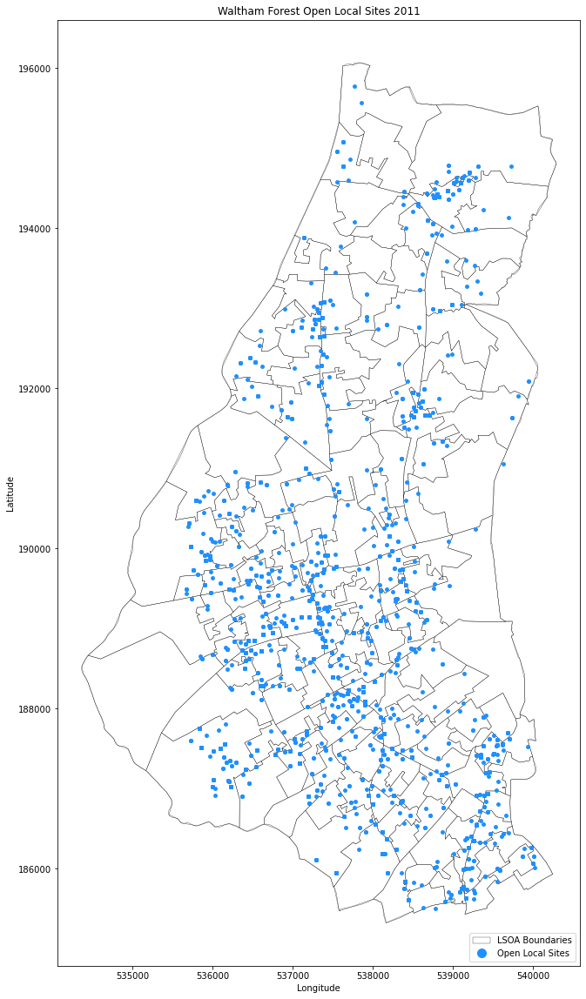

In [102]:
# plot for preview

fig, ax = plt.subplots(figsize=(20, 20))

wf_borough.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.3)
wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.3)

geo_openlocal11_wf.plot(ax=ax, color='dodgerblue', markersize=15)

ax.set_title('Waltham Forest Open Local Sites 2011')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# create legend
# lsoa_patch = mpatches.Patch(facecolor='none', edgecolor='black', linewidth=0.3, label='LSOA Boundaries')
openlocal_patch = plt.Line2D([0], [0], marker='o', color='dodgerblue', label='Open Local Sites', markersize=10, linestyle='None')

# add legend
ax.legend(handles=[lsoa_patch, openlocal_patch], loc='lower right', bbox_to_anchor=(1, 0))


plt.show()

Match pcd with coordinates for 2021 Waltham Forest data

In [103]:
openlocal21_wf_coor = pd.merge(openlocal21_wf, onspd_selected, left_on='pc__pcs', right_on='pcds')

# WGS84 coordinates (long, lat)

geometry21_wf = [Point(xy) for xy in zip(openlocal21_wf_coor['long'], openlocal21_wf_coor['lat'])]

geo_openlocal21_wf = gpd.GeoDataFrame(openlocal21_wf_coor, geometry=geometry21_wf)


# set CRS for geo_openlocal11_wf, the CRS is WGS 84

geo_openlocal21_wf = geo_openlocal21_wf.set_crs('EPSG:4326')

# transform to crs27700
geo_openlocal21_wf['geometry'] = geo_openlocal21_wf['geometry'].to_crs(crs_27700)

geo_openlocal21_wf.head()

,rates_code,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,pc__pcs,use_category,...,name,rates_paid,status,status_date,status_duration,ratepayers_published,pcds,lat,long,geometry
0,0000000022016166,E09000031,Waltham Forest,Outer London - East and North East,11244514000,BUXTON SCHOOL,CANN HALL ROAD,LONDON,E11 3NN,Local Authority Schools (National Scheme),...,NaN,NaN,True,2017-12-20,NaN,True,E11 3NN,51.557452,0.016529,POINT (539889.101 186211.822)
1,00000009205328,E09000031,Waltham Forest,Outer London - East and North East,12055165000,250,CANN HALL ROAD,LONDON,E11 3NN,Cafes,...,NaN,NaN,True,2019-02-01,NaN,True,E11 3NN,51.557452,0.016529,POINT (539889.101 186211.822)
2,00000000510140,E09000031,Waltham Forest,Outer London - East and North East,8745032000,14,LEYTON GRANGE ESTATE,LONDON,E10 5HN,Offices (Inc Computer Centres),...,NaN,NaN,True,2017-04-01,NaN,True,E10 5HN,51.564894,-0.019575,POINT (537364.006 186970.972)
3,0000000101,E09000031,Waltham Forest,Outer London - East and North East,12549805000,SUITE 101 GND FLR OCEANAIR HOUSE 750-760,HIGH ROAD LEYTONSTONE,LONDON,E11 3AW,Offices (Inc Computer Centres),...,NaN,NaN,True,2019-04-01,NaN,True,E11 3AW,51.570207,0.014350,POINT (539698.991 187626.042)
4,0000000102,E09000031,Waltham Forest,Outer London - East and North East,12549819000,SUITE 102 GND FLR OCEANAIR HSE 750-760,HIGH ROAD LEYTONSTONE,LONDON,E11 3AW,Offices (Inc Computer Centres),...,NaN,NaN,True,2019-04-01,NaN,True,E11 3AW,51.570207,0.014350,POINT (539698.991 187626.042)


In [104]:
geo_openlocal21_wf.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

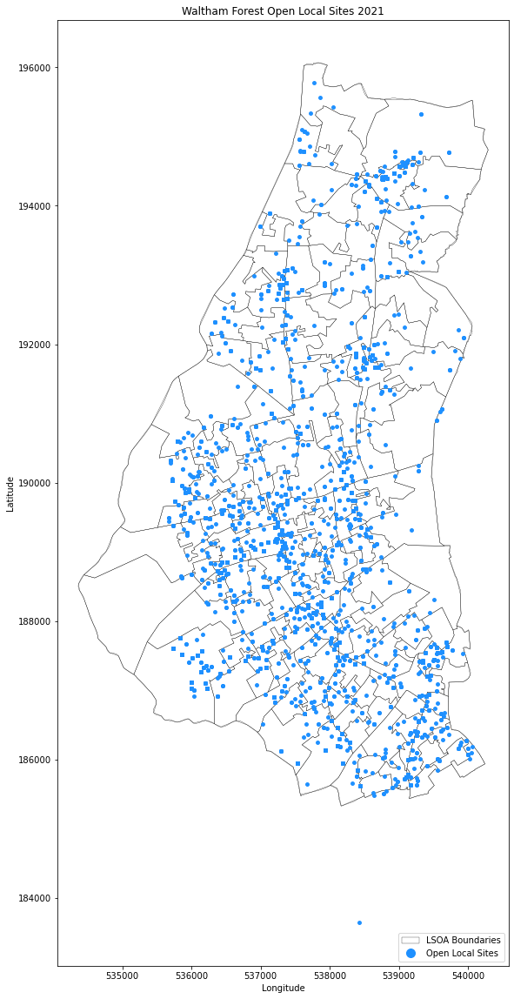

In [105]:
# plot for preview

fig, ax = plt.subplots(figsize=(20, 20))

wf_borough.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.3)
wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.3)

geo_openlocal21_wf.plot(ax=ax, color='dodgerblue', markersize=15)

ax.set_title('Waltham Forest Open Local Sites 2021')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# add legend
ax.legend(handles=[lsoa_patch, openlocal_patch], loc='lower right', bbox_to_anchor=(1, 0))

plt.show()

In [106]:
# there are points outside the boundary of Waltham Forest
geo_openlocal21_wf_new = gpd.sjoin(geo_openlocal21_wf, wf_lsoa, predicate='within')

geo_openlocal21_wf_new = geo_openlocal21_wf_new.iloc[:, :29]

geo_openlocal21_wf_new.head()

,rates_code,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,pc__pcs,use_category,...,name,rates_paid,status,status_date,status_duration,ratepayers_published,pcds,lat,long,geometry
0,0000000022016166,E09000031,Waltham Forest,Outer London - East and North East,11244514000,BUXTON SCHOOL,CANN HALL ROAD,LONDON,E11 3NN,Local Authority Schools (National Scheme),...,NaN,NaN,True,2017-12-20,NaN,True,E11 3NN,51.557452,0.016529,POINT (539889.101 186211.822)
1,00000009205328,E09000031,Waltham Forest,Outer London - East and North East,12055165000,250,CANN HALL ROAD,LONDON,E11 3NN,Cafes,...,NaN,NaN,True,2019-02-01,NaN,True,E11 3NN,51.557452,0.016529,POINT (539889.101 186211.822)
1186,00000002195741,E09000031,Waltham Forest,Outer London - East and North East,14364057,137,CANN HALL ROAD,LONDON,E11 3NJ,Shops,...,EAST PHARM LTD,2013.1,True,1996-08-09,9001.0,True,E11 3NJ,51.555506,0.012100,POINT (539588.039 185986.961)
1187,0000000219576B,E09000031,Waltham Forest,Outer London - East and North East,186197057,141-143,CANN HALL ROAD,LONDON,E11 3NJ,Shops,...,NaN,NaN,True,2017-04-01,NaN,True,E11 3NJ,51.555506,0.012100,POINT (539588.039 185986.961)
1188,00000002196566,E09000031,Waltham Forest,Outer London - East and North East,14409057,221,CANN HALL ROAD,LONDON,E11 3NJ,Shops,...,NaN,NaN,True,2017-04-01,NaN,True,E11 3NJ,51.555506,0.012100,POINT (539588.039 185986.961)


In [107]:
geo_openlocal21_wf_new.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 6957 entries, 0 to 6626
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   rates_code            6957 non-null   object        
 1   rates_authority_id    6957 non-null   object        
 2   rates_authority       6957 non-null   object        
 3   region                6957 non-null   object        
 4   location_code         6957 non-null   object        
 5   address_no            6957 non-null   object        
 6   address_street        6911 non-null   object        
 7   address_town          6957 non-null   object        
 8   pc__pcs               6957 non-null   object        
 9   use_category          6957 non-null   object        
 10  scat_code             6957 non-null   object        
 11  sub_category          6957 non-null   object        
 12  category              6275 non-null   object        
 13  floor_area

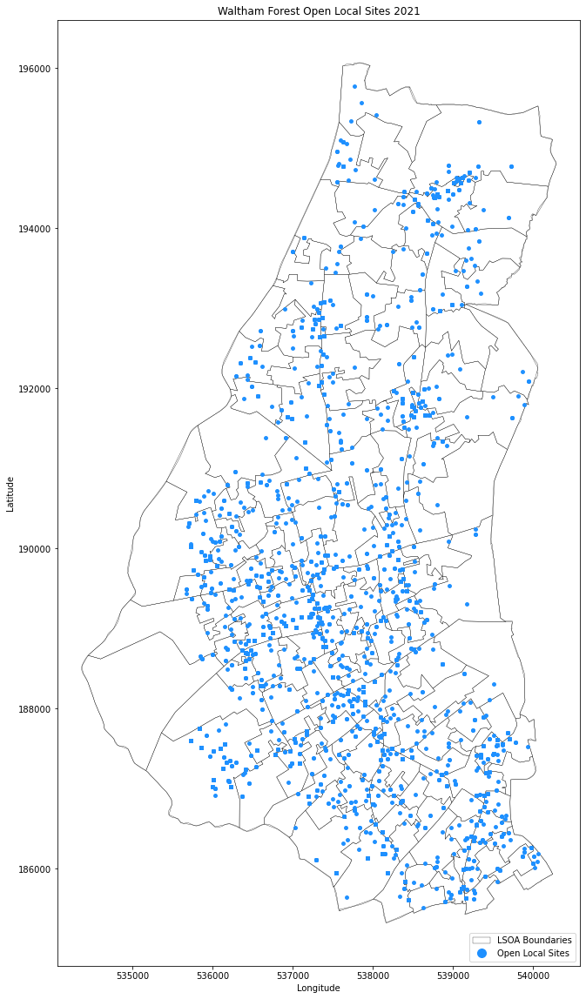

In [108]:
# check again

fig, ax = plt.subplots(figsize=(20, 20))

wf_borough.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.3)
wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.3)

geo_openlocal21_wf_new.plot(ax=ax, color='dodgerblue', markersize=15)

ax.set_title('Waltham Forest Open Local Sites 2021')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# add legend
ax.legend(handles=[lsoa_patch, openlocal_patch], loc='lower right', bbox_to_anchor=(1, 0))

plt.show()

#### 2) Get the composition of category (overview)

##### Business type composition

In [109]:
# check if there is any 0 or NaN value in the cateogory
check_nan_0 = geo_openlocal11_wf['category'].isnull() | (geo_openlocal11_wf['category'] == 0)
print("rows including 0 or NaN values：")
print(geo_openlocal11_wf[check_nan_0])

rows including 0 or NaN values：
           rates_code rates_authority_id rates_authority  \
35     00000007820009          E09000031  Waltham Forest   
190    0000000790525A          E09000031  Waltham Forest   
240    0000000131912B          E09000031  Waltham Forest   
257    00000001342911          E09000031  Waltham Forest   
259    00000001338051          E09000031  Waltham Forest   
...               ...                ...             ...   
4538   00000008947509          E09000031  Waltham Forest   
4539   00000008947513          E09000031  Waltham Forest   
4551   00000009080189          E09000031  Waltham Forest   
4580   00000248400051          E09000031  Waltham Forest   
4581  N00001776179009          E09000031  Waltham Forest   

                                  region location_code  \
35    Outer London - East and North East     829790000   
190   Outer London - East and North East     234873057   
240   Outer London - East and North East     237557057   
257   Outer Lon

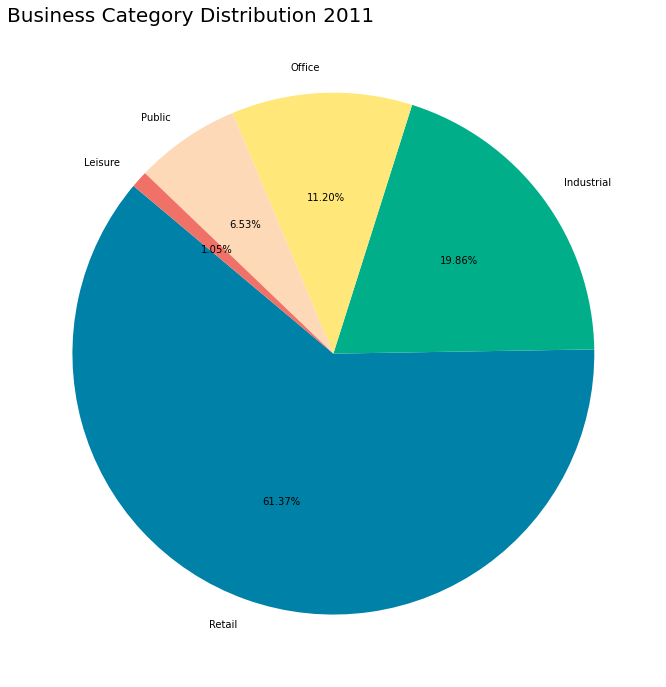

The number of each category: 
Retail        2812
Industrial     910
Office         513
Public         299
Leisure         48
Name: category, dtype: int64
The proportion of each category:
Retail        61.37
Industrial    19.86
Office        11.20
Public         6.53
Leisure        1.05
Name: category, dtype: float64


In [110]:
# change category'0' to 'Public'
geo_openlocal11_wf['category'].fillna('Public', inplace=True)

# Count the number of each category
wf11_category_counts = geo_openlocal11_wf['category'].value_counts()

# Calculate the proportion of each category
wf11_category_percentages = (wf11_category_counts*100 / wf11_category_counts.sum()).round(2)

# pie chart
colors = ['#0081A7', '#00AF89', '#FFE779', '#FED9B7', '#F07167']
plt.figure(figsize=(12, 12))
plt.pie(wf11_category_counts, labels=wf11_category_counts.index, autopct='%.2f%%', startangle=140, colors = colors)
plt.title("Business Category Distribution 2011", loc='left', fontsize=20)
plt.show()

print("The number of each category: ")
print(wf11_category_counts)

print("The proportion of each category:")
print(wf11_category_percentages)

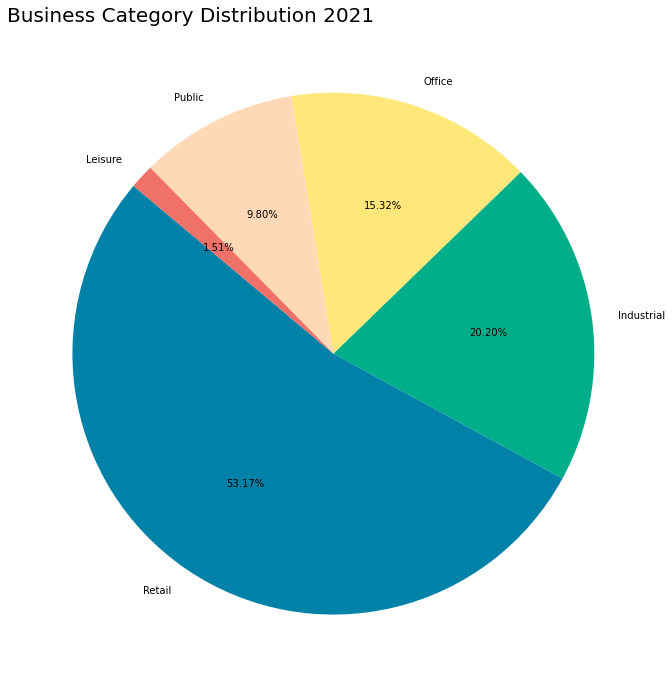

The number of each category: 
Retail        3699
Industrial    1405
Office        1066
Public         682
Leisure        105
Name: category, dtype: int64
The proportion of each category:
Retail        53.17
Industrial    20.20
Office        15.32
Public         9.80
Leisure        1.51
Name: category, dtype: float64


In [111]:
# change category'0' to 'Public'
geo_openlocal21_wf_new['category'].fillna('Public', inplace=True)

# Count the number of each category
wf21_category_counts = geo_openlocal21_wf_new['category'].value_counts()

# Calculate the proportion of each category
wf21_category_percentages = (wf21_category_counts*100 / wf21_category_counts.sum()).round(2)

# pie chart
plt.figure(figsize=(12, 12))
plt.pie(wf21_category_counts, labels=wf21_category_counts.index, autopct='%.2f%%', startangle=140, colors = colors)
plt.title("Business Category Distribution 2021", loc='left', fontsize=20)
plt.show()

print("The number of each category: ")
print(wf21_category_counts)

print("The proportion of each category:")
print(wf21_category_percentages)

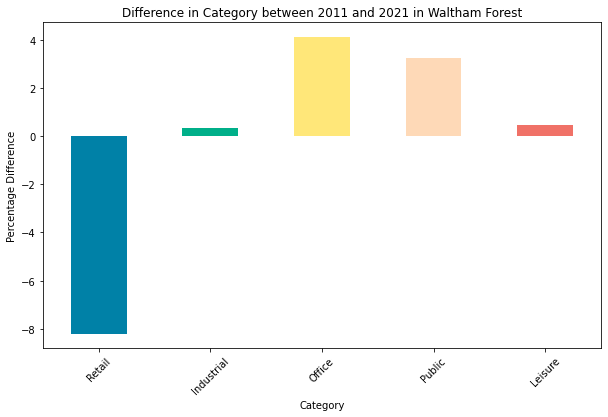

In [112]:
changes_percent_wf = wf21_category_percentages - wf11_category_percentages

plt.figure(figsize=(10, 6))

changes_percent_wf.plot(kind='bar', color = colors)

plt.xlabel('Category')

plt.ylabel('Percentage Difference')

plt.title('Difference in Category between 2011 and 2021 in Waltham Forest')
plt.xticks(rotation=45)
plt.show()

##### Retail Composition

The column'scat_code' is the code for use_category, can used to check the diversity changes of retail use category in High Streets.

In [113]:
retail11_wf = geo_openlocal11_wf[geo_openlocal11_wf['category'] == 'Retail']

retail11_wf.head()

,rates_code,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,pc__pcs,use_category,...,name,rates_paid,status,status_date,status_duration,ratepayers_published,pcds,lat,long,geometry
28,00000001087017,E09000031,Waltham Forest,Outer London - East and North East,185965057,1 & 2,ALBERT CRESCENT,LONDON,E4 6SH,Shops,...,NEXUS FOODS LIMITED,12929.67,True,2009-08-10,599.0,True,E4 6SH,51.617346,-0.018464,POINT (537282.992 192805.965)
29,00000001087036,E09000031,Waltham Forest,Outer London - East and North East,202328057,4,ALBERT CRESCENT,LONDON,E4 6SH,Shops,...,GREGGS OF ENFIELD PLC,5319.17,True,1994-04-01,6209.0,True,E4 6SH,51.617346,-0.018464,POINT (537282.992 192805.965)
30,0000000108704B,E09000031,Waltham Forest,Outer London - East and North East,1126057,5,ALBERT CRESCENT,LONDON,E4 6SH,Shops,...,NaN,NaN,True,2010-04-01,NaN,True,E4 6SH,51.617346,-0.018464,POINT (537282.992 192805.965)
31,00000001087089,E09000031,Waltham Forest,Outer London - East and North East,1122057,10,ALBERT CRESCENT,LONDON,E4 6SH,Shops,...,PERCY INGLE BAKERIES LTD,5892.00,True,2003-04-01,2922.0,True,E4 6SH,51.617346,-0.018464,POINT (537282.992 192805.965)
32,0000000108711B,E09000031,Waltham Forest,Outer London - East and North East,202329057,3,ALBERT CRESCENT,LONDON,E4 6SH,Shops,...,NaN,NaN,True,2010-04-01,NaN,True,E4 6SH,51.617346,-0.018464,POINT (537282.992 192805.965)


In [114]:
retail11_wf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2812 entries, 28 to 4579
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   rates_code            2812 non-null   object        
 1   rates_authority_id    2812 non-null   object        
 2   rates_authority       2812 non-null   object        
 3   region                2812 non-null   object        
 4   location_code         2812 non-null   object        
 5   address_no            2812 non-null   object        
 6   address_street        2789 non-null   object        
 7   address_town          2812 non-null   object        
 8   pc__pcs               2812 non-null   object        
 9   use_category          2812 non-null   object        
 10  scat_code             2812 non-null   object        
 11  sub_category          2812 non-null   object        
 12  category              2812 non-null   object        
 13  floor_are

In [115]:
retail21_wf = geo_openlocal21_wf_new[geo_openlocal21_wf_new['category'] == 'Retail']

retail21_wf.head()

,rates_code,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,pc__pcs,use_category,...,name,rates_paid,status,status_date,status_duration,ratepayers_published,pcds,lat,long,geometry
1,00000009205328,E09000031,Waltham Forest,Outer London - East and North East,12055165000,250,CANN HALL ROAD,LONDON,E11 3NN,Cafes,...,NaN,NaN,True,2019-02-01,NaN,True,E11 3NN,51.557452,0.016529,POINT (539889.101 186211.822)
1186,00000002195741,E09000031,Waltham Forest,Outer London - East and North East,14364057,137,CANN HALL ROAD,LONDON,E11 3NJ,Shops,...,EAST PHARM LTD,2013.1,True,1996-08-09,9001.0,True,E11 3NJ,51.555506,0.012100,POINT (539588.039 185986.961)
1187,0000000219576B,E09000031,Waltham Forest,Outer London - East and North East,186197057,141-143,CANN HALL ROAD,LONDON,E11 3NJ,Shops,...,NaN,NaN,True,2017-04-01,NaN,True,E11 3NJ,51.555506,0.012100,POINT (539588.039 185986.961)
1188,00000002196566,E09000031,Waltham Forest,Outer London - East and North East,14409057,221,CANN HALL ROAD,LONDON,E11 3NJ,Shops,...,NaN,NaN,True,2017-04-01,NaN,True,E11 3NJ,51.555506,0.012100,POINT (539588.039 185986.961)
1189,00000002196585,E09000031,Waltham Forest,Outer London - East and North East,14411057,225,CANN HALL ROAD,LONDON,E11 3NJ,Shops,...,CANN HALL FRIED CHICKEN LIMITED,0.0,True,2019-04-09,723.0,True,E11 3NJ,51.555506,0.012100,POINT (539588.039 185986.961)


In [116]:
retail21_wf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 3699 entries, 1 to 6625
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   rates_code            3699 non-null   object        
 1   rates_authority_id    3699 non-null   object        
 2   rates_authority       3699 non-null   object        
 3   region                3699 non-null   object        
 4   location_code         3699 non-null   object        
 5   address_no            3699 non-null   object        
 6   address_street        3672 non-null   object        
 7   address_town          3699 non-null   object        
 8   pc__pcs               3699 non-null   object        
 9   use_category          3699 non-null   object        
 10  scat_code             3699 non-null   object        
 11  sub_category          3699 non-null   object        
 12  category              3699 non-null   object        
 13  floor_area

##### Category code

In [117]:
category11 = retail11_wf.loc[:, ['use_category', 'scat_code']].copy()

category11 = category11.drop_duplicates()

category11 = category11.reset_index(drop=True)

category11

,use_category,scat_code
0,Shops,249
1,Restaurants,234
2,Stores,268
3,Hairdressing/Beauty Salons,417
4,Cafes,409
5,Betting Offices,24
6,Car/Caravan Sales/Display/Hiring Sites,46
7,Sales Kiosks,243
8,Car Showrooms,42
9,Banks/Insurance/Building Society Offices & Oth...,21


In [118]:
category21 = retail21_wf.loc[:, ['use_category', 'scat_code']].copy()

category21 = category21.drop_duplicates()

category21 = category21.reset_index(drop=True)

category21


,use_category,scat_code
0,Cafes,409
1,Shops,249
2,Public Houses/Pub Restaurants (National Scheme),226
3,Stores,268
4,Car Showrooms,42
5,Restaurants,234
6,Hairdressing/Beauty Salons,417
7,Sales Kiosks,243
8,Banks/Insurance/Building Society Offices & Oth...,21
9,Large Shops (Over 1850m^2),155


In [119]:
# save to excel file
excel_file_path = os.path.join('Data', "code_lookup_use_category_wf.xlsx")
category21.to_excel(excel_file_path, index=False)
print(f"DataFrame saved in {excel_file_path}")

DataFrame saved in Data/code_lookup_use_category_wf.xlsx


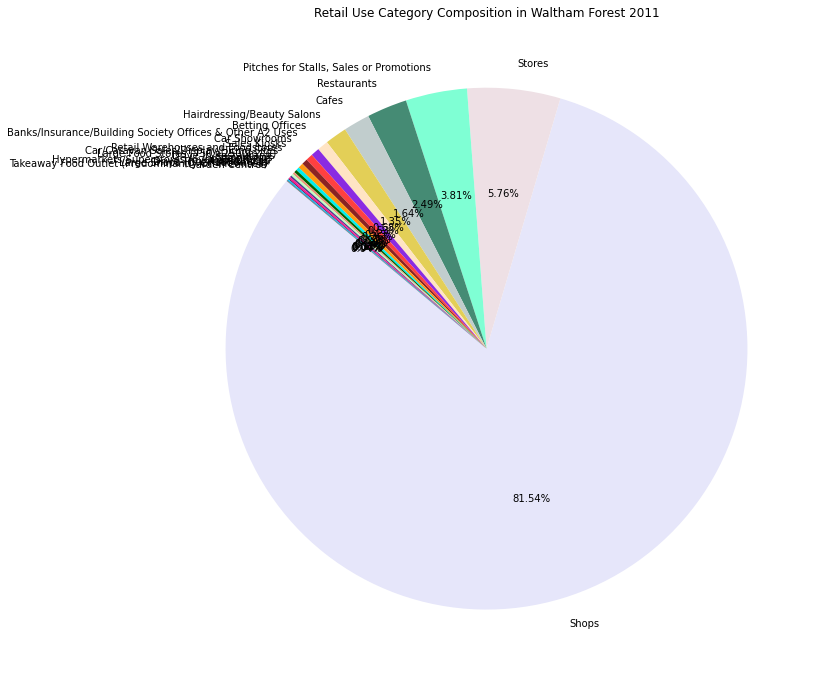

The number of each retail category: 
Shops                                                       2293
Stores                                                       162
Pitches for Stalls, Sales or Promotions                      107
Restaurants                                                   70
Cafes                                                         46
Hairdressing/Beauty Salons                                    38
Betting Offices                                               19
Banks/Insurance/Building Society Offices & Other A2 Uses      15
Car Showrooms                                                 12
Sales Kiosks                                                  10
Retail Warehouses and Foodstores                               9
Car/Caravan Sales/Display/Hiring Sites                         6
Large Food Stores (750 - 2500m^2)                              5
Drive-In Restaurants                                           4
Showrooms                                            

In [120]:
# Count the number of each retail lcategory
wf11_retail_counts = retail11_wf['use_category'].value_counts()

# Calculate the proportion of each category
wf11_retail_percentages = wf11_retail_counts / wf11_retail_counts.sum()

# pie chart
colors28 = ['#E6E6FA', '#EEE0E5', '#7FFFD4', '#458B74', '#C1CDCD', '#E3CF57', '#FFE4C4',
            '#8A2BE2', '#FF4040', '#8B2323', '#FF9912', '#00EEEE', '#006400', '#E9967A',
            '#C1FFC1', '#483D8B', '#FF1493', '#8B0A50', '#00BFFF', '#00688B', '#696969',
            '#104E8B', '#030303', '#B0B0B0', '#838B83', '#CD6090', '#8B3A62', '#F0E68C']
plt.figure(figsize=(12, 12))
plt.pie(wf11_retail_counts, labels=wf11_retail_counts.index, autopct='%.2f%%', startangle=140, colors = colors28)
plt.title('Retail Use Category Composition in Waltham Forest 2011')
plt.show()

print("The number of each retail category: ")
print(wf11_retail_counts)

print("The proportion of each retail category:")
print(wf11_retail_percentages)

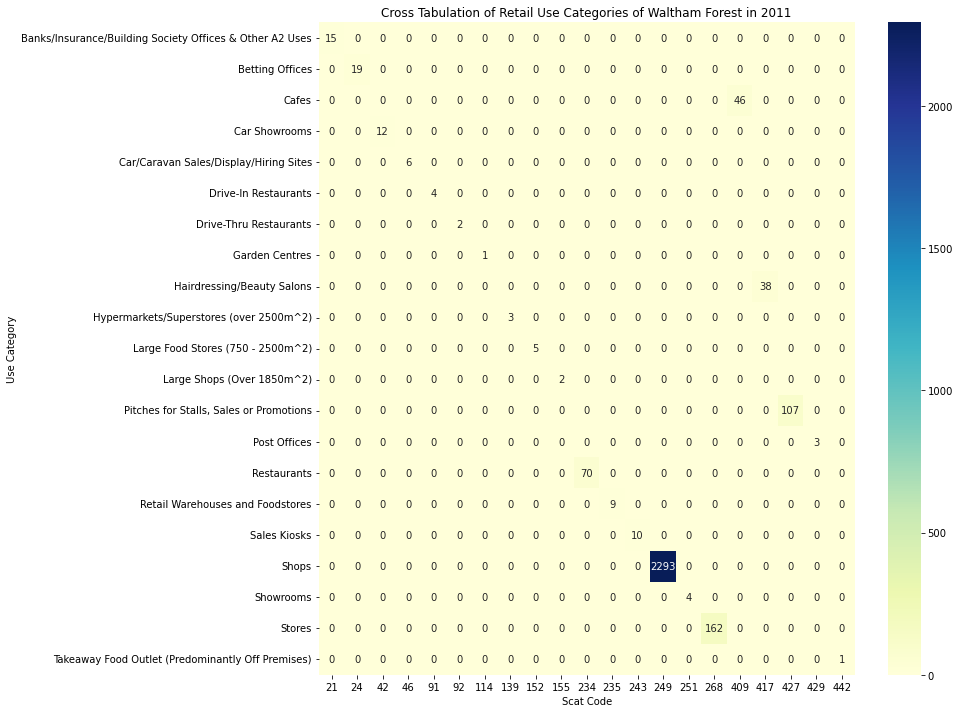

In [121]:
cross_tab_wf11 = pd.crosstab(index=retail11_wf['use_category'], columns=retail11_wf['scat_code'])

# plot
plt.figure(figsize=(12, 12))
sns.heatmap(cross_tab_wf11, annot=True, fmt='d', cmap='YlGnBu') 
plt.title('Cross Tabulation of Retail Use Categories of Waltham Forest in 2011')
plt.xlabel('Scat Code')
plt.ylabel('Use Category')
plt.show()

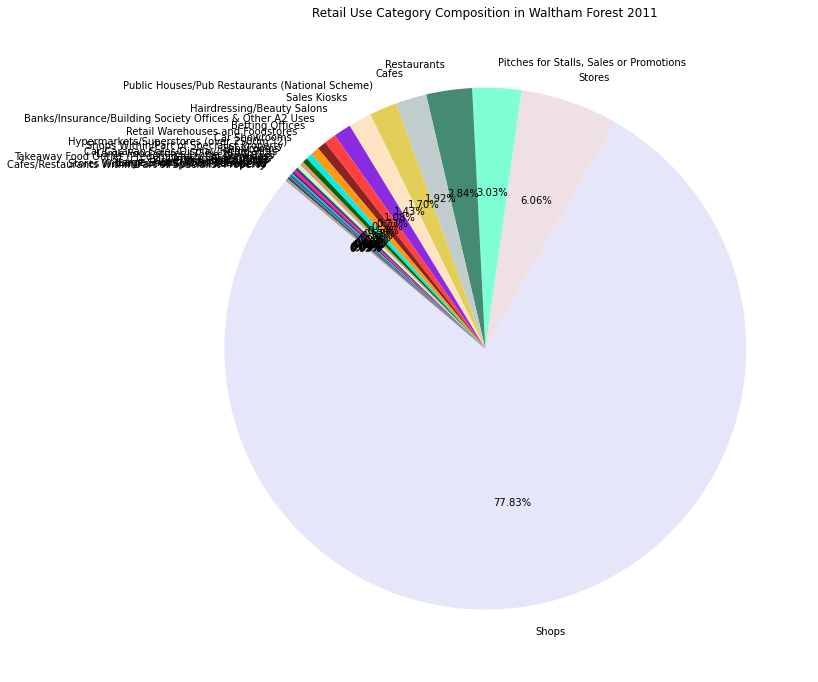

The number of each retail category: 
Shops                                                       2879
Stores                                                       224
Pitches for Stalls, Sales or Promotions                      112
Restaurants                                                  105
Cafes                                                         71
Public Houses/Pub Restaurants (National Scheme)               63
Sales Kiosks                                                  53
Hairdressing/Beauty Salons                                    40
Banks/Insurance/Building Society Offices & Other A2 Uses      27
Betting Offices                                               21
Retail Warehouses and Foodstores                              20
Car Showrooms                                                 14
Hypermarkets/Superstores (over 2500m^2)                       12
Shops Within/Part of Specialist Property                       9
Showrooms                                            

In [122]:
# Count the number of each retail lcategory
wf21_retail_counts = retail21_wf['use_category'].value_counts()

# Calculate the proportion of each category
wf21_retail_percentages = wf21_retail_counts / wf21_retail_counts.sum()

# bar chart
plt.figure(figsize=(12, 12))
plt.pie(wf21_retail_counts, labels=wf21_retail_counts.index, autopct='%.2f%%', startangle=140, colors = colors28)
plt.title('Retail Use Category Composition in Waltham Forest 2011')
plt.show()

print("The number of each retail category: ")
print(wf21_retail_counts)

print("The proportion of each retail category:")
print(wf21_retail_percentages)

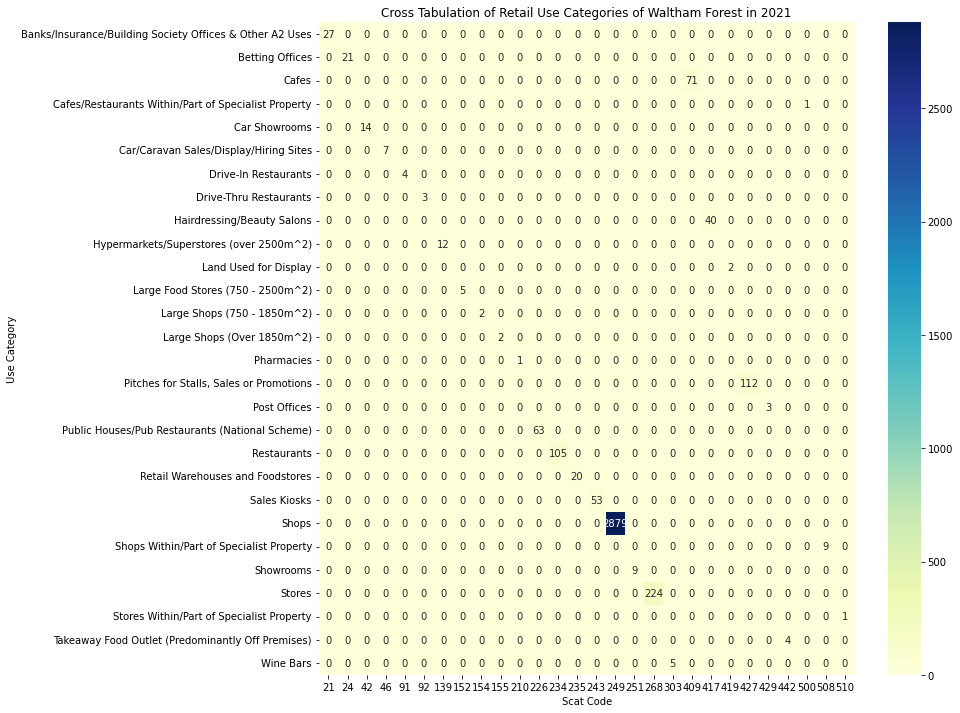

In [123]:
cross_tab_wf21 = pd.crosstab(index=retail21_wf['use_category'], columns=retail21_wf['scat_code'])

# plot
plt.figure(figsize=(12, 12))
sns.heatmap(cross_tab_wf21, annot=True, fmt='d', cmap='YlGnBu') 
plt.title('Cross Tabulation of Retail Use Categories of Waltham Forest in 2021')
plt.xlabel('Scat Code')
plt.ylabel('Use Category')
plt.show()

In [124]:
cross_tab_changes_wf = cross_tab_wf21.copy()
cross_tab_changes_wf.update(cross_tab_wf21 - cross_tab_wf11)

# check if thereare NA value
has_na = cross_tab_changes_wf.isna().any().any()

if has_na:
    print("cross tab has NaN values")
else:
    print("cross tab has no NaN values")

cross tab has no NaN values


In [125]:
cross_tab_changes_wf = cross_tab_changes_wf.astype(int)
cross_tab_changes_wf

scat_code,21,24,42,46,91,92,139,152,154,155,...,303,409,417,419,427,429,442,500,508,510
use_category,,,,,,,,,,,,,,,,,,,,,
Banks/Insurance/Building Society Offices & Other A2 Uses,12,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Betting Offices,0,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Cafes,0,0,0,0,0,0,0,0,0,0,...,0,25,0,0,0,0,0,0,0,0
Cafes/Restaurants Within/Part of Specialist Property,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
Car Showrooms,0,0,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Car/Caravan Sales/Display/Hiring Sites,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Drive-In Restaurants,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Drive-Thru Restaurants,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Hairdressing/Beauty Salons,0,0,0,0,0,0,0,0,0,0,...,0,0,2,0,0,0,0,0,0,0


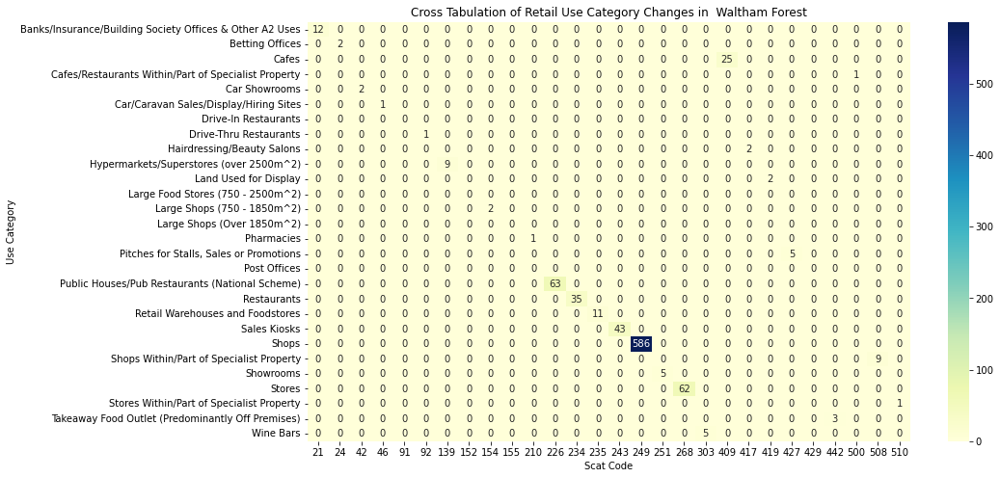

In [126]:
# plot
plt.figure(figsize=(14, 8))
sns.heatmap(cross_tab_changes_wf, annot=True, fmt='d', cmap='YlGnBu') 
plt.title('Cross Tabulation of Retail Use Category Changes in  Waltham Forest')
plt.xlabel('Scat Code')
plt.ylabel('Use Category')
plt.show() 

<Figure size 1440x720 with 0 Axes>

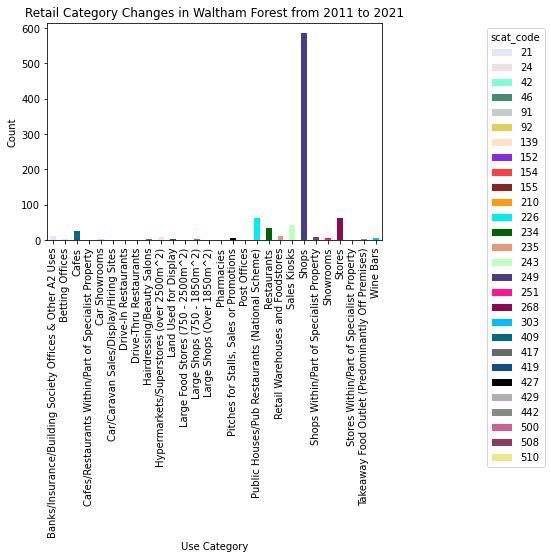

In [127]:
# Extract non-zero items
non_zero_cross_tab_wf = cross_tab_changes_wf[cross_tab_changes_wf != 0]

# plot bar chart
plt.figure(figsize=(20, 10))
non_zero_cross_tab_wf.plot(kind='bar', stacked=True, color=colors28)
plt.title('Retail Category Changes in Waltham Forest from 2011 to 2021')
plt.xlabel('Use Category')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.legend(title='scat_code', loc='upper right', bbox_to_anchor=(1.5, 1))

plt.show()

In [128]:
negative_count = (non_zero_cross_tab_wf < 0).sum().sum()
print("Number of negative values:", negative_count)

Number of negative values: 0


All category counts are increased

In [129]:
top_category_changes = non_zero_cross_tab_wf.stack().nlargest(10)
top_10_values = top_category_changes.values
top_10_index = top_category_changes.index

top_10_index

MultiIndex([(                                                   'Shops', 249),
            (         'Public Houses/Pub Restaurants (National Scheme)', 226),
            (                                                  'Stores', 268),
            (                                            'Sales Kiosks', 243),
            (                                             'Restaurants', 234),
            (                                                   'Cafes', 409),
            ('Banks/Insurance/Building Society Offices & Other A2 Uses',  21),
            (                        'Retail Warehouses and Foodstores', 235),
            (                 'Hypermarkets/Superstores (over 2500m^2)', 139),
            (                'Shops Within/Part of Specialist Property', 508)],
           names=['use_category', 'scat_code'])

In [130]:
top_10_values

array([586.,  63.,  62.,  43.,  35.,  25.,  12.,  11.,   9.,   9.])

There are 28 categories in `use_category`.

After we extract retails in high streets, check if the top categoties are the same or not.

In [131]:
categories_to_extract = ['Shops', 'Public Houses/Pub Restaurants (National Scheme)', 'Stores', 'Sales Kiosks', 'Restaurants', 'Cafes', 
'Banks/Insurance/Building Society Offices & Other A2 Uses','Retail Warehouses and Foodstores', 
'Hypermarkets/Superstores (over 2500m^2)', 'Shops Within/Part of Specialist Property']

filtered_category = non_zero_cross_tab_wf.loc[categories_to_extract]
# Extract all non-NaN values of cross_tab
filtered_category_no_nan = filtered_category.stack() # series
# Turn series to dataframe
filtered_category_no_nan = filtered_category_no_nan.reset_index()
filtered_category_no_nan = filtered_category_no_nan.rename(columns={0: 'changes_count'})

top10category = pd.DataFrame(filtered_category_no_nan, columns=['index', 'use_category', 'scat_code', 'changes_count'])

<Figure size 1152x576 with 0 Axes>

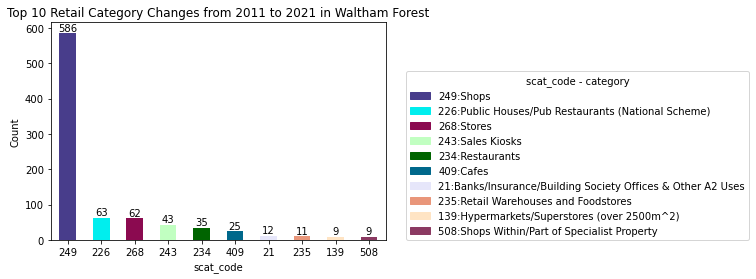

In [132]:
plt.figure(figsize=(16, 8))

# Plot the histogram

# pie chart
colors10 = ['#483D8B', '#00EEEE', '#8B0A50', '#C1FFC1', '#006400', '#00688B', '#E6E6FA', '#E9967A', '#FFE4C4', '#8B3A62']
# Plot the histogram
ax = top10category.plot(x='scat_code', y='changes_count', kind='bar', stacked=True, color=colors10)

# Add labels to the bars
for p in ax.patches:
    ax.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.title('Top 10 Retail Category Changes from 2011 to 2021 in Waltham Forest')
plt.xlabel('scat_code')
plt.ylabel('Count')
plt.xticks(rotation=0)

# Create legend handles and labels using scat_code values and colors
legend_labels = top10category['scat_code'].unique()
legend_handles_code = [mpatches.Patch(color=color, label=f"{label}:{category}") for label, color, category 
                       in zip(legend_labels, colors10, top10category['use_category'])]

# Add the custom legend to the plot
ax.legend(handles=legend_handles_code, title='scat_code - category', loc='upper right', bbox_to_anchor=(2.1, 0.8))

plt.show()

### 3.5 Extract commercial points and LSOAs within the radiation range of the high street (Waltham Forest)

1. Set buffer zones for high streets;

2. Select retail points inside high streets and get the retail composition and duration changes;

3. Get all LSOAs influenced by the high streets.

#### 1) Set buffer zones for high streets

In [133]:
buffer_distance = 100  # unit: metres

wf_highstreet_buffered = merged_hs.copy()

wf_highstreet_buffered['geometry'] = merged_hs['geometry'].buffer(buffer_distance)

wf_highstreet_buffered = gpd.GeoDataFrame(wf_highstreet_buffered, geometry='geometry')

wf_highstreet_buffered.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [134]:
wf_highstreet_buffered

,index,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,geometry
0,242,237,"Billet Road, Walthamstow.",4.395863,None,Waltham Forest,E09000031,"POLYGON ((536262.513 190811.239, 536262.221 19..."
1,250,244,"Forest Road (Pembar Avenue), Blackhorse Road",5.781402,None,Waltham Forest,E09000031,"POLYGON ((535926.360 189413.675, 535926.343 18..."
2,255,249,"Burnside Avenue, Walthamstow.",7.221877,None,Waltham Forest,E09000031,"POLYGON ((536882.654 191727.218, 536882.608 19..."
3,258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,"POLYGON ((537073.966 192690.163, 537073.873 19..."
4,263,257,"Grove Green Road, Leytonstone.",4.605851,None,Waltham Forest,E09000031,"POLYGON ((538692.318 187097.746, 538690.880 18..."
5,403,397,"The Avenue, Highams Park.",9.215191,None,Waltham Forest,E09000031,"POLYGON ((538318.431 191611.184, 538317.498 19..."
6,474,466,"Francis Road, Leyton",6.813432,None,Waltham Forest,E09000031,"POLYGON ((538000.083 186943.393, 537992.504 18..."
7,515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,"POLYGON ((539034.343 186338.825, 539035.232 18..."
8,519,507,"Wood Street, Wood Street.",21.766876,None,Waltham Forest,E09000031,"POLYGON ((537921.621 189873.901, 537921.171 18..."
9,520,508,"High Street/Hoe Street, Walthamstow",95.428617,None,Waltham Forest,E09000031,"POLYGON ((536117.835 188808.925, 536117.685 18..."


In [135]:
merged_hs

,index,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,geometry
0,242,237,"Billet Road, Walthamstow.",4.395863,None,Waltham Forest,E09000031,"POLYGON ((536538.954 190900.525, 536542.912 19..."
1,250,244,"Forest Road (Pembar Avenue), Blackhorse Road",5.781402,None,Waltham Forest,E09000031,"MULTIPOLYGON (((536388.069 189529.767, 536387...."
2,255,249,"Burnside Avenue, Walthamstow.",7.221877,None,Waltham Forest,E09000031,"MULTIPOLYGON (((537130.364 191807.225, 537155...."
3,258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,"POLYGON ((537451.583 192633.269, 537451.715 19..."
4,263,257,"Grove Green Road, Leytonstone.",4.605851,None,Waltham Forest,E09000031,"POLYGON ((538947.848 186917.325, 538938.094 18..."
5,403,397,"The Avenue, Highams Park.",9.215191,None,Waltham Forest,E09000031,"POLYGON ((538679.256 191889.252, 538684.327 19..."
6,474,466,"Francis Road, Leyton",6.813432,None,Waltham Forest,E09000031,"POLYGON ((538057.472 187025.286, 538112.679 18..."
7,515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,"POLYGON ((539839.361 187616.515, 539842.206 18..."
8,519,507,"Wood Street, Wood Street.",21.766876,None,Waltham Forest,E09000031,"POLYGON ((538548.242 190188.508, 538559.398 19..."
9,520,508,"High Street/Hoe Street, Walthamstow",95.428617,None,Waltham Forest,E09000031,"POLYGON ((537813.332 188310.594, 537812.973 18..."


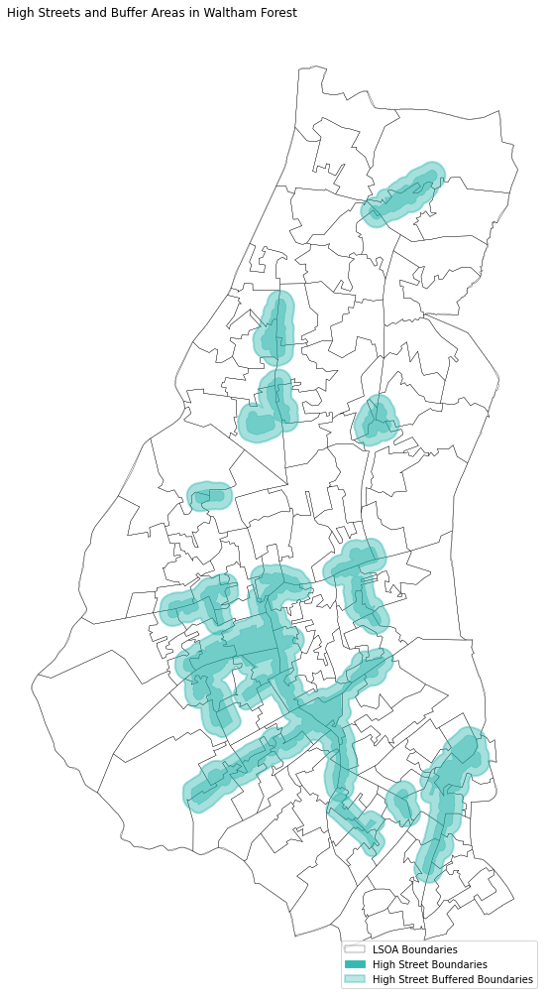

In [136]:
fig, ax = plt.subplots(figsize=(18,18))

wf_borough.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.3)
wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.3)

merged_hs.plot(ax=ax, linewidth=0.8, facecolor='lightseagreen', edgecolor = 'lightseagreen', alpha=0.4)

wf_highstreet_buffered.plot(ax=ax, linewidth=2, facecolor='lightseagreen', edgecolor = 'lightseagreen', alpha=0.4)

plt.title('High Streets and Buffer Areas in Waltham Forest', loc='left')

# create legend
highstreet_line1 = mpatches.Patch(facecolor='none', edgecolor='lightseagreen', linewidth=0.8, label='High Street Boundaries')
highstreet_buffered = mpatches.Patch(facecolor='none', edgecolor='lightseagreen', linewidth=2, label='High Street Buffered Boundaries')

highstreet_line2 = mpatches.Patch(edgecolor='lightseagreen', facecolor='lightseagreen', alpha=0.9, linewidth=0.8, label='High Street Boundaries')
highstreet_buffered2 = mpatches.Patch(edgecolor='lightseagreen', facecolor='lightseagreen', alpha=0.3, linewidth=2, label='High Street Buffered Boundaries')

# add legend
ax.legend(handles=[lsoa_patch, highstreet_line2, highstreet_buffered2], loc='lower right', bbox_to_anchor=(1, 0))

ax.axis('off') # turn off axis
ax.set_xticks([])
ax.set_yticks([])

plt.show()

#### 2) Select retail points inside high streets (buffer zones) and get the retail composition and duration changes

##### 2011

In [137]:
wf_hs_retail11 = gpd.sjoin(retail11_wf, wf_highstreet_buffered, predicate='within')

In [138]:
# Check whether there are duplicate records of retails points
# because the radiation range of the high street is coincident

duplicate11 = retail11_wf.duplicated(subset=['rates_code'], keep=False)
duplicate11 = retail11_wf[duplicate11]
print(duplicate11)
print()
# rates_code should be unique for each retail

duplicate_hs11 = wf_hs_retail11.duplicated(subset=['rates_code'], keep=False)
duplicate_hs11 = wf_hs_retail11[duplicate_hs11]
print(duplicate_hs11)

Empty GeoDataFrame
Columns: [rates_code, rates_authority_id, rates_authority, region, location_code, address_no, address_street, address_town, pc__pcs, use_category, scat_code, sub_category, category, floor_area, rental_valuation, valuation_date, revaluation_year, period, rates_expected, name, rates_paid, status, status_date, status_duration, ratepayers_published, pcds, lat, long, geometry]
Index: []

[0 rows x 29 columns]

          rates_code rates_authority_id rates_authority  \
3590  00000006775604          E09000031  Waltham Forest   
3591  00000006775977          E09000031  Waltham Forest   
3592  00000006775981          E09000031  Waltham Forest   
3593  00000006775996          E09000031  Waltham Forest   
3594  00000006776005          E09000031  Waltham Forest   
3595  00000006776109          E09000031  Waltham Forest   
3596  00000006776202          E09000031  Waltham Forest   
3590  00000006775604          E09000031  Waltham Forest   
3591  00000006775977          E09000031  

In [139]:
wf_hs_retail11 = wf_hs_retail11.drop_duplicates(subset=['rates_code'])

wf_hs_retail11.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2009 entries, 28 to 4565
Data columns (total 37 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   rates_code            2009 non-null   object        
 1   rates_authority_id    2009 non-null   object        
 2   rates_authority       2009 non-null   object        
 3   region                2009 non-null   object        
 4   location_code         2009 non-null   object        
 5   address_no            2009 non-null   object        
 6   address_street        1996 non-null   object        
 7   address_town          2009 non-null   object        
 8   pc__pcs               2009 non-null   object        
 9   use_category          2009 non-null   object        
 10  scat_code             2009 non-null   object        
 11  sub_category          2009 non-null   object        
 12  category              2009 non-null   object        
 13  floor_are

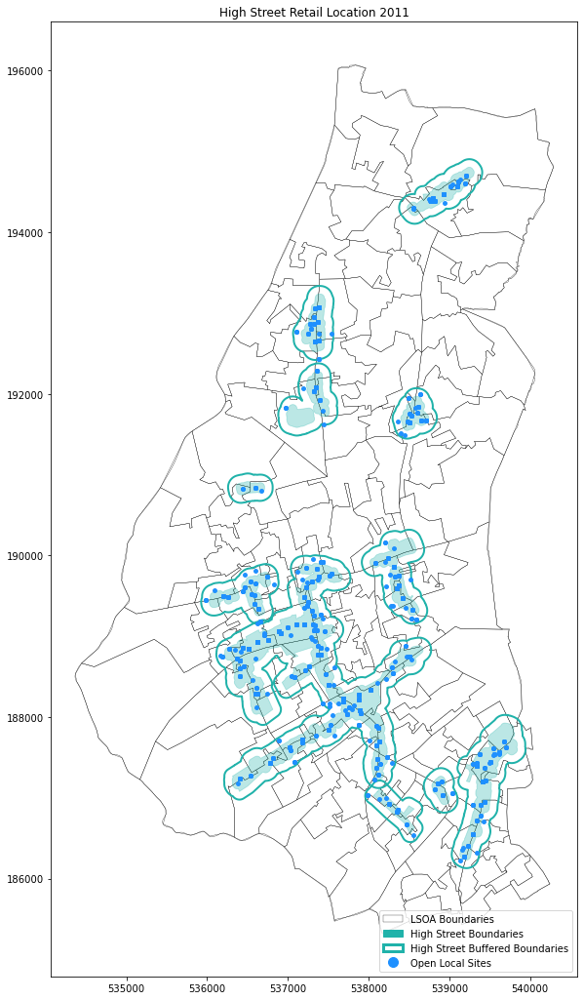

In [140]:
# plot and check 
fig, ax = plt.subplots(figsize=(18,18))

wf_borough.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.3)
wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.3)

merged_hs.plot(ax=ax, linewidth=0.8, edgecolor='lightseagreen', facecolor = 'lightseagreen', alpha=0.3)

wf_highstreet_buffered.plot(ax=ax, linewidth=2, edgecolor='lightseagreen', facecolor = 'none')

wf_hs_retail11.plot(ax=ax, markersize=15, color = 'dodgerblue')

plt.title('High Street Retail Location 2011')


# create legend
highstreet_line1 = mpatches.Patch(facecolor='lightseagreen', edgecolor='lightseagreen', linewidth=1, label='High Street Boundaries')
highstreet_buffered = mpatches.Patch(facecolor='none', edgecolor='lightseagreen', linewidth=3, label='High Street Buffered Boundaries')

# add legend
ax.legend(handles=[lsoa_patch, highstreet_line1, highstreet_buffered, openlocal_patch], loc='lower right', bbox_to_anchor=(1, 0))

plt.show()

In [141]:
# create a dataframe to collect High Streets information and open local sites information together
result_df1 = wf_hs_retail11[['highstreet_id', 'rates_code']]

result_df1 = result_df1.merge(merged_hs, on='highstreet_id', how='outer')

wf_highstreet_retail11 = wf_hs_retail11.merge(result_df1, on='rates_code', how='outer', suffixes=('', '*'))
wf_highstreet_retail11 = wf_highstreet_retail11.filter(regex='^[^*]*$')

# change column order
wf_highstreet_retail11.insert(7, 'rates_code', wf_highstreet_retail11.pop('rates_code'))

# drop index_right
wf_highstreet_retail11 = wf_highstreet_retail11.drop(columns=['index_right'])

# drop duplicate retails
wf_highstreet_retail11 = wf_highstreet_retail11.drop_duplicates(subset=['rates_code'])

wf_highstreet_retail11.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2009 entries, 0 to 2008
Data columns (total 36 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   rates_authority_id    2009 non-null   object        
 1   rates_authority       2009 non-null   object        
 2   region                2009 non-null   object        
 3   location_code         2009 non-null   object        
 4   address_no            2009 non-null   object        
 5   address_street        1996 non-null   object        
 6   address_town          2009 non-null   object        
 7   rates_code            2009 non-null   object        
 8   pc__pcs               2009 non-null   object        
 9   use_category          2009 non-null   object        
 10  scat_code             2009 non-null   object        
 11  sub_category          2009 non-null   object        
 12  category              2009 non-null   object        
 13  floor_area

In [142]:
wf_highstreet_retail11.head()

,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,rates_code,pc__pcs,use_category,...,lat,long,geometry,index,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD
0,E09000031,Waltham Forest,Outer London - East and North East,185965057,1 & 2,ALBERT CRESCENT,LONDON,00000001087017,E4 6SH,Shops,...,51.617346,-0.018464,POINT (537282.992 192805.965),258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031
1,E09000031,Waltham Forest,Outer London - East and North East,202328057,4,ALBERT CRESCENT,LONDON,00000001087036,E4 6SH,Shops,...,51.617346,-0.018464,POINT (537282.992 192805.965),258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031
2,E09000031,Waltham Forest,Outer London - East and North East,1126057,5,ALBERT CRESCENT,LONDON,0000000108704B,E4 6SH,Shops,...,51.617346,-0.018464,POINT (537282.992 192805.965),258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031
3,E09000031,Waltham Forest,Outer London - East and North East,1122057,10,ALBERT CRESCENT,LONDON,00000001087089,E4 6SH,Shops,...,51.617346,-0.018464,POINT (537282.992 192805.965),258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031
4,E09000031,Waltham Forest,Outer London - East and North East,202329057,3,ALBERT CRESCENT,LONDON,0000000108711B,E4 6SH,Shops,...,51.617346,-0.018464,POINT (537282.992 192805.965),258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031


##### 2021

In [143]:
wf_hs_retail21 = gpd.sjoin(retail21_wf, wf_highstreet_buffered, predicate='within')

# Check whether there are duplicate records of retails points
# because the radiation range of the high street is coincident
duplicate21 = retail21_wf.duplicated(subset=['rates_code'], keep=False)
duplicate21 = retail21_wf[duplicate21]
print(duplicate21)
print()
# rates_code should be unique for each retail

duplicate_hs21 = wf_hs_retail21.duplicated(subset=['rates_code'], keep=False)
duplicate_hs21 = wf_hs_retail21[duplicate_hs21]
print(duplicate_hs21)

Empty GeoDataFrame
Columns: [rates_code, rates_authority_id, rates_authority, region, location_code, address_no, address_street, address_town, pc__pcs, use_category, scat_code, sub_category, category, floor_area, rental_valuation, valuation_date, revaluation_year, period, rates_expected, name, rates_paid, status, status_date, status_duration, ratepayers_published, pcds, lat, long, geometry]
Index: []

[0 rows x 29 columns]

          rates_code rates_authority_id rates_authority  \
5719  00000006775604          E09000031  Waltham Forest   
5720  00000006775977          E09000031  Waltham Forest   
5721  00000006775981          E09000031  Waltham Forest   
5722  00000006775996          E09000031  Waltham Forest   
5723  00000006776005          E09000031  Waltham Forest   
5724  00000006776109          E09000031  Waltham Forest   
5725  00000006776202          E09000031  Waltham Forest   
5719  00000006775604          E09000031  Waltham Forest   
5720  00000006775977          E09000031  

In [144]:
wf_hs_retail21 = wf_hs_retail21.drop_duplicates(subset=['rates_code'])

wf_hs_retail21.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2658 entries, 13 to 5792
Data columns (total 37 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   rates_code            2658 non-null   object        
 1   rates_authority_id    2658 non-null   object        
 2   rates_authority       2658 non-null   object        
 3   region                2658 non-null   object        
 4   location_code         2658 non-null   object        
 5   address_no            2658 non-null   object        
 6   address_street        2642 non-null   object        
 7   address_town          2658 non-null   object        
 8   pc__pcs               2658 non-null   object        
 9   use_category          2658 non-null   object        
 10  scat_code             2658 non-null   object        
 11  sub_category          2658 non-null   object        
 12  category              2658 non-null   object        
 13  floor_are

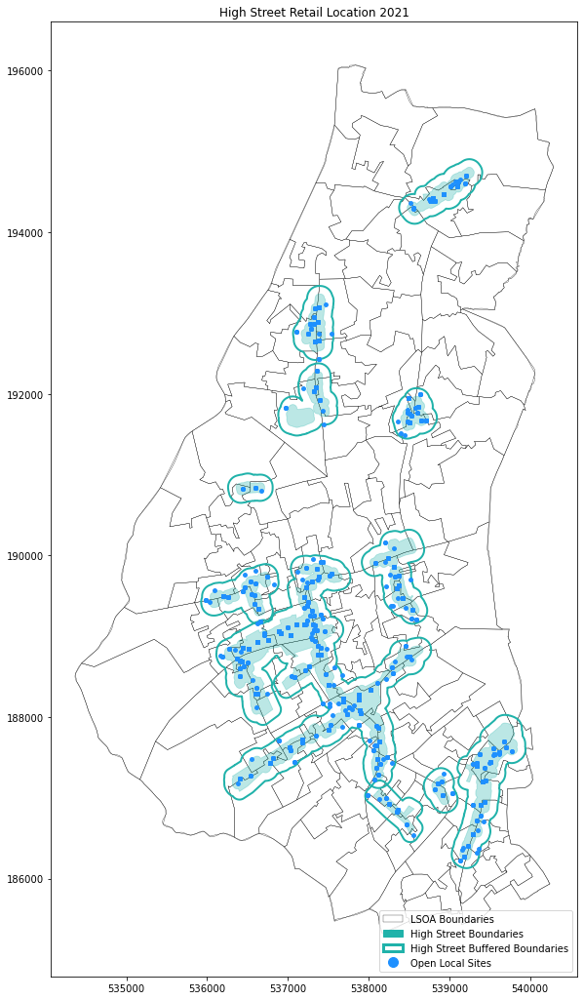

In [145]:
# plot and check 
fig, ax = plt.subplots(figsize=(18,18))

wf_borough.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.3)
wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.3)

merged_hs.plot(ax=ax, linewidth=0.8, edgecolor='lightseagreen', facecolor = 'lightseagreen', alpha=0.3)

wf_highstreet_buffered.plot(ax=ax, linewidth=2, edgecolor='lightseagreen', facecolor = 'none')

wf_hs_retail21.plot(ax=ax, markersize=15, color = 'dodgerblue')

plt.title('High Street Retail Location 2021')

# add legend
ax.legend(handles=[lsoa_patch, highstreet_line1, highstreet_buffered, openlocal_patch], loc='lower right', bbox_to_anchor=(1, 0))

plt.show()

In [146]:
# get the dataframe with High Streets information and open local sites information
result_df2 = wf_hs_retail21[['highstreet_id', 'rates_code']]

result_df2 = result_df2.merge(merged_hs, on='highstreet_id', how='outer')

wf_highstreet_retail21 = wf_hs_retail21.merge(result_df2, on='rates_code', how='outer', suffixes=('', '*'))
wf_highstreet_retail21 = wf_highstreet_retail21.filter(regex='^[^*]*$')

# change column order
wf_highstreet_retail21.insert(7, 'rates_code', wf_highstreet_retail21.pop('rates_code'))

# drop index_right
wf_highstreet_retail21 = wf_highstreet_retail21.drop(columns=['index_right'])

wf_highstreet_retail21.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2658 entries, 0 to 2657
Data columns (total 36 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   rates_authority_id    2658 non-null   object        
 1   rates_authority       2658 non-null   object        
 2   region                2658 non-null   object        
 3   location_code         2658 non-null   object        
 4   address_no            2658 non-null   object        
 5   address_street        2642 non-null   object        
 6   address_town          2658 non-null   object        
 7   rates_code            2658 non-null   object        
 8   pc__pcs               2658 non-null   object        
 9   use_category          2658 non-null   object        
 10  scat_code             2658 non-null   object        
 11  sub_category          2658 non-null   object        
 12  category              2658 non-null   object        
 13  floor_area

In [147]:
wf_highstreet_retail21.head()

,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,rates_code,pc__pcs,use_category,...,lat,long,geometry,index,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD
0,E09000031,Waltham Forest,Outer London - East and North East,47812057,734,HIGH ROAD LEYTONSTONE,LONDON,00000004803598,E11 3AW,Restaurants,...,51.570207,0.01435,POINT (539698.991 187626.042),515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031
1,E09000031,Waltham Forest,Outer London - East and North East,2100693000,O'NEILLS 762,HIGH ROAD LEYTONSTONE,LONDON,00000004803738,E11 3AW,Public Houses/Pub Restaurants (National Scheme),...,51.570207,0.01435,POINT (539698.991 187626.042),515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031
2,E09000031,Waltham Forest,Outer London - East and North East,47817057,740,HIGH ROAD LEYTONSTONE,LONDON,00000004808549,E11 3AW,Shops,...,51.570207,0.01435,POINT (539698.991 187626.042),515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031
3,E09000031,Waltham Forest,Outer London - East and North East,256471057,748,HIGH ROAD LEYTONSTONE,LONDON,00000004808708,E11 3AW,Restaurants,...,51.570207,0.01435,POINT (539698.991 187626.042),515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031
4,E09000031,Waltham Forest,Outer London - East and North East,333579000,740 A AND C,HIGH ROAD LEYTONSTONE,LONDON,00000004808731,E11 3AW,Shops,...,51.570207,0.01435,POINT (539698.991 187626.042),515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031


##### Composition Distribution

In [148]:
# find the common retails remained in 2021, to see if their use_category changed or not

common_location_codes = wf_hs_retail11[wf_hs_retail11['location_code'].isin(wf_hs_retail21['location_code'])]

wf_hs_retail11_same = wf_hs_retail11[wf_hs_retail11['location_code'].isin(common_location_codes['location_code'])]

wf_hs_retail21_same = wf_hs_retail21[wf_hs_retail21['location_code'].isin(common_location_codes['location_code'])]


In [149]:
wf_hs_retail_same = pd.merge(wf_hs_retail11, wf_hs_retail21, on='location_code', how='inner',suffixes=('_11', '_21'))

wf_hs_retail_same.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 1992 entries, 0 to 1991
Data columns (total 73 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   rates_code_11            1992 non-null   object        
 1   rates_authority_id_11    1992 non-null   object        
 2   rates_authority_11       1992 non-null   object        
 3   region_11                1992 non-null   object        
 4   location_code            1992 non-null   object        
 5   address_no_11            1992 non-null   object        
 6   address_street_11        1979 non-null   object        
 7   address_town_11          1992 non-null   object        
 8   pc__pcs_11               1992 non-null   object        
 9   use_category_11          1992 non-null   object        
 10  scat_code_11             1992 non-null   object        
 11  sub_category_11          1992 non-null   object        
 12  category_11              1

In [150]:
filtered_columns=['location_code', 'use_category_11', 'scat_code_11', 'rental_valuation_11', 'geometry_11', 
                    'use_category_21', 'scat_code_21', 'rental_valuation_21', 'geometry_21']
filtered_wf_hs_same = wf_hs_retail_same[filtered_columns]

# merge geometry if they are equal
filtered_wf_hs_same['geometry'] = filtered_wf_hs_same.apply(lambda row: row['geometry_11'] if row['geometry_11'] == row['geometry_21'] else None, axis=1)

filtered_wf_hs_same = filtered_wf_hs_same.drop(columns=['geometry_11', 'geometry_21'])
filtered_wf_hs_same

/opt/conda/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
/opt/conda/lib/python3.10/site-packages/geopandas/geodataframe.py:1472: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,location_code,use_category_11,scat_code_11,rental_valuation_11,use_category_21,scat_code_21,rental_valuation_21,geometry
0,185965057,Shops,249,31750.0,Shops,249,39500.0,POINT (537282.992 192805.965)
1,202328057,Shops,249,14750.0,Shops,249,16250.0,POINT (537282.992 192805.965)
2,1126057,Shops,249,15500.0,Shops,249,17250.0,POINT (537282.992 192805.965)
3,1122057,Shops,249,11750.0,Shops,249,12000.0,POINT (537282.992 192805.965)
4,202329057,Shops,249,15750.0,Shops,249,17250.0,POINT (537282.992 192805.965)
...,...,...,...,...,...,...,...,...
1987,78423057,Shops,249,4600.0,Shops,249,7800.0,POINT (538824.047 187108.996)
1988,186073057,Stores,268,6600.0,Stores,268,9600.0,POINT (539034.082 187057.776)
1989,186075057,Stores,268,6600.0,Stores,268,9600.0,POINT (539034.082 187057.776)
1990,186077057,Stores,268,5800.0,Stores,268,8400.0,POINT (539034.082 187057.776)


In [151]:
changed_category = filtered_wf_hs_same[filtered_wf_hs_same['use_category_11'] != filtered_wf_hs_same['use_category_21']]
changed_category

,location_code,use_category_11,scat_code_11,rental_valuation_11,use_category_21,scat_code_21,rental_valuation_21,geometry
9,17769057,Hairdressing/Beauty Salons,417,12000.0,Shops,249,15000.0,POINT (537272.172 192867.769)
43,19152057,Hairdressing/Beauty Salons,417,10500.0,Shops,249,11000.0,POINT (537383.172 192657.780)
115,71573057,Shops,249,23500.0,Banks/Insurance/Building Society Offices & Oth...,21,21750.0,POINT (537369.013 192885.978)
117,186379057,Shops,249,36500.0,Restaurants,234,35500.0,POINT (537369.013 192885.978)
123,185247057,Shops,249,32250.0,Restaurants,234,24000.0,POINT (537327.166 192944.826)
199,1769812000,Shops,249,7900.0,Public Houses/Pub Restaurants (National Scheme),226,10250.0,POINT (538524.987 191726.048)
234,7464057,Cafes,409,3900.0,Hairdressing/Beauty Salons,417,6000.0,POINT (536594.239 190833.830)
287,34427057,Shops,249,5000.0,Restaurants,234,9000.0,POINT (537360.037 189830.015)
419,46641057,Shops,249,10750.0,Cafes,409,14250.0,POINT (537895.037 188089.992)
600,189526057,Shops,249,67500.0,Banks/Insurance/Building Society Offices & Oth...,21,64000.0,POINT (536915.170 189038.742)


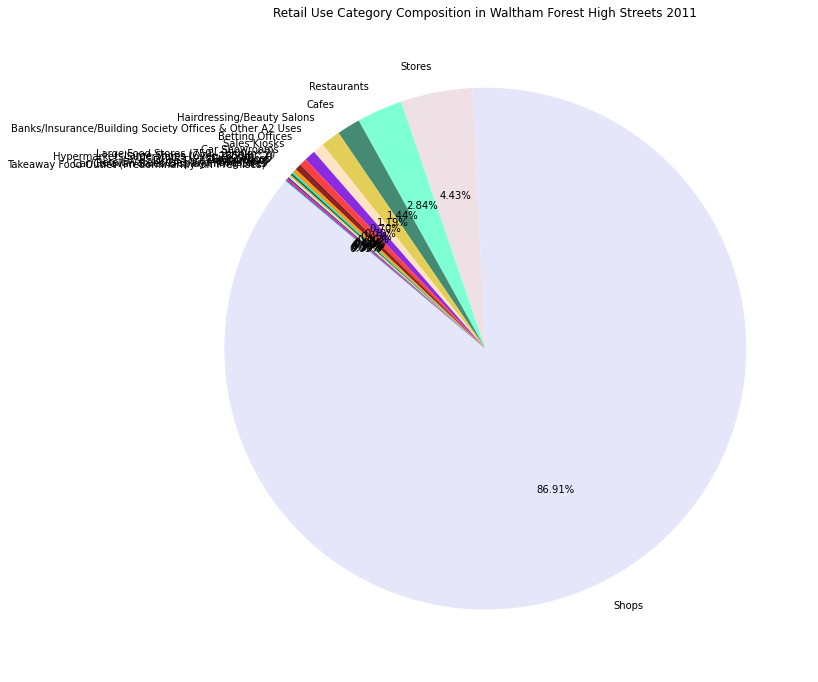

The number of each retail category: 
Shops                                                       1746
Stores                                                        89
Restaurants                                                   57
Cafes                                                         29
Hairdressing/Beauty Salons                                    24
Banks/Insurance/Building Society Offices & Other A2 Uses      14
Betting Offices                                               14
Sales Kiosks                                                   9
Car Showrooms                                                  8
Large Food Stores (750 - 2500m^2)                              5
Large Shops (Over 1850m^2)                                     2
Hypermarkets/Superstores (over 2500m^2)                        2
Post Offices                                                   2
Showrooms                                                      2
Drive-Thru Restaurants                               

In [152]:
# Count the number of each retail lcategory
wf11_hs_retail_counts = wf_hs_retail11['use_category'].value_counts()

# Calculate the proportion of each category
wf11_hs_retail_percentages = wf11_hs_retail_counts / wf11_hs_retail_counts.sum()

# bar chart
plt.figure(figsize=(12, 12))
colors25 = ['#E6E6FA', '#EEE0E5', '#7FFFD4', '#458B74', '#E3CF57', 
            '#FFE4C4', '#8A2BE2', '#FF4040', '#8B2323', '#FF9912', '#00EEEE',  
            '#006400', '#E9967A', '#C1FFC1', '#483D8B', '#FF1493', 
            '#8B0A50', '#00BFFF', '#00688B', '#696969', '#104E8B', 
            '#030303', '#B0B0B0', '#838B83', '#CD6090']

plt.pie(wf11_hs_retail_percentages, labels=wf11_hs_retail_percentages.index, autopct='%.2f%%', startangle=140, colors = colors25)
plt.title('Retail Use Category Composition in Waltham Forest High Streets 2011')
plt.show()

print("The number of each retail category: ")
print(wf11_hs_retail_counts)

print("The proportion of each retail category:")
print(wf11_hs_retail_counts)

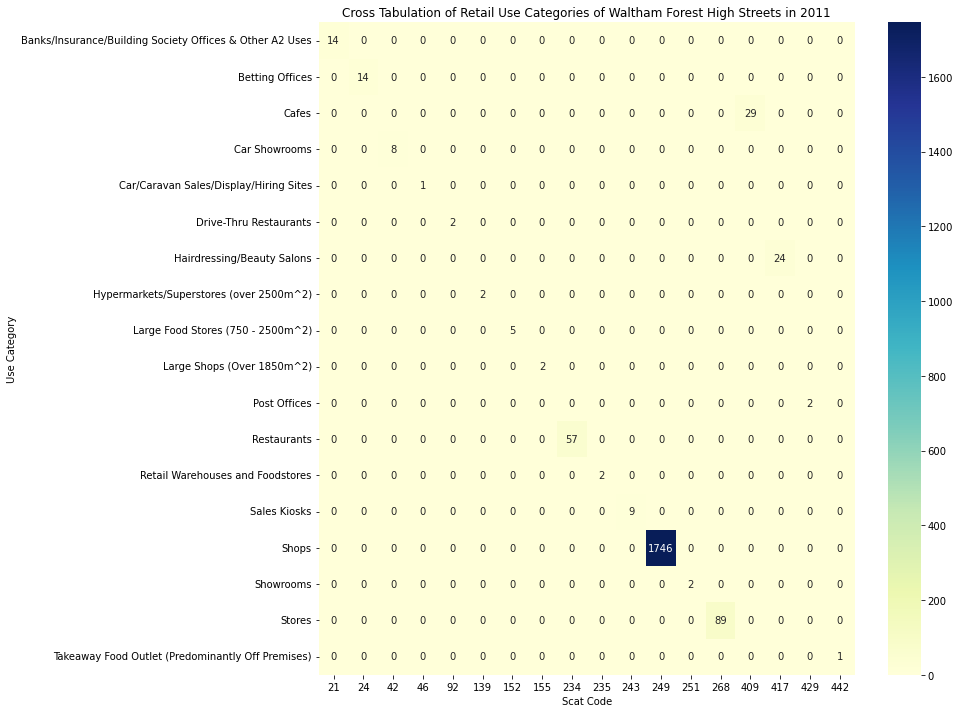

In [153]:
cross_tab_wf_hs11 = pd.crosstab(index=wf_hs_retail11['use_category'], columns=wf_hs_retail11['scat_code'])

# plot
plt.figure(figsize=(12, 12))
sns.heatmap(cross_tab_wf_hs11, annot=True, fmt='d', cmap='YlGnBu') 
plt.title('Cross Tabulation of Retail Use Categories of Waltham Forest High Streets in 2011')
plt.xlabel('Scat Code')
plt.ylabel('Use Category')
plt.show()

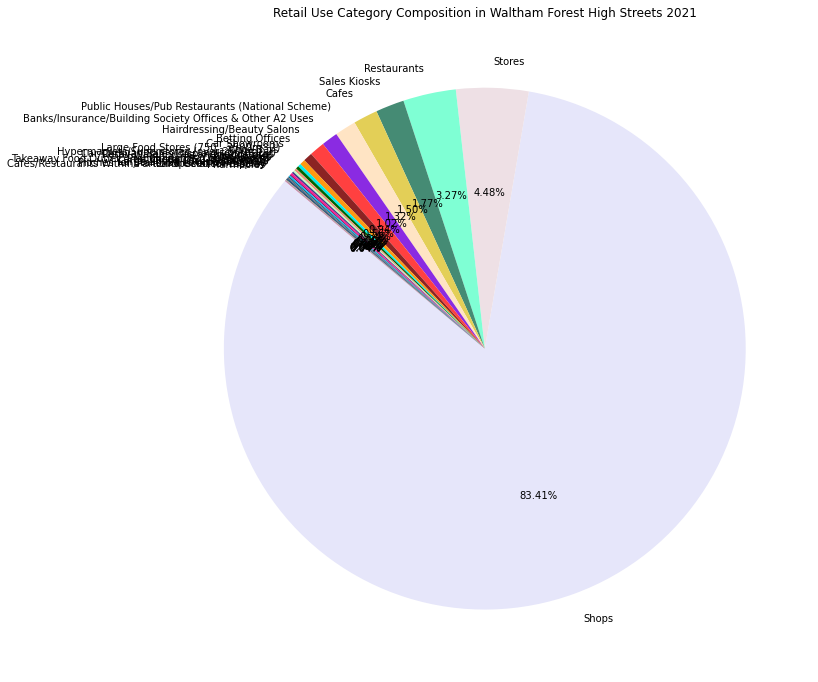

The number of each retail category: 
Shops                                                       2217
Stores                                                       119
Restaurants                                                   87
Sales Kiosks                                                  47
Cafes                                                         40
Public Houses/Pub Restaurants (National Scheme)               35
Banks/Insurance/Building Society Offices & Other A2 Uses      27
Hairdressing/Beauty Salons                                    25
Betting Offices                                               15
Car Showrooms                                                  9
Large Food Stores (750 - 2500m^2)                              5
Wine Bars                                                      5
Hypermarkets/Superstores (over 2500m^2)                        4
Car/Caravan Sales/Display/Hiring Sites                         3
Retail Warehouses and Foodstores                     

In [154]:
# Count the number of each retail lcategory
wf21_hs_retail_counts = wf_hs_retail21['use_category'].value_counts()

# Calculate the proportion of each category
wf21_hs_retail_percentages = wf21_hs_retail_counts / wf21_hs_retail_counts.sum()

# bar chart
plt.figure(figsize=(12, 12))
plt.pie(wf21_hs_retail_counts, labels=wf21_hs_retail_counts.index, autopct='%.2f%%', startangle=140, colors = colors25)
plt.title('Retail Use Category Composition in Waltham Forest High Streets 2021')
plt.show()

print("The number of each retail category: ")
print(wf21_hs_retail_counts)

print("The proportion of each retail category:")
print(wf21_hs_retail_counts)

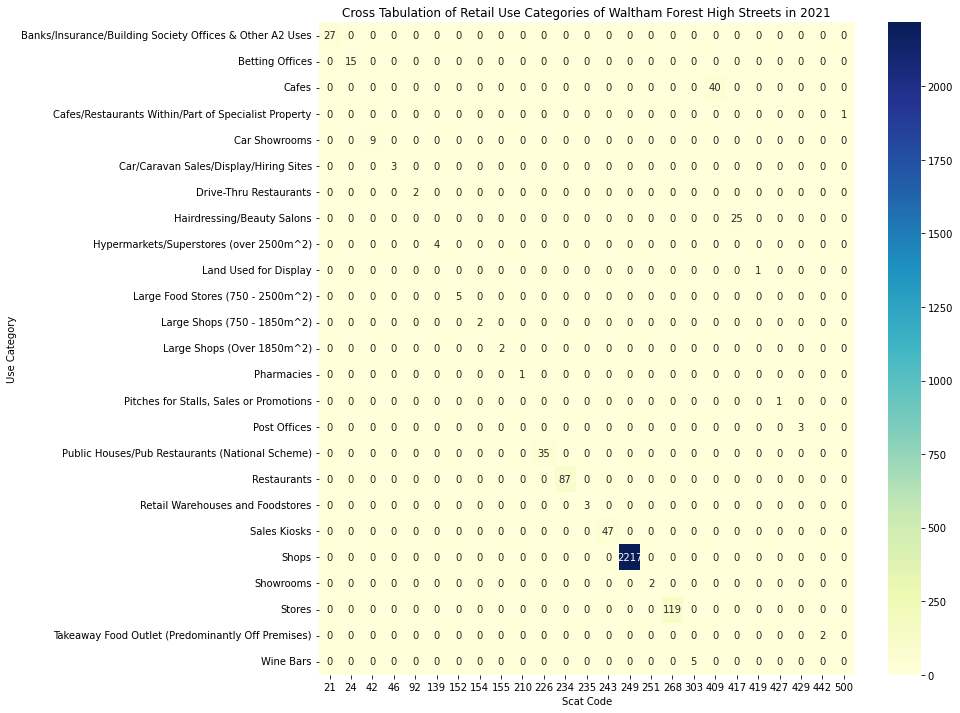

In [155]:
cross_tab_wf_hs21 = pd.crosstab(index=wf_hs_retail21['use_category'], columns=wf_hs_retail21['scat_code'])

# plot
plt.figure(figsize=(12, 12))
sns.heatmap(cross_tab_wf_hs21, annot=True, fmt='d', cmap='YlGnBu') 
plt.title('Cross Tabulation of Retail Use Categories of Waltham Forest High Streets in 2021')
plt.xlabel('Scat Code')
plt.ylabel('Use Category')
plt.show()

In [156]:
cross_tab_changes_wf_hs = cross_tab_wf_hs21.copy()
cross_tab_changes_wf_hs.update(cross_tab_wf_hs21 - cross_tab_wf_hs11)

# check if thereare NA value
has_na = cross_tab_changes_wf_hs.isna().any().any()

if has_na:
    print("cross tab has NaN values")
else:
    print("cross tab has no NaN values")

cross tab has no NaN values


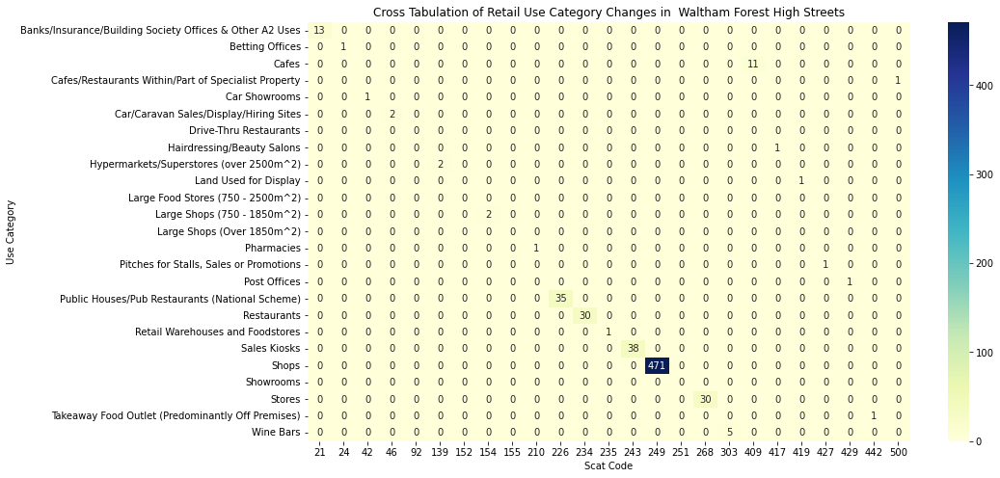

In [157]:
cross_tab_changes_wf_hs = cross_tab_changes_wf_hs.astype(int)

# plot
plt.figure(figsize=(14, 8))
sns.heatmap(cross_tab_changes_wf_hs, annot=True, fmt='d', cmap='YlGnBu') 
plt.title('Cross Tabulation of Retail Use Category Changes in  Waltham Forest High Streets')
plt.xlabel('Scat Code')
plt.ylabel('Use Category')
plt.show() 

In [158]:
negative_count = (cross_tab_changes_wf_hs < 0).sum().sum()
print("Number of negative values:", negative_count)

Number of negative values: 0


In [159]:
hs_retail_counts = wf21_hs_retail_counts.copy()
hs_retail_counts.update(wf21_hs_retail_counts - wf11_hs_retail_counts)
hs_retail_counts = hs_retail_counts.to_frame().reset_index()
hs_retail_counts = hs_retail_counts.rename(columns={'index':'use_category', 'use_category':'counts'})
hs_retail_counts

,use_category,counts
0,Shops,471
1,Stores,30
2,Restaurants,30
3,Sales Kiosks,38
4,Cafes,11
5,Public Houses/Pub Restaurants (National Scheme),35
6,Banks/Insurance/Building Society Offices & Oth...,13
7,Hairdressing/Beauty Salons,1
8,Betting Offices,1
9,Car Showrooms,1


<Figure size 720x864 with 0 Axes>

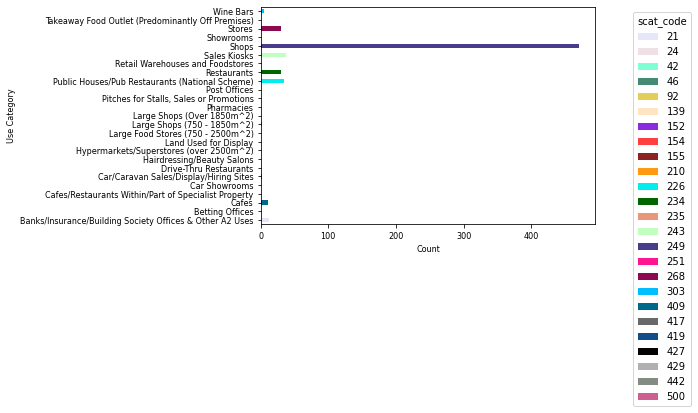

In [160]:
# Extract non-zero items
non_zero_cross_tab_wf_hs = cross_tab_changes_wf_hs[cross_tab_changes_wf_hs != 0]
unique_categories = non_zero_cross_tab_wf_hs.index.tolist()

# plot bar chart
plt.figure(figsize=(10, 12))

ax=non_zero_cross_tab_wf_hs.plot(kind='barh', stacked=True, color=colors25)
#plt.title('Retail Category Changes in Waltham Forest High Streets from 2011 to 2021')

plt.xlabel('Count', fontsize=8)
plt.xticks(rotation=0, fontsize=8)
plt.ylabel('Use Category', fontsize=8)
plt.yticks(range(len(unique_categories)), unique_categories, fontsize=8) 

ax.margins(y=0.1)
plt.legend(title='scat_code', loc='upper right', bbox_to_anchor=(1.3, 1))
#ax.legend().set_visible(False)


plt.show()      

In [161]:
code_category = wf_hs_retail21.loc[:, ['use_category', 'scat_code']].copy()

code_category = code_category.drop_duplicates()

code_category = code_category.reset_index(drop=True)

code_category

,use_category,scat_code
0,Restaurants,234
1,Public Houses/Pub Restaurants (National Scheme),226
2,Shops,249
3,Hairdressing/Beauty Salons,417
4,Cafes,409
5,Sales Kiosks,243
6,Stores,268
7,Banks/Insurance/Building Society Offices & Oth...,21
8,Large Shops (Over 1850m^2),155
9,Wine Bars,303


In [162]:
# save to excel file

excel_file_path = os.path.join('Data', "code_lookup_use_category_hs.xlsx")
code_category.to_excel(excel_file_path, index=False)
print(f"DataFrame saved in {excel_file_path}")

DataFrame saved in Data/code_lookup_use_category_hs.xlsx


In [163]:
hs_retail_percentages11 = wf11_hs_retail_percentages.to_frame().reset_index()
hs_retail_percentages11.rename(columns={'index': 'use_category', 'use_category': 'percentage11'}, inplace=True)
hs_retail_percentages11 = hs_retail_percentages11.merge(code_category, on='use_category', how='right')

hs_retail_percentages21 = wf21_hs_retail_percentages.to_frame().reset_index()
hs_retail_percentages21.rename(columns={'index': 'use_category', 'use_category': 'percentage21'}, inplace=True)
hs_retail_percentages21 = hs_retail_percentages21.merge(code_category, on='use_category', how='left')

hs_retail_percentages = hs_retail_percentages21.merge(hs_retail_percentages11, on='use_category', how='left', suffixes=('', '*'))
hs_retail_percentages = hs_retail_percentages.filter(regex='^[^*]*$')
hs_retail_percentages = hs_retail_percentages.fillna(0)

hs_retail_percentages['percentage_change'] = ((hs_retail_percentages['percentage21'] - hs_retail_percentages['percentage11']) * 100).round(2)

hs_retail_percentages['scat_code'] = hs_retail_percentages['scat_code'].astype('object')

hs_retail_percentages = hs_retail_percentages.sort_values(by='percentage_change', key=lambda x: abs(x), ascending=False)
hs_retail_percentages = hs_retail_percentages.reset_index(drop=True)
hs_retail_percentages

,use_category,percentage21,scat_code,percentage11,percentage_change
0,Shops,0.834086,249,0.869089,-3.50
1,Sales Kiosks,0.017682,243,0.004480,1.32
2,Public Houses/Pub Restaurants (National Scheme),0.013168,226,0.000000,1.32
3,Restaurants,0.032731,234,0.028372,0.44
4,Banks/Insurance/Building Society Offices & Oth...,0.010158,21,0.006969,0.32
5,Hairdressing/Beauty Salons,0.009406,417,0.011946,-0.25
6,Wine Bars,0.001881,303,0.000000,0.19
7,Betting Offices,0.005643,24,0.006969,-0.13
8,Large Shops (750 - 1850m^2),0.000752,154,0.000000,0.08
9,Car/Caravan Sales/Display/Hiring Sites,0.001129,46,0.000498,0.06


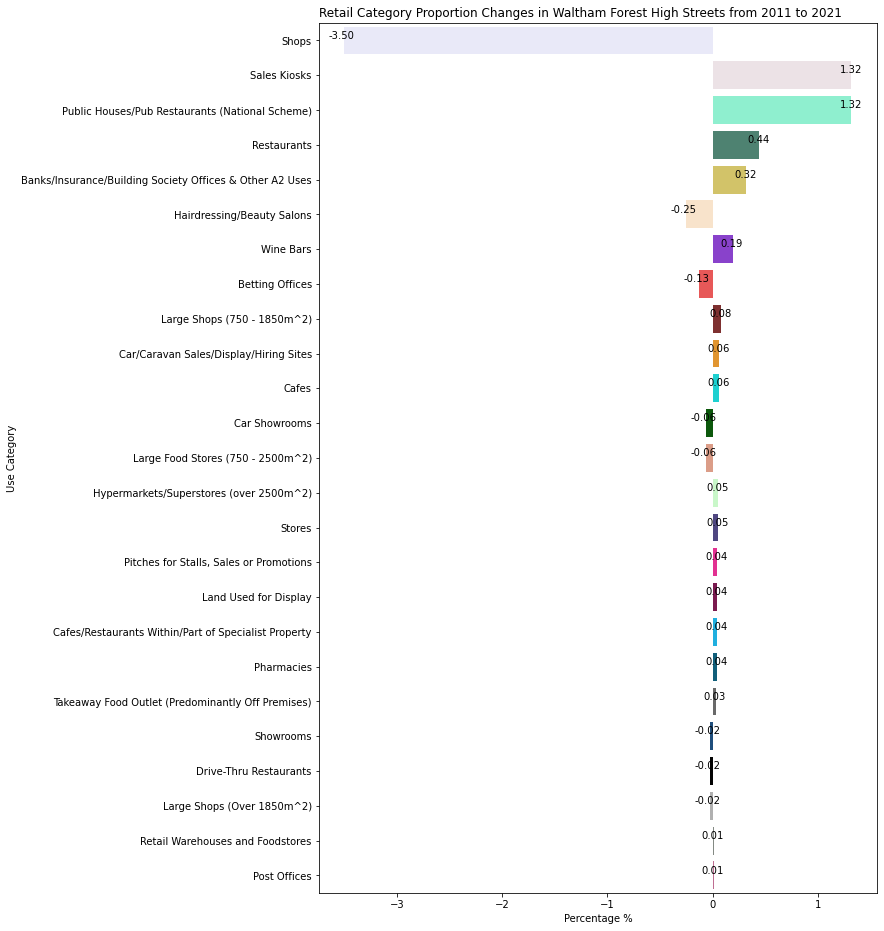

In [164]:
fig, ax = plt.subplots(figsize=(10, 16))
sns.barplot(x='percentage_change', y='use_category',  palette=colors25, data=hs_retail_percentages, orient='h', ax=ax)
ax.set_ylabel('Use Category')
ax.set_xlabel('Percentage %')
ax.set_title('Retail Category Proportion Changes in Waltham Forest High Streets from 2011 to 2021', loc='left')
for rect in ax.patches: 
        width = rect.get_width()
        plt.text(width + 0.1, rect.get_y() + rect.get_height()/2, f'{width:.2f}', ha='right', va='bottom')
plt.show()

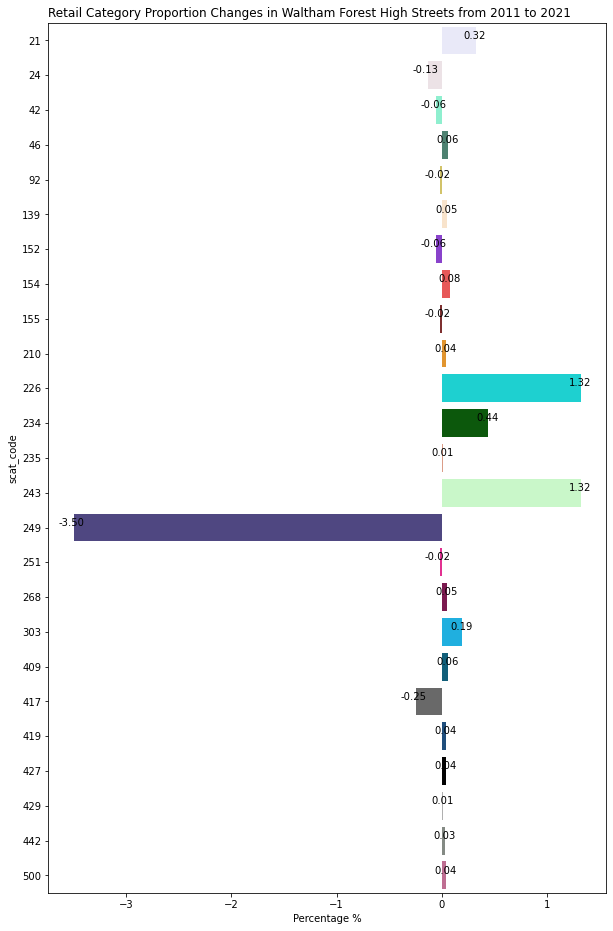

In [165]:
colors25_= {21:colors25[0], 24:colors25[1], 42:colors25[2], 46:colors25[3], 92:colors25[4], 
            139:colors25[5], 152:colors25[6], 154:colors25[7], 155:colors25[8], 210:colors25[9], 
            226:colors25[10], 234:colors25[11], 235:colors25[12], 243:colors25[13], 249:colors25[14], 
            251:colors25[15], 268:colors25[16], 303:colors25[17], 409:colors25[18], 417:colors25[19], 
            419:colors25[20], 427:colors25[21], 429:colors25[22], 442:colors25[23], 500:colors25[24]}

fig, ax = plt.subplots(figsize=(10, 16))
sns.barplot(x='percentage_change', y='scat_code',  palette=colors25_, data=hs_retail_percentages, orient='h', ax=ax)
ax.set_ylabel('scat_code')
ax.set_xlabel('Percentage %')
ax.set_title('Retail Category Proportion Changes in Waltham Forest High Streets from 2011 to 2021', loc='left')
for rect in ax.patches: 
        width = rect.get_width()
        plt.text(width + 0.1, rect.get_y() + rect.get_height()/2, f'{width:.2f}', ha='right', va='bottom')

plt.show()

In [166]:
hs_retail_percentages.head(10)

,use_category,percentage21,scat_code,percentage11,percentage_change
0,Shops,0.834086,249,0.869089,-3.50
1,Sales Kiosks,0.017682,243,0.004480,1.32
2,Public Houses/Pub Restaurants (National Scheme),0.013168,226,0.000000,1.32
3,Restaurants,0.032731,234,0.028372,0.44
4,Banks/Insurance/Building Society Offices & Oth...,0.010158,21,0.006969,0.32
5,Hairdressing/Beauty Salons,0.009406,417,0.011946,-0.25
6,Wine Bars,0.001881,303,0.000000,0.19
7,Betting Offices,0.005643,24,0.006969,-0.13
8,Large Shops (750 - 1850m^2),0.000752,154,0.000000,0.08
9,Car/Caravan Sales/Display/Hiring Sites,0.001129,46,0.000498,0.06


In [167]:
top_in_11 = cross_tab_wf_hs11.stack().nlargest(15)
top_in_11_values = top_in_11.values
top_in_11_index = top_in_11.index

top_in_11_index

MultiIndex([(                                                   'Shops', 249),
            (                                                  'Stores', 268),
            (                                             'Restaurants', 234),
            (                                                   'Cafes', 409),
            (                              'Hairdressing/Beauty Salons', 417),
            ('Banks/Insurance/Building Society Offices & Other A2 Uses',  21),
            (                                         'Betting Offices',  24),
            (                                            'Sales Kiosks', 243),
            (                                           'Car Showrooms',  42),
            (                       'Large Food Stores (750 - 2500m^2)', 152),
            (                                  'Drive-Thru Restaurants',  92),
            (                 'Hypermarkets/Superstores (over 2500m^2)', 139),
            (                              'Large Sh

In [168]:
top_in_11_values

array([1746,   89,   57,   29,   24,   14,   14,    9,    8,    5,    2,
          2,    2,    2,    2])

In [169]:
top_21 = cross_tab_wf_hs21.stack().nlargest(15)
top_21_values = top_21.values
top_21_index = top_21.index

top_21_index

MultiIndex([(                                                   'Shops', 249),
            (                                                  'Stores', 268),
            (                                             'Restaurants', 234),
            (                                            'Sales Kiosks', 243),
            (                                                   'Cafes', 409),
            (         'Public Houses/Pub Restaurants (National Scheme)', 226),
            ('Banks/Insurance/Building Society Offices & Other A2 Uses',  21),
            (                              'Hairdressing/Beauty Salons', 417),
            (                                         'Betting Offices',  24),
            (                                           'Car Showrooms',  42),
            (                       'Large Food Stores (750 - 2500m^2)', 152),
            (                                               'Wine Bars', 303),
            (                 'Hypermarkets/Supersto

In [170]:
top_21_values

array([2217,  119,   87,   47,   40,   35,   27,   25,   15,    9,    5,
          5,    4,    3,    3])

##### Select Retail Category

There are ***a total of 28 retail sub categories***, so we combined the retail category with the largest change and the category with the largest number in 2011 and 2021 to make a selection. 

We selected 14 top changed use categories based on the description of retal gentrification in the literature review

In [171]:
categories_extract = ['Shops', 'Sales Kiosks', 'Public Houses/Pub Restaurants (National Scheme)', 'Stores', 
                    'Restaurants', 'Banks/Insurance/Building Society Offices & Other A2 Uses', 'Cafes', 
                    'Wine Bars', 'Car/Caravan Sales/Display/Hiring Sites', 'Hairdressing/Beauty Salons', 
                    'Hypermarkets/Superstores (over 2500m^2)', 'Large Shops (750 - 1850m^2)', 
                    'Betting Offices', 'Cafes/Restaurants Within/Part of Specialist Property']

non_zero_cross_tab_wf_hs21 = cross_tab_wf_hs21[cross_tab_wf_hs21 != 0]

filtered_category = non_zero_cross_tab_wf_hs.loc[categories_extract]
# Extract all non-NaN values of cross_tab
filtered_category_no_nan = filtered_category.stack() # series
# Turn series to dataframe
filtered_category_no_nan = filtered_category_no_nan.reset_index()
filtered_category_no_nan = filtered_category_no_nan.rename(columns={0: 'changes_count'})

selected_category = pd.DataFrame(filtered_category_no_nan, columns=['use_category', 'scat_code', 'changes_count'])

<Figure size 1152x720 with 0 Axes>

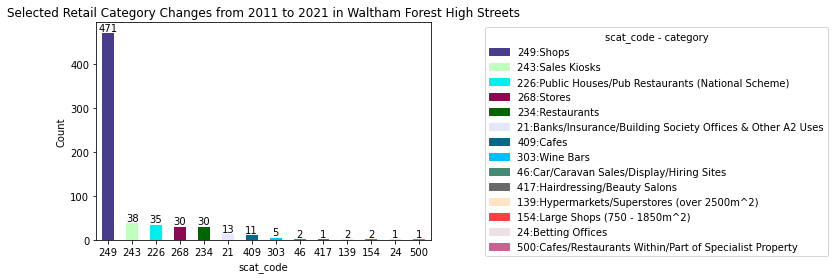

In [172]:
plt.figure(figsize=(16, 10))

# Plot the histogram

# pie chart
color_category = ['#483D8B', '#C1FFC1', '#00EEEE', '#8B0A50', '#006400', '#E6E6FA', 
                  '#00688B', '#00BFFF', '#458B74', '#696969', '#FFE4C4', '#FF4040', 
                  '#EEE0E5', '#CD6090']

# Plot the histogram
ax = selected_category.plot(x='scat_code', y='changes_count', kind='bar', stacked=True, color=color_category)

# Add labels to the bars
for p in ax.patches:
    ax.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.title('Selected Retail Category Changes from 2011 to 2021 in Waltham Forest High Streets')
plt.xlabel('scat_code')
plt.ylabel('Count')
plt.xticks(rotation=0)

# Create legend handles and labels using scat_code values and colors
legend_labels = selected_category['scat_code'].unique()
legend_handles_code = [mpatches.Patch(color=color, label=f"{label}:{category}") 
                       for label, color, category in zip(legend_labels, color_category, selected_category['use_category'])]

# Add the custom legend to the plot
ax.legend(handles=legend_handles_code, title='scat_code - category', loc='upper right', bbox_to_anchor=(2.2, 1))

plt.show()

##### Duration Changes

'status_duration'

less than 1 year : <365

1 - 3 years: 365, 1095

3 - 5 years: 1095, 1825

5 - 10 years: 1825, 3650

more than 10 years: >=3650

First check the 'status'

In [173]:
status_counts11 = wf_highstreet_retail11.groupby(['highstreet_id', 'status']).size().reset_index(name='counts')
status_counts11

,highstreet_id,status,counts
0,237,True,11
1,244,True,92
2,249,True,57
3,252,True,145
4,257,False,1
5,257,True,34
6,397,True,87
7,466,False,1
8,466,True,43
9,503,False,4


In [174]:
status_counts21 = wf_highstreet_retail21.groupby(['highstreet_id', 'status']).size().reset_index(name='counts')
status_counts21

,highstreet_id,status,counts
0,237,True,14
1,244,False,2
2,244,True,117
3,249,False,3
4,249,True,67
5,252,False,12
6,252,True,163
7,257,False,9
8,257,True,30
9,397,False,5


Check column 'status_duration'

In [175]:
# count the number of NaN values in column 'status_duration'
duration_nan_count11 = wf_highstreet_retail11['status_duration'].isna().sum()

duration_nan_count11

1701

In [176]:
# count the number of NaN values in column 'status_duration'
duration_nan_count21 = wf_highstreet_retail21['status_duration'].isna().sum()

duration_nan_count21

1238

Before processing the column, we calculate date difference and fill in the missing status_duration column

In [177]:
# Calculate date difference and fill in the missing status_duration column
wf_highstreet_retail11['status_duration'] = (wf_highstreet_retail11['period'] - wf_highstreet_retail11['status_date']).dt.days

wf_highstreet_retail11.sample(6)

,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,rates_code,pc__pcs,use_category,...,lat,long,geometry,index,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD
195,E09000031,Waltham Forest,Outer London - East and North East,1726543000,7,WINCHESTER ROAD,LONDON,00000008845061,E4 9LQ,Shops,...,51.607338,-0.000963,POINT (538524.987 191726.048),403,397,"The Avenue, Highams Park.",9.215191,None,Waltham Forest,E09000031
249,E09000031,Waltham Forest,Outer London - East and North East,186262057,GND F 36,CAPWORTH STREET,LONDON,0000000222750A,E10 7HA,Shops,...,51.573151,-0.011812,POINT (537877.077 187903.769),520,508,"High Street/Hoe Street, Walthamstow",95.428617,None,Waltham Forest,E09000031
1377,E09000031,Waltham Forest,Outer London - East and North East,5335215000,34,CHURCH LANE,LONDON,00000002630811,E11 1HG,Shops,...,51.568244,0.009099,POINT (539341.093 187397.730),515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031
759,E09000031,Waltham Forest,Outer London - East and North East,4401191000,401,HOE STREET,LONDON,00000004898356,E17 9AP,Shops,...,51.576126,-0.014409,POINT (537688.140 188229.706),520,508,"High Street/Hoe Street, Walthamstow",95.428617,None,Waltham Forest,E09000031
1469,E09000031,Waltham Forest,Outer London - East and North East,47564057,755,HIGH ROAD LEYTONSTONE,LONDON,00000004798417,E11 4QS,Shops,...,51.566459,0.010029,POINT (539410.999 187201.006),515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031
1801,E09000031,Waltham Forest,Outer London - East and North East,34428057,178,FOREST ROAD,LONDON,00000003937455,E17 6JG,Shops,...,51.588381,-0.031920,POINT (536438.208 189559.726),250,244,"Forest Road (Pembar Avenue), Blackhorse Road",5.781402,None,Waltham Forest,E09000031


In [178]:
# Classify open local retail location data according to the duration
duration_bins = [0, 365, 1095, 1825, 3650, float('inf')]
duration_labels = ['less_than_1year', '1_to_3yrs', '3_to_5yrs', '5_to_10yrs', 'more_than_10yrs']

# create new column for this category
wf_highstreet_retail11['duration_category'] = pd.cut(wf_highstreet_retail11['status_duration'], bins=duration_bins, labels=duration_labels)

wf_highstreet_retail11.head()

,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,rates_code,pc__pcs,use_category,...,long,geometry,index,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,duration_category
0,E09000031,Waltham Forest,Outer London - East and North East,185965057,1 & 2,ALBERT CRESCENT,LONDON,00000001087017,E4 6SH,Shops,...,-0.018464,POINT (537282.992 192805.965),258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,1_to_3yrs
1,E09000031,Waltham Forest,Outer London - East and North East,202328057,4,ALBERT CRESCENT,LONDON,00000001087036,E4 6SH,Shops,...,-0.018464,POINT (537282.992 192805.965),258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,more_than_10yrs
2,E09000031,Waltham Forest,Outer London - East and North East,1126057,5,ALBERT CRESCENT,LONDON,0000000108704B,E4 6SH,Shops,...,-0.018464,POINT (537282.992 192805.965),258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,less_than_1year
3,E09000031,Waltham Forest,Outer London - East and North East,1122057,10,ALBERT CRESCENT,LONDON,00000001087089,E4 6SH,Shops,...,-0.018464,POINT (537282.992 192805.965),258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,5_to_10yrs
4,E09000031,Waltham Forest,Outer London - East and North East,202329057,3,ALBERT CRESCENT,LONDON,0000000108711B,E4 6SH,Shops,...,-0.018464,POINT (537282.992 192805.965),258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,less_than_1year


In [179]:
# Convert date column to datetime type
wf_highstreet_retail21['status_date'] = pd.to_datetime(wf_highstreet_retail21['status_date'])
wf_highstreet_retail21['period'] = pd.to_datetime(wf_highstreet_retail21['period'])

# Calculate date difference and fill in the missing status_duration column
wf_highstreet_retail21['status_duration'] = (wf_highstreet_retail21['period'] - wf_highstreet_retail21['status_date']).dt.days

# Classify open local retail location data according to the duration
# duration_bins = [0, 365, 1095, 1825, 3650, float('inf')]
# duration_labels = ['less_than_1year', '1_to_3yrs', '3_to_5yrs', '5_to_1oyrs', 'more_than_10yrs']

# create new column for this category
wf_highstreet_retail21['duration_category'] = pd.cut(wf_highstreet_retail21['status_duration'], bins=duration_bins, labels=duration_labels)

wf_highstreet_retail21.head()

,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,rates_code,pc__pcs,use_category,...,long,geometry,index,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,duration_category
0,E09000031,Waltham Forest,Outer London - East and North East,47812057,734,HIGH ROAD LEYTONSTONE,LONDON,00000004803598,E11 3AW,Restaurants,...,0.01435,POINT (539698.991 187626.042),515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,3_to_5yrs
1,E09000031,Waltham Forest,Outer London - East and North East,2100693000,O'NEILLS 762,HIGH ROAD LEYTONSTONE,LONDON,00000004803738,E11 3AW,Public Houses/Pub Restaurants (National Scheme),...,0.01435,POINT (539698.991 187626.042),515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,more_than_10yrs
2,E09000031,Waltham Forest,Outer London - East and North East,47817057,740,HIGH ROAD LEYTONSTONE,LONDON,00000004808549,E11 3AW,Shops,...,0.01435,POINT (539698.991 187626.042),515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,more_than_10yrs
3,E09000031,Waltham Forest,Outer London - East and North East,256471057,748,HIGH ROAD LEYTONSTONE,LONDON,00000004808708,E11 3AW,Restaurants,...,0.01435,POINT (539698.991 187626.042),515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,3_to_5yrs
4,E09000031,Waltham Forest,Outer London - East and North East,333579000,740 A AND C,HIGH ROAD LEYTONSTONE,LONDON,00000004808731,E11 3AW,Shops,...,0.01435,POINT (539698.991 187626.042),515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,3_to_5yrs


In [180]:
duration11 = wf_highstreet_retail11.groupby(['highstreet_id', 'duration_category']).size().reset_index(name='count')
duration11.head(10)

,highstreet_id,duration_category,count
0,237,less_than_1year,8
1,237,1_to_3yrs,0
2,237,3_to_5yrs,1
3,237,5_to_10yrs,2
4,237,more_than_10yrs,0
5,244,less_than_1year,79
6,244,1_to_3yrs,4
7,244,3_to_5yrs,2
8,244,5_to_10yrs,5
9,244,more_than_10yrs,1


In [181]:
duration11.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55 entries, 0 to 54
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   highstreet_id      55 non-null     int64   
 1   duration_category  55 non-null     category
 2   count              55 non-null     int64   
dtypes: category(1), int64(2)
memory usage: 1.2 KB


In [182]:
duration21 = wf_highstreet_retail21.groupby(['highstreet_id', 'duration_category']).size().reset_index(name='count')

duration21.head(10)

,highstreet_id,duration_category,count
0,237,less_than_1year,0
1,237,1_to_3yrs,1
2,237,3_to_5yrs,8
3,237,5_to_10yrs,2
4,237,more_than_10yrs,3
5,244,less_than_1year,3
6,244,1_to_3yrs,8
7,244,3_to_5yrs,83
8,244,5_to_10yrs,15
9,244,more_than_10yrs,10


In [183]:
duration = duration21.copy()
duration['count'].update(duration21['count'] - duration11['count'])
duration

,highstreet_id,duration_category,count
0,237,less_than_1year,-8
1,237,1_to_3yrs,1
2,237,3_to_5yrs,7
3,237,5_to_10yrs,0
4,237,more_than_10yrs,3
5,244,less_than_1year,-76
6,244,1_to_3yrs,4
7,244,3_to_5yrs,81
8,244,5_to_10yrs,10
9,244,more_than_10yrs,9


In [184]:
duration_changes = duration.pivot_table(values='count', index='highstreet_id', columns='duration_category', aggfunc='sum')
duration_changes = duration_changes.reset_index()
duration_changes = duration_changes.rename_axis('index', axis=1)
duration_changes

index,highstreet_id,less_than_1year,1_to_3yrs,3_to_5yrs,5_to_10yrs,more_than_10yrs
0,237,-8,1,7,0,3
1,244,-76,4,81,10,9
2,249,-44,8,36,6,7
3,252,-101,17,74,19,21
4,257,-27,7,19,2,3
5,397,-65,12,69,13,6
6,466,-40,5,37,5,0
7,503,-174,31,166,16,31
8,507,-128,13,151,13,14
9,508,-797,158,784,127,107


In [185]:
duration_changes['highstreet_id'] = duration_changes['highstreet_id'].astype('object')
duration_changes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11 entries, 0 to 10
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   highstreet_id    11 non-null     object
 1   less_than_1year  11 non-null     int64 
 2   1_to_3yrs        11 non-null     int64 
 3   3_to_5yrs        11 non-null     int64 
 4   5_to_10yrs       11 non-null     int64 
 5   more_than_10yrs  11 non-null     int64 
dtypes: int64(5), object(1)
memory usage: 656.0+ bytes


##### Composition Change

Select out the cateogries lists for retail 2011 and 2021 in the HIGH STREETS

In [186]:
selected_scat_codes = [249, 243, 226, 268, 234, 21, 409, 303, 46, 417, 139, 154, 24, 500]
wf_hs_topretail11 = wf_highstreet_retail11[wf_highstreet_retail11['scat_code'].isin(selected_scat_codes)]

wf_hs_topretail11.head()

,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,rates_code,pc__pcs,use_category,...,long,geometry,index,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,duration_category
0,E09000031,Waltham Forest,Outer London - East and North East,185965057,1 & 2,ALBERT CRESCENT,LONDON,00000001087017,E4 6SH,Shops,...,-0.018464,POINT (537282.992 192805.965),258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,1_to_3yrs
1,E09000031,Waltham Forest,Outer London - East and North East,202328057,4,ALBERT CRESCENT,LONDON,00000001087036,E4 6SH,Shops,...,-0.018464,POINT (537282.992 192805.965),258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,more_than_10yrs
2,E09000031,Waltham Forest,Outer London - East and North East,1126057,5,ALBERT CRESCENT,LONDON,0000000108704B,E4 6SH,Shops,...,-0.018464,POINT (537282.992 192805.965),258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,less_than_1year
3,E09000031,Waltham Forest,Outer London - East and North East,1122057,10,ALBERT CRESCENT,LONDON,00000001087089,E4 6SH,Shops,...,-0.018464,POINT (537282.992 192805.965),258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,5_to_10yrs
4,E09000031,Waltham Forest,Outer London - East and North East,202329057,3,ALBERT CRESCENT,LONDON,0000000108711B,E4 6SH,Shops,...,-0.018464,POINT (537282.992 192805.965),258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,less_than_1year


In [187]:
wf_hs_topretail21 = wf_highstreet_retail21[wf_highstreet_retail21['scat_code'].isin(selected_scat_codes)]

wf_hs_topretail21.head()

,rates_authority_id,rates_authority,region,location_code,address_no,address_street,address_town,rates_code,pc__pcs,use_category,...,long,geometry,index,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,duration_category
0,E09000031,Waltham Forest,Outer London - East and North East,47812057,734,HIGH ROAD LEYTONSTONE,LONDON,00000004803598,E11 3AW,Restaurants,...,0.01435,POINT (539698.991 187626.042),515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,3_to_5yrs
1,E09000031,Waltham Forest,Outer London - East and North East,2100693000,O'NEILLS 762,HIGH ROAD LEYTONSTONE,LONDON,00000004803738,E11 3AW,Public Houses/Pub Restaurants (National Scheme),...,0.01435,POINT (539698.991 187626.042),515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,more_than_10yrs
2,E09000031,Waltham Forest,Outer London - East and North East,47817057,740,HIGH ROAD LEYTONSTONE,LONDON,00000004808549,E11 3AW,Shops,...,0.01435,POINT (539698.991 187626.042),515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,more_than_10yrs
3,E09000031,Waltham Forest,Outer London - East and North East,256471057,748,HIGH ROAD LEYTONSTONE,LONDON,00000004808708,E11 3AW,Restaurants,...,0.01435,POINT (539698.991 187626.042),515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,3_to_5yrs
4,E09000031,Waltham Forest,Outer London - East and North East,333579000,740 A AND C,HIGH ROAD LEYTONSTONE,LONDON,00000004808731,E11 3AW,Shops,...,0.01435,POINT (539698.991 187626.042),515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,3_to_5yrs


In [188]:
total_retail_counts11 = wf_hs_topretail11.groupby('highstreet_id')['scat_code'].count()
composition11 = wf_hs_topretail11.groupby(['highstreet_id', 'scat_code', 'use_category']).size().reset_index(name='count')

# Calculate percentage
composition11['percentage'] = composition11.apply(lambda row: round(row['count'] / total_retail_counts11[row['highstreet_id']] * 100, 2), axis=1)

composition11.head(10)

,highstreet_id,scat_code,use_category,count,percentage
0,237,249,Shops,9,81.82
1,237,409,Cafes,1,9.09
2,237,417,Hairdressing/Beauty Salons,1,9.09
3,244,249,Shops,85,93.41
4,244,268,Stores,3,3.30
5,244,409,Cafes,2,2.20
6,244,417,Hairdressing/Beauty Salons,1,1.10
7,249,234,Restaurants,1,1.85
8,249,249,Shops,48,88.89
9,249,268,Stores,2,3.70


In [189]:
# composition11['highstreet_id'] = composition11['highstreet_id'].astype('object')
composition11['scat_code'] = composition11['scat_code'].astype('object')

composition11.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   highstreet_id  58 non-null     int64  
 1   scat_code      58 non-null     object 
 2   use_category   58 non-null     object 
 3   count          58 non-null     int64  
 4   percentage     58 non-null     float64
dtypes: float64(1), int64(2), object(2)
memory usage: 2.4+ KB


In [190]:
total_retail_counts21 = wf_hs_topretail21.groupby('highstreet_id')['scat_code'].count()
composition21 = wf_hs_topretail21.groupby(['highstreet_id', 'scat_code', 'use_category']).size().reset_index(name='count')

# Calculate percentage
composition21['percentage'] = composition21.apply(lambda row: round(row['count'] / total_retail_counts21[row['highstreet_id']] * 100, 2), axis=1)


# composition21['highstreet_id'] = composition21['highstreet_id'].astype('object')
composition21['scat_code'] = composition21['scat_code'].astype('object')

composition21.head(10)

,highstreet_id,scat_code,use_category,count,percentage
0,237,249,Shops,12,85.71
1,237,417,Hairdressing/Beauty Salons,2,14.29
2,244,226,Public Houses/Pub Restaurants (National Scheme),1,0.85
3,244,234,Restaurants,2,1.69
4,244,249,Shops,104,88.14
5,244,268,Stores,7,5.93
6,244,409,Cafes,2,1.69
7,244,417,Hairdressing/Beauty Salons,2,1.69
8,249,226,Public Houses/Pub Restaurants (National Scheme),1,1.49
9,249,249,Shops,61,91.04


In [191]:
composition11_21 = composition11.merge(composition21, on=['highstreet_id', 'scat_code', 'use_category'], how="outer")

composition11_21 = composition11_21.drop(columns=['count_x', 'count_y'])
composition11_21.fillna(0, inplace=True)
composition11_21 = composition11_21.rename(columns={'percentage_x': 'percentage_11', 'percentage_y': 'percentage_21'})


composition11_21

/opt/conda/lib/python3.10/site-packages/pandas/core/reshape/merge.py:916: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  key_col = Index(lvals).where(~mask_left, rvals)


,highstreet_id,scat_code,use_category,percentage_11,percentage_21
0,237,249.0,Shops,81.82,85.71
1,237,409.0,Cafes,9.09,0.00
2,237,417.0,Hairdressing/Beauty Salons,9.09,14.29
3,244,249.0,Shops,93.41,88.14
4,244,268.0,Stores,3.30,5.93
...,...,...,...,...,...
75,508,154.0,Large Shops (750 - 1850m^2),0.00,0.15
76,508,226.0,Public Houses/Pub Restaurants (National Scheme),0.00,1.09
77,508,500.0,Cafes/Restaurants Within/Part of Specialist Pr...,0.00,0.07
78,560,226.0,Public Houses/Pub Restaurants (National Scheme),0.00,0.68


In [192]:
# convert 'scat_code' dtype to object
composition11_21['scat_code'] = composition11_21['scat_code'].astype('str')
composition11_21['scat_code'] = composition11_21['scat_code'].str.replace('\.0+$', '', regex=True)
composition11_21['scat_code'] = composition11_21['scat_code'].astype('object')


composition11_21

,highstreet_id,scat_code,use_category,percentage_11,percentage_21
0,237,249,Shops,81.82,85.71
1,237,409,Cafes,9.09,0.00
2,237,417,Hairdressing/Beauty Salons,9.09,14.29
3,244,249,Shops,93.41,88.14
4,244,268,Stores,3.30,5.93
...,...,...,...,...,...
75,508,154,Large Shops (750 - 1850m^2),0.00,0.15
76,508,226,Public Houses/Pub Restaurants (National Scheme),0.00,1.09
77,508,500,Cafes/Restaurants Within/Part of Specialist Pr...,0.00,0.07
78,560,226,Public Houses/Pub Restaurants (National Scheme),0.00,0.68


In [193]:
composition11_21.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 80 entries, 0 to 79
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   highstreet_id  80 non-null     int64  
 1   scat_code      80 non-null     object 
 2   use_category   80 non-null     object 
 3   percentage_11  80 non-null     float64
 4   percentage_21  80 non-null     float64
dtypes: float64(2), int64(1), object(2)
memory usage: 3.8+ KB


In [194]:
total_retail_11 = wf_hs_topretail11.groupby('highstreet_id')['scat_code'].count()
composition11 = wf_hs_topretail11.groupby(['highstreet_id', 'scat_code', 'use_category']).size().reset_index(name='count')

# Calculate percentage
composition11['percentage'] = composition11.apply(lambda row: round(row['count'] / total_retail_counts11[row['highstreet_id']] * 100, 2), axis=1)

composition11.head(10)

,highstreet_id,scat_code,use_category,count,percentage
0,237,249,Shops,9,81.82
1,237,409,Cafes,1,9.09
2,237,417,Hairdressing/Beauty Salons,1,9.09
3,244,249,Shops,85,93.41
4,244,268,Stores,3,3.30
5,244,409,Cafes,2,2.20
6,244,417,Hairdressing/Beauty Salons,1,1.10
7,249,234,Restaurants,1,1.85
8,249,249,Shops,48,88.89
9,249,268,Stores,2,3.70


In [195]:
# composition11['highstreet_id'] = composition11['highstreet_id'].astype('object')
composition11['scat_code'] = composition11['scat_code'].astype('object')

composition11.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   highstreet_id  58 non-null     int64  
 1   scat_code      58 non-null     object 
 2   use_category   58 non-null     object 
 3   count          58 non-null     int64  
 4   percentage     58 non-null     float64
dtypes: float64(1), int64(2), object(2)
memory usage: 2.4+ KB


In [196]:
total_retail_counts21 = wf_hs_topretail21.groupby('highstreet_id')['scat_code'].count()
composition21 = wf_hs_topretail21.groupby(['highstreet_id', 'scat_code', 'use_category']).size().reset_index(name='count')

# Calculate percentage
composition21['percentage'] = composition21.apply(lambda row: round(row['count'] / total_retail_counts21[row['highstreet_id']] * 100, 2), axis=1)


# composition21['highstreet_id'] = composition21['highstreet_id'].astype('object')
composition21['scat_code'] = composition21['scat_code'].astype('object')

composition21.head(10)

,highstreet_id,scat_code,use_category,count,percentage
0,237,249,Shops,12,85.71
1,237,417,Hairdressing/Beauty Salons,2,14.29
2,244,226,Public Houses/Pub Restaurants (National Scheme),1,0.85
3,244,234,Restaurants,2,1.69
4,244,249,Shops,104,88.14
5,244,268,Stores,7,5.93
6,244,409,Cafes,2,1.69
7,244,417,Hairdressing/Beauty Salons,2,1.69
8,249,226,Public Houses/Pub Restaurants (National Scheme),1,1.49
9,249,249,Shops,61,91.04


In [197]:
composition11_21 = composition11.merge(composition21, on=['highstreet_id', 'scat_code', 'use_category'], how="outer")

composition11_21 = composition11_21.drop(columns=['count_x', 'count_y'])
composition11_21.fillna(0, inplace=True)
composition11_21 = composition11_21.rename(columns={'percentage_x': 'percentage_11', 'percentage_y': 'percentage_21'})


composition11_21

/opt/conda/lib/python3.10/site-packages/pandas/core/reshape/merge.py:916: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  key_col = Index(lvals).where(~mask_left, rvals)


,highstreet_id,scat_code,use_category,percentage_11,percentage_21
0,237,249.0,Shops,81.82,85.71
1,237,409.0,Cafes,9.09,0.00
2,237,417.0,Hairdressing/Beauty Salons,9.09,14.29
3,244,249.0,Shops,93.41,88.14
4,244,268.0,Stores,3.30,5.93
...,...,...,...,...,...
75,508,154.0,Large Shops (750 - 1850m^2),0.00,0.15
76,508,226.0,Public Houses/Pub Restaurants (National Scheme),0.00,1.09
77,508,500.0,Cafes/Restaurants Within/Part of Specialist Pr...,0.00,0.07
78,560,226.0,Public Houses/Pub Restaurants (National Scheme),0.00,0.68


In [198]:
# convert 'scat_code' dtype to object
composition11_21['scat_code'] = composition11_21['scat_code'].astype('str')
composition11_21['scat_code'] = composition11_21['scat_code'].str.replace('\.0+$', '', regex=True)
composition11_21['scat_code'] = composition11_21['scat_code'].astype('object')


composition11_21

,highstreet_id,scat_code,use_category,percentage_11,percentage_21
0,237,249,Shops,81.82,85.71
1,237,409,Cafes,9.09,0.00
2,237,417,Hairdressing/Beauty Salons,9.09,14.29
3,244,249,Shops,93.41,88.14
4,244,268,Stores,3.30,5.93
...,...,...,...,...,...
75,508,154,Large Shops (750 - 1850m^2),0.00,0.15
76,508,226,Public Houses/Pub Restaurants (National Scheme),0.00,1.09
77,508,500,Cafes/Restaurants Within/Part of Specialist Pr...,0.00,0.07
78,560,226,Public Houses/Pub Restaurants (National Scheme),0.00,0.68


##### plot to check

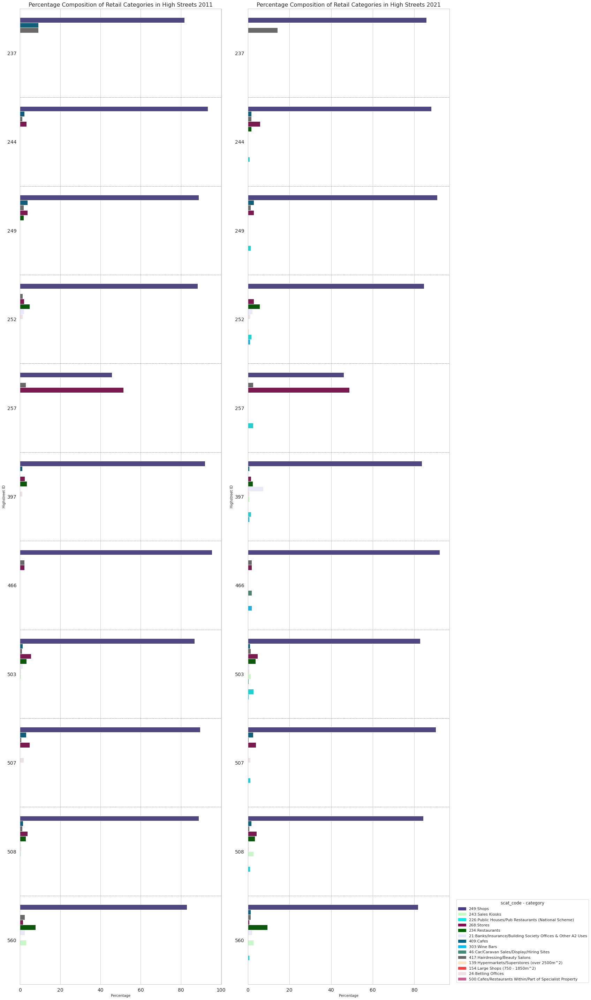

In [199]:
sns.set_style('whitegrid')
sns.set_context("notebook", rc={"axes.labelsize": 10, "axes.titlesize": 16, "xtick.labelsize": 14, "ytick.labelsize": 14})

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 40))

# set colors
custom_palette = {'249': color_category[0], '243': color_category[1], '226': color_category[2], '268': color_category[3], 
                  '234':color_category[4], '21':color_category[5], '409':color_category[6], '303': color_category[7], 
                  '46':color_category[8], '417':color_category[9], '139':color_category[10], '154':color_category[11],
                  '24':color_category[12], '500':color_category[13]}

# 2011
sns.barplot(x='percentage_11', y='highstreet_id', hue='scat_code', palette=custom_palette,
            data=composition11_21, orient='h', ax=ax1)

ax1.set_xlabel('Percentage')
ax1.set_ylabel('Highstreet ID')
ax1.set_title('Percentage Composition of Retail Categories in High Streets 2011')
ax1.legend().set_visible(False)
    
# 2021
sns.barplot(x='percentage_21', y='highstreet_id', hue='scat_code', palette=custom_palette,
            data=composition11_21, orient='h', ax=ax2)

ax2.set_xlabel('Percentage')
ax2.set_ylabel('Highstreet ID')
ax2.set_title('Percentage Composition of Retail Categories in High Streets 2021')
ax2.legend(handles=legend_handles_code, title='scat_code - category', loc='lower right', bbox_to_anchor=(1.7, 0))



# adjust distance 
plt.tight_layout()

# Adding separating lines
for y_coord in range(len(merged_hs['highstreet_id'])):
    ax1.axhline(y=y_coord + 0.5, color='gray', linestyle='--', linewidth=0.8)
    ax2.axhline(y=y_coord + 0.5, color='gray', linestyle='--', linewidth=0.8)


plt.show()

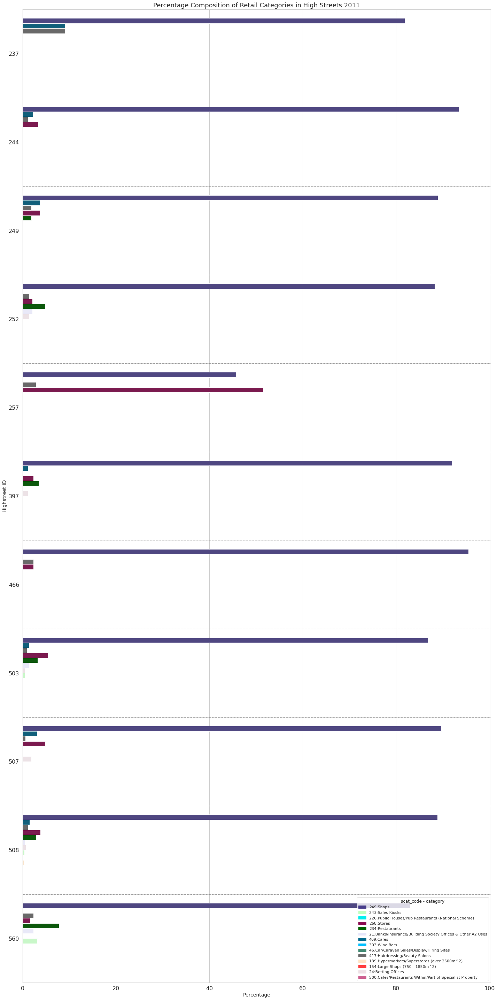

In [200]:
sns.set_style('whitegrid')
sns.set_context("notebook", rc={"axes.labelsize": 14, "axes.titlesize": 18, "xtick.labelsize": 16, "ytick.labelsize": 16})

fig,ax = plt.subplots(figsize=(20, 40))

# 2011
sns.barplot(x='percentage_11', y='highstreet_id', hue='scat_code', palette=custom_palette,
            data=composition11_21, orient='h', ax=ax)

ax.set_xlabel('Percentage')
ax.set_ylabel('Highstreet ID')
ax.set_title('Percentage Composition of Retail Categories in High Streets 2011')
ax.legend(handles=legend_handles_code, title='scat_code - category', loc='lower right')

# adjust distance 
plt.tight_layout()

# Adding separating lines
for y_coord in range(len(merged_hs['highstreet_id'])):
    ax.axhline(y=y_coord + 0.5, color='gray', linestyle='--', linewidth=0.8)

plt.show()

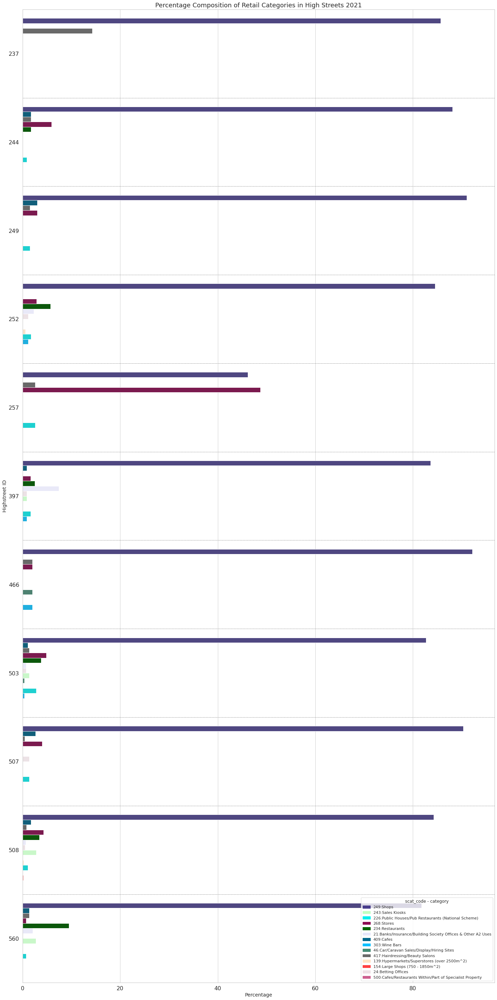

In [201]:
sns.set_style('whitegrid')
sns.set_context("notebook", rc={"axes.labelsize": 14, "axes.titlesize": 18, "xtick.labelsize": 16, "ytick.labelsize": 16})

fig,ax = plt.subplots(figsize=(20, 40))

    
# 2021
sns.barplot(x='percentage_21', y='highstreet_id', hue='scat_code', palette=custom_palette,
            data=composition11_21, orient='h', ax=ax)

ax.set_xlabel('Percentage')
ax.set_ylabel('Highstreet ID')
ax.set_title('Percentage Composition of Retail Categories in High Streets 2021')
ax.legend(handles=legend_handles_code, title='scat_code - category', loc='lower right')


# Adding separating lines
for y_coord in range(len(merged_hs['highstreet_id'])):
    ax.axhline(y=y_coord + 0.5, color='gray', linestyle='--', linewidth=0.8)
    
# adjust distance 
plt.tight_layout()


plt.show()

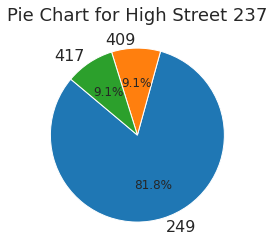

<Figure size 432x432 with 0 Axes>

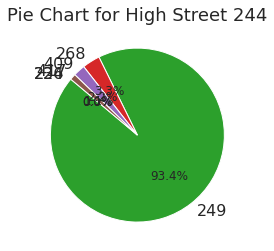

<Figure size 432x432 with 0 Axes>

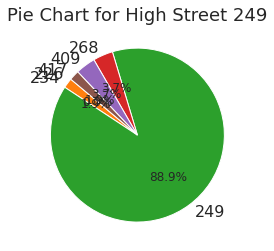

<Figure size 432x432 with 0 Axes>

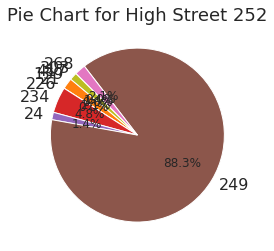

<Figure size 432x432 with 0 Axes>

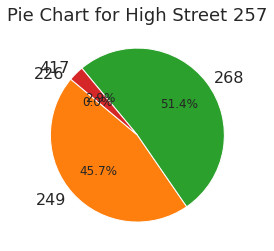

<Figure size 432x432 with 0 Axes>

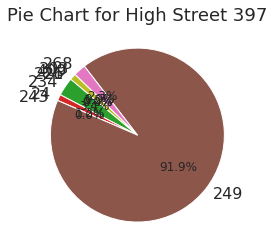

<Figure size 432x432 with 0 Axes>

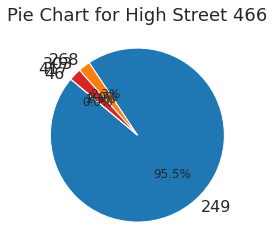

<Figure size 432x432 with 0 Axes>

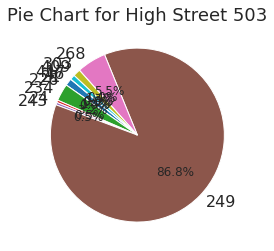

<Figure size 432x432 with 0 Axes>

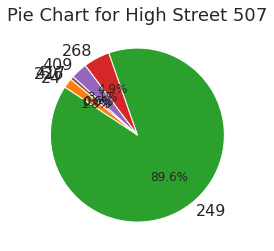

<Figure size 432x432 with 0 Axes>

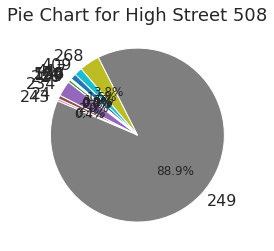

<Figure size 432x432 with 0 Axes>

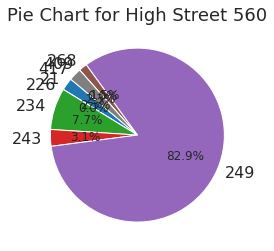

<Figure size 432x432 with 0 Axes>

In [202]:
grouped = composition11_21.groupby(['highstreet_id', 'scat_code']).sum().reset_index()
colors = [custom_palette[category] for category in grouped['scat_code']]

for item in grouped['highstreet_id'].unique():
    sub_df = grouped[grouped['highstreet_id'] == item]
    plt.pie(sub_df['percentage_11'], labels=sub_df['scat_code'], autopct='%1.1f%%', startangle=140)
    plt.title(f'Pie Chart for High Street {item}')
    plt.figure(figsize=(6, 6))
    plt.show()

In [203]:
composition = composition11_21.copy()
composition['percentage']=composition['percentage_21'] - composition['percentage_11']
composition.head(10)

,highstreet_id,scat_code,use_category,percentage_11,percentage_21,percentage
0,237,249,Shops,81.82,85.71,3.89
1,237,409,Cafes,9.09,0.00,-9.09
2,237,417,Hairdressing/Beauty Salons,9.09,14.29,5.20
3,244,249,Shops,93.41,88.14,-5.27
4,244,268,Stores,3.30,5.93,2.63
5,244,409,Cafes,2.20,1.69,-0.51
6,244,417,Hairdressing/Beauty Salons,1.10,1.69,0.59
7,249,234,Restaurants,1.85,0.00,-1.85
8,249,249,Shops,88.89,91.04,2.15
9,249,268,Stores,3.70,2.99,-0.71


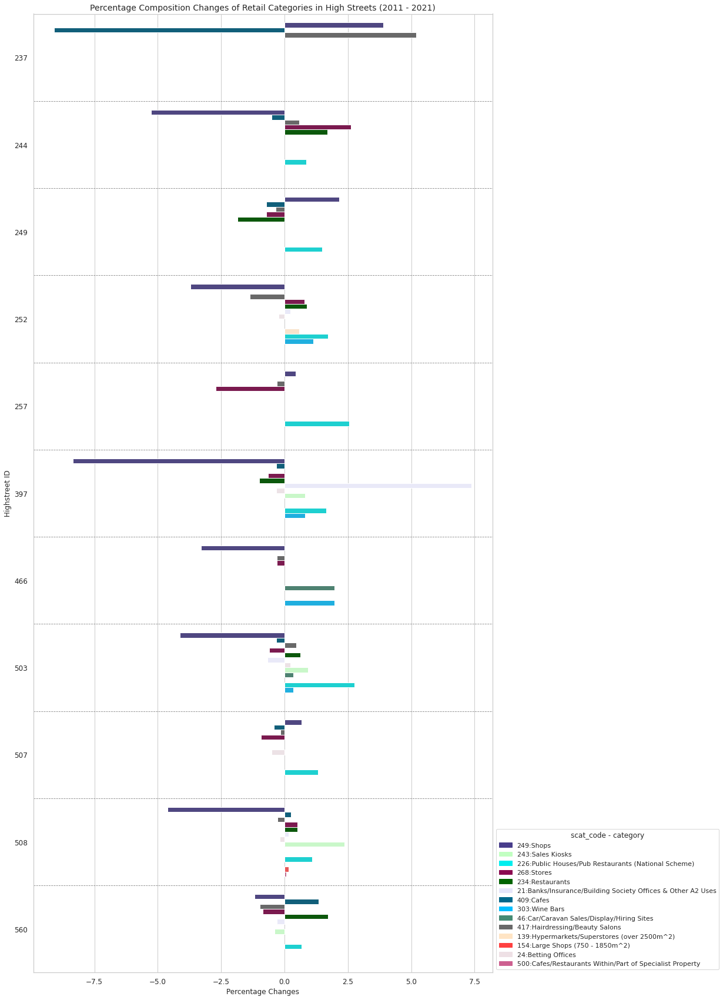

In [204]:
sns.set_style('whitegrid')
sns.set_context("notebook", rc={"axes.labelsize": 12, "axes.titlesize": 14, "xtick.labelsize": 12, "ytick.labelsize": 12})

fig, ax = plt.subplots(figsize=(14, 30))
sns.barplot(x='percentage', y='highstreet_id', hue='scat_code', palette=custom_palette,
            data=composition, orient='h', ax=ax)

ax.set_xlabel('Percentage Changes')
ax.set_ylabel('Highstreet ID')
ax.set_title('Percentage Composition Changes of Retail Categories in High Streets (2011 - 2021)')
ax.legend(handles=legend_handles_code, title='scat_code - category', loc='lower right', bbox_to_anchor=(1.5, 0))

# Adding separating lines
for y_coord in range(len(merged_hs['highstreet_id'])):
    ax.axhline(y=y_coord + 0.5, color='gray', linestyle='--', linewidth=0.8)

plt.show()

In [205]:
# Pivot the table
composition_changes = composition.pivot_table(index='highstreet_id', columns='scat_code', values='percentage', aggfunc='first')
# replace NaN with 0
composition_changes.fillna(0, inplace=True)

# Flatten the multi-level index of DataFrame 2
composition_changes.columns = composition_changes.columns.astype(str)
composition_changes.index = composition_changes.index.astype(str)
# Convert .columns from Index objects with names to plain Index objects
composition_changes.columns.name = None
composition_changes.columns = composition_changes.columns.tolist()
composition_changes.reset_index(inplace=True)

composition_changes

,highstreet_id,139,154,21,226,234,24,243,249,268,303,409,417,46,500
0,237,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.89,0.00,0.00,-9.09,5.20,0.00,0.00
1,244,0.00,0.00,0.00,0.85,1.69,0.00,0.00,-5.27,2.63,0.00,-0.51,0.59,0.00,0.00
2,249,0.00,0.00,0.00,1.49,-1.85,0.00,0.00,2.15,-0.71,0.00,-0.71,-0.36,0.00,0.00
3,252,0.57,0.00,0.22,1.71,0.88,-0.24,0.00,-3.71,0.79,1.14,0.00,-1.38,0.00,0.00
4,257,0.00,0.00,0.00,2.56,0.00,0.00,0.00,0.44,-2.71,0.00,0.00,-0.30,0.00,0.00
5,397,0.00,0.00,7.38,1.64,-0.99,-0.33,0.82,-8.34,-0.66,0.82,-0.33,0.00,0.00,0.00
6,466,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-3.29,-0.31,1.96,0.00,-0.31,1.96,0.00
7,503,0.00,0.00,-0.67,2.77,0.63,0.24,0.93,-4.12,-0.61,0.35,-0.32,0.47,0.35,0.00
8,507,0.00,0.00,0.00,1.32,0.00,-0.51,0.00,0.68,-0.92,0.00,-0.41,-0.17,0.00,0.00
9,508,0.02,0.15,0.15,1.09,0.52,-0.19,2.36,-4.62,0.50,0.00,0.25,-0.29,-0.03,0.07


##### merge composition and duration

In [206]:
composition_changes['highstreet_id'] = pd.to_numeric(composition_changes['highstreet_id'], errors='coerce')
composition_changes['highstreet_id'] = composition_changes['highstreet_id'].astype(object)

composition_changes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11 entries, 0 to 10
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   highstreet_id  11 non-null     object 
 1   139            11 non-null     float64
 2   154            11 non-null     float64
 3   21             11 non-null     float64
 4   226            11 non-null     float64
 5   234            11 non-null     float64
 6   24             11 non-null     float64
 7   243            11 non-null     float64
 8   249            11 non-null     float64
 9   268            11 non-null     float64
 10  303            11 non-null     float64
 11  409            11 non-null     float64
 12  417            11 non-null     float64
 13  46             11 non-null     float64
 14  500            11 non-null     float64
dtypes: float64(14), object(1)
memory usage: 1.4+ KB


In [207]:
are_equal = (composition_changes['highstreet_id'] == duration_changes['highstreet_id']).all()

# print
if are_equal:
    print("The A columns are equal.")
else:
    print("The A columns are not equal.")

The A columns are equal.


In [208]:
unique_values_composition = composition_changes['highstreet_id'].unique()
unique_values_duration = duration_changes['highstreet_id'].unique()

print("Unique values in composition_changes:", unique_values_composition)
print("Unique values in duration_changes:", unique_values_duration)


Unique values in composition_changes: [237 244 249 252 257 397 466 503 507 508 560]
Unique values in duration_changes: [237 244 249 252 257 397 466 503 507 508 560]


In [209]:
composition_duration = duration_changes.merge(composition_changes, on='highstreet_id', how='outer')

composition_duration

,highstreet_id,less_than_1year,1_to_3yrs,3_to_5yrs,5_to_10yrs,more_than_10yrs,139,154,21,226,234,24,243,249,268,303,409,417,46,500
0,237,-8,1,7,0,3,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.89,0.00,0.00,-9.09,5.20,0.00,0.00
1,244,-76,4,81,10,9,0.00,0.00,0.00,0.85,1.69,0.00,0.00,-5.27,2.63,0.00,-0.51,0.59,0.00,0.00
2,249,-44,8,36,6,7,0.00,0.00,0.00,1.49,-1.85,0.00,0.00,2.15,-0.71,0.00,-0.71,-0.36,0.00,0.00
3,252,-101,17,74,19,21,0.57,0.00,0.22,1.71,0.88,-0.24,0.00,-3.71,0.79,1.14,0.00,-1.38,0.00,0.00
4,257,-27,7,19,2,3,0.00,0.00,0.00,2.56,0.00,0.00,0.00,0.44,-2.71,0.00,0.00,-0.30,0.00,0.00
5,397,-65,12,69,13,6,0.00,0.00,7.38,1.64,-0.99,-0.33,0.82,-8.34,-0.66,0.82,-0.33,0.00,0.00,0.00
6,466,-40,5,37,5,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-3.29,-0.31,1.96,0.00,-0.31,1.96,0.00
7,503,-174,31,166,16,31,0.00,0.00,-0.67,2.77,0.63,0.24,0.93,-4.12,-0.61,0.35,-0.32,0.47,0.35,0.00
8,507,-128,13,151,13,14,0.00,0.00,0.00,1.32,0.00,-0.51,0.00,0.68,-0.92,0.00,-0.41,-0.17,0.00,0.00
9,508,-797,158,784,127,107,0.02,0.15,0.15,1.09,0.52,-0.19,2.36,-4.62,0.50,0.00,0.25,-0.29,-0.03,0.07


In [210]:
composition_duration.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11 entries, 0 to 10
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   highstreet_id    11 non-null     object 
 1   less_than_1year  11 non-null     int64  
 2   1_to_3yrs        11 non-null     int64  
 3   3_to_5yrs        11 non-null     int64  
 4   5_to_10yrs       11 non-null     int64  
 5   more_than_10yrs  11 non-null     int64  
 6   139              11 non-null     float64
 7   154              11 non-null     float64
 8   21               11 non-null     float64
 9   226              11 non-null     float64
 10  234              11 non-null     float64
 11  24               11 non-null     float64
 12  243              11 non-null     float64
 13  249              11 non-null     float64
 14  268              11 non-null     float64
 15  303              11 non-null     float64
 16  409              11 non-null     float64
 17  417              1

##### plot to check duration

In [211]:
category_counts11 = wf_hs_topretail11['duration_category'].value_counts()

print(category_counts11)

less_than_1year    1619
1_to_3yrs           139
more_than_10yrs     111
5_to_10yrs           77
3_to_5yrs            35
Name: duration_category, dtype: int64


In [212]:
category_counts21 = wf_hs_topretail21['duration_category'].value_counts()

print(category_counts21)

3_to_5yrs          1532
1_to_3yrs           396
more_than_10yrs     318
5_to_10yrs          301
less_than_1year      80
Name: duration_category, dtype: int64


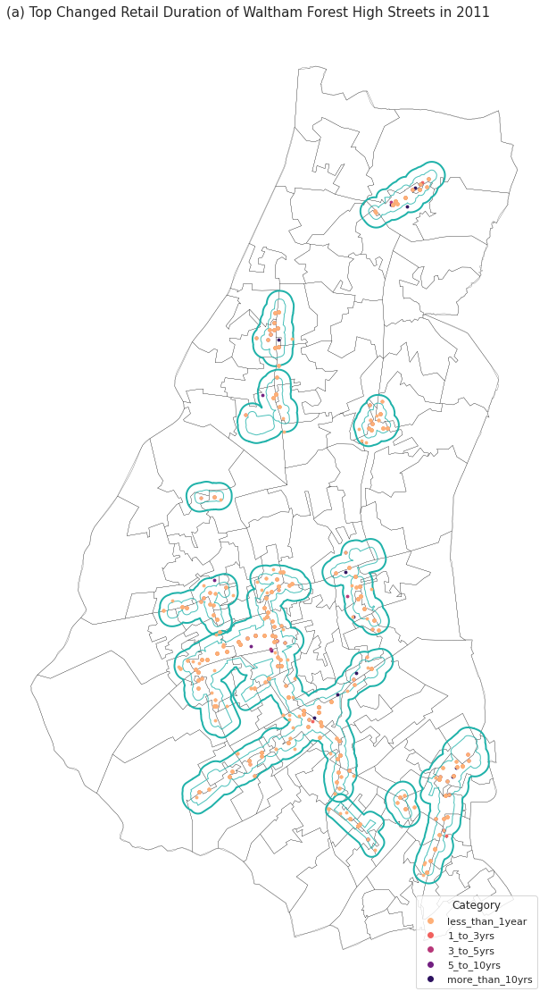

In [213]:
categories1 = set(category_counts11.index) | set(category_counts21.index)

# color and legend setting
color_palette = sns.color_palette(palette='magma', n_colors=5)
color_mapping = {'less_than_1year': color_palette[4], '1_to_3yrs': color_palette[3], '3_to_5yrs': color_palette[2], 
                 '5_to_10yrs': color_palette[1], 'more_than_10yrs': color_palette[0]}

#legend_labels = list(color_mapping.keys())
legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=8, label=label) for label, color in color_mapping.items()]


# plot and check - 2011
fig, ax = plt.subplots(figsize=(20,20))

wf_borough.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.2)
wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.2)

merged_hs.plot(ax=ax, linewidth=1, edgecolor='lightseagreen', facecolor = 'none', alpha=0.8)

wf_highstreet_buffered.plot(ax=ax, linewidth=2, edgecolor='lightseagreen', facecolor = 'none')

for category in categories1:
    color =color_mapping.get(category, 'gray') # default as gray 
    wf_hs_topretail11[wf_hs_topretail11['duration_category'] == category].plot(ax=ax, color=color, markersize=8, label=category)

plt.title('(a) Top Changed Retail Duration of Waltham Forest High Streets in 2011', loc='left', fontsize=15)

# add legend
ax.legend(title='Category', loc='lower right', handles=legend_handles, bbox_to_anchor=(1, 0))
ax.axis('off') # turn off axis
ax.set_xticks([])
ax.set_yticks([])
plt.show()

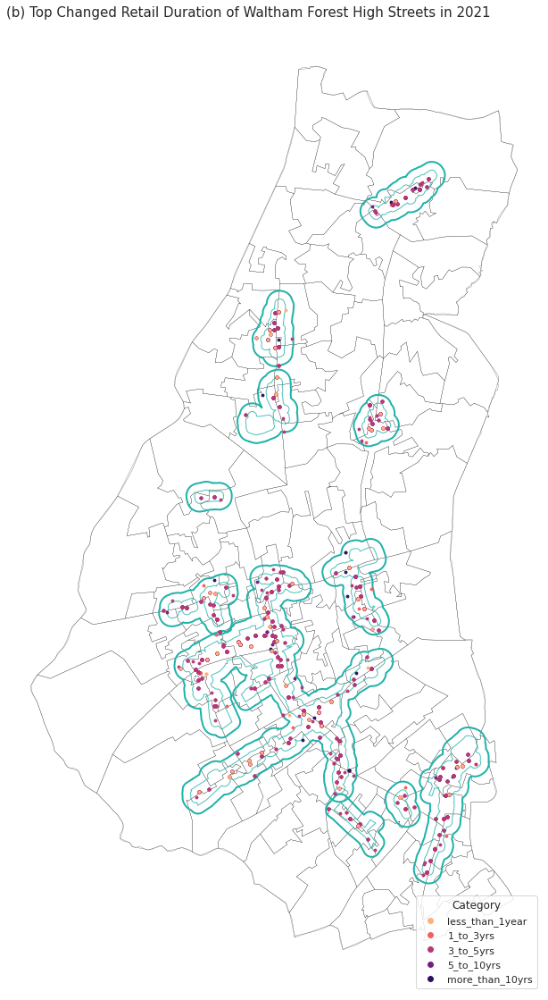

In [214]:
# plot and check - 2021
fig, ax = plt.subplots(figsize=(20,20))

wf_borough.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.2)
wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.2)

merged_hs.plot(ax=ax, linewidth=1, edgecolor='lightseagreen', facecolor = 'none', alpha=0.8)

wf_highstreet_buffered.plot(ax=ax, linewidth=2, edgecolor='lightseagreen', facecolor = 'none')

for category in categories1:
    color =color_mapping.get(category, 'gray') # default as gray 
    wf_hs_topretail21[wf_hs_topretail21['duration_category'] == category].plot(ax=ax, color=color, markersize=8, label=category)

plt.title('(b) Top Changed Retail Duration of Waltham Forest High Streets in 2021', loc='left', fontsize=15)

# add legend
ax.legend(title='Category', loc='lower right', handles=legend_handles, bbox_to_anchor=(1, 0))

ax.axis('off') # turn off axis
ax.set_xticks([])
ax.set_yticks([])

plt.show()

#### 4) Get all LSOAs influenced by the high streets

wf_highstreet_buffered

In [215]:
# Filter out the intersecting LSOAs with high streets
radiated_lsoa = gpd.sjoin(wf_lsoa, wf_highstreet_buffered, how="inner", predicate='intersects')

radiated_lsoa.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 121 entries, 4540 to 4665
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   LSOA21CD              121 non-null    object  
 1   LSOA21NM              121 non-null    object  
 2   local authority name  121 non-null    object  
 3   local authority code  121 non-null    object  
 4   deprivation           121 non-null    float64 
 5   professions           121 non-null    float64 
 6   youth                 121 non-null    float64 
 7   working_age           121 non-null    float64 
 8   seniors               121 non-null    float64 
 9   houseprice            121 non-null    float64 
 10  geometry              121 non-null    geometry
 11  index_right           121 non-null    int64   
 12  index                 121 non-null    int64   
 13  highstreet_id         121 non-null    int64   
 14  highstreet_name       121 non-null    object  

In [216]:
# drop index_right
radiated_lsoa = radiated_lsoa.drop(columns=['index_right'])
radiated_lsoa.head()

,LSOA21CD,LSOA21NM,local authority name,local authority code,deprivation,professions,youth,working_age,seniors,houseprice,geometry,index,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD
4540,E01004328,Waltham Forest 028B,Waltham Forest,E09000031,-8.61,9.36,1.62,-3.20,1.58,140.06,"POLYGON ((539425.622 186339.169, 539416.149 18...",515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031
4542,E01004330,Waltham Forest 028D,Waltham Forest,E09000031,-10.96,16.07,-1.34,-1.42,2.76,147.22,"POLYGON ((539455.978 186230.423, 539496.056 18...",515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031
4545,E01004333,Waltham Forest 024A,Waltham Forest,E09000031,-5.78,2.75,-0.73,-0.52,1.25,124.00,"POLYGON ((539712.298 186839.140, 539715.176 18...",515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031
4546,E01004334,Waltham Forest 024B,Waltham Forest,E09000031,-7.53,0.67,-3.30,5.35,-2.05,83.08,"POLYGON ((539356.338 186727.361, 539432.599 18...",515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031
4551,E01004339,Waltham Forest 027D,Waltham Forest,E09000031,-16.39,15.31,-1.05,-0.64,1.70,98.23,"POLYGON ((539356.338 186727.361, 539337.348 18...",515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031


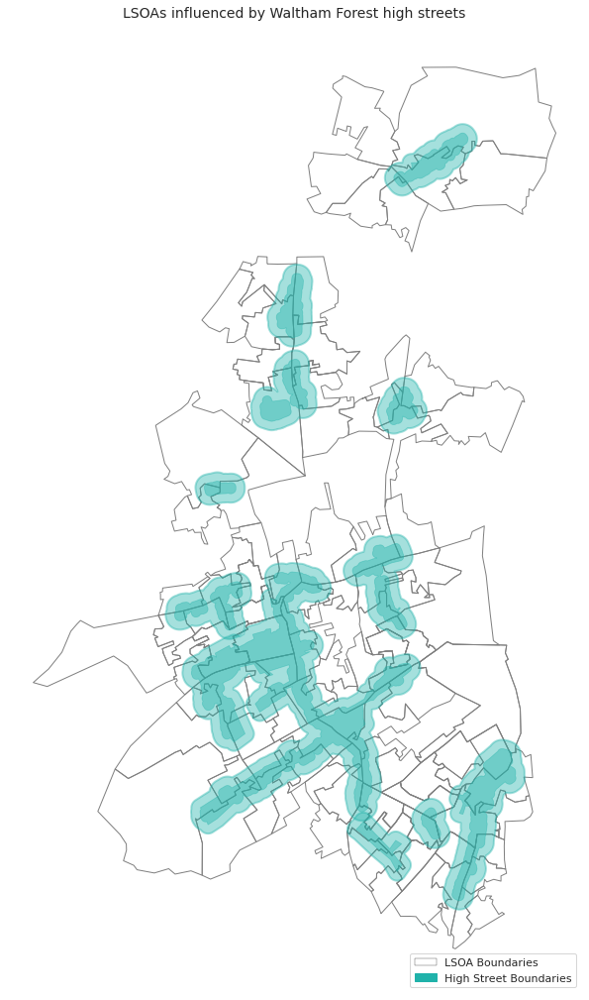

In [217]:
# plot to check
fig, ax = plt.subplots(figsize=(18,18))

radiated_lsoa.plot(ax=ax, facecolor='none', edgecolor='grey', linewidth=1)

merged_hs.plot(ax=ax, linewidth=0.8, facecolor='lightseagreen', edgecolor = 'lightseagreen', alpha=0.4)

wf_highstreet_buffered.plot(ax=ax, linewidth=2, facecolor='lightseagreen', edgecolor = 'lightseagreen', alpha=0.4)

plt.title('LSOAs influenced by Waltham Forest high streets')

# add legend
ax.legend(handles=[lsoa_patch, highstreet_line1], loc='lower right', bbox_to_anchor=(1, 0))

ax.axis('off') # turn off axis
ax.set_xticks([])
ax.set_yticks([])

plt.show()

In [218]:
# get the dataframe with High Streets information and their radiated LSOAs information
result_df3 = radiated_lsoa[['highstreet_id', 'LSOA21CD']]

wf_highstreet_new = result_df3.merge(merged_hs, on='highstreet_id', how='outer')

wf_highstreet_lsoa = wf_highstreet_new.merge(radiated_lsoa, on='LSOA21CD', how='outer', suffixes=('', '*'))
wf_highstreet_lsoa = wf_highstreet_lsoa.filter(regex='^[^*]*$')

# change column order
wf_highstreet_lsoa.insert(16, 'geometry', wf_highstreet_lsoa.pop('geometry'))

wf_highstreet_lsoa.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 159 entries, 0 to 158
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   highstreet_id         159 non-null    int64   
 1   LSOA21CD              159 non-null    object  
 2   index                 159 non-null    int64   
 3   highstreet_name       159 non-null    object  
 4   area_ha               159 non-null    float64 
 5   gdb_geomattr_data     0 non-null      object  
 6   BoroughNM             159 non-null    object  
 7   LAD11CD               159 non-null    object  
 8   LSOA21NM              159 non-null    object  
 9   local authority name  159 non-null    object  
 10  local authority code  159 non-null    object  
 11  deprivation           159 non-null    float64 
 12  professions           159 non-null    float64 
 13  youth                 159 non-null    float64 
 14  working_age           159 non-null    float64 
 15  senior

In [219]:
wf_highstreet_lsoa.sample(5)

,highstreet_id,LSOA21CD,index,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,LSOA21NM,local authority name,local authority code,deprivation,professions,youth,working_age,seniors,geometry,houseprice
54,466,E01004370,474,"Francis Road, Leyton",6.813432,None,Waltham Forest,E09000031,Waltham Forest 023B,Waltham Forest,E09000031,-19.72,17.87,-1.19,3.19,-1.99,"POLYGON ((538057.472 187025.286, 538112.679 18...",100.54
65,244,E01004397,250,"Forest Road (Pembar Avenue), Blackhorse Road",5.781402,None,Waltham Forest,E09000031,Waltham Forest 017C,Waltham Forest,E09000031,-13.68,10.32,-1.18,-0.73,1.91,"MULTIPOLYGON (((536388.069 189529.767, 536387....",93.26
43,508,E01004363,520,"High Street/Hoe Street, Walthamstow",95.428617,None,Waltham Forest,E09000031,Waltham Forest 019A,Waltham Forest,E09000031,-10.47,13.53,3.94,-5.03,1.09,"POLYGON ((537813.332 188310.594, 537812.973 18...",165.16
46,508,E01004367,520,"High Street/Hoe Street, Walthamstow",95.428617,None,Waltham Forest,E09000031,Waltham Forest 019D,Waltham Forest,E09000031,-8.63,9.97,-0.67,1.21,-0.53,"POLYGON ((537813.332 188310.594, 537812.973 18...",126.18
59,244,E01004392,250,"Forest Road (Pembar Avenue), Blackhorse Road",5.781402,None,Waltham Forest,E09000031,Waltham Forest 017A,Waltham Forest,E09000031,-12.05,8.87,1.45,-1.86,0.42,"MULTIPOLYGON (((536388.069 189529.767, 536387....",112.15


##### Calculate the averages of LSOA variables for each high street

In [220]:
columns_to_average = wf_highstreet_lsoa.columns[10:]

averaged_wf_highstreet_lsoa = wf_highstreet_lsoa.groupby('highstreet_id')[columns_to_average].mean().round(2).reset_index()

averaged_wf_highstreet_lsoa = pd.merge(merged_hs, averaged_wf_highstreet_lsoa, on='highstreet_id', how='left', suffixes=('', '*'))
averaged_wf_highstreet_lsoa = averaged_wf_highstreet_lsoa.filter(regex='^[^*]*$')
averaged_wf_highstreet_lsoa

,index,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,geometry,deprivation,professions,youth,working_age,seniors,houseprice
0,242,237,"Billet Road, Walthamstow.",4.395863,None,Waltham Forest,E09000031,"POLYGON ((536538.954 190900.525, 536542.912 19...",-12.42,14.03,-2.10,2.33,-0.22,121.63
1,250,244,"Forest Road (Pembar Avenue), Blackhorse Road",5.781402,None,Waltham Forest,E09000031,"MULTIPOLYGON (((536388.069 189529.767, 536387....",-12.33,12.61,-0.69,0.15,0.54,120.15
2,255,249,"Burnside Avenue, Walthamstow.",7.221877,None,Waltham Forest,E09000031,"MULTIPOLYGON (((537130.364 191807.225, 537155....",-11.84,8.89,1.37,-0.54,-0.83,100.09
3,258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,"POLYGON ((537451.583 192633.269, 537451.715 19...",-9.46,7.38,0.49,0.46,-0.94,94.85
4,263,257,"Grove Green Road, Leytonstone.",4.605851,None,Waltham Forest,E09000031,"POLYGON ((538947.848 186917.325, 538938.094 18...",-12.20,10.53,-0.56,-0.97,1.54,108.07
5,403,397,"The Avenue, Highams Park.",9.215191,None,Waltham Forest,E09000031,"POLYGON ((538679.256 191889.252, 538684.327 19...",-7.74,8.17,0.13,0.56,-0.69,114.33
6,474,466,"Francis Road, Leyton",6.813432,None,Waltham Forest,E09000031,"POLYGON ((538057.472 187025.286, 538112.679 18...",-12.90,13.98,-1.40,0.84,0.56,131.26
7,515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,"POLYGON ((539839.361 187616.515, 539842.206 18...",-10.50,8.35,-0.39,-1.76,2.15,109.93
8,519,507,"Wood Street, Wood Street.",21.766876,None,Waltham Forest,E09000031,"POLYGON ((538548.242 190188.508, 538559.398 19...",-11.05,11.75,-1.85,2.32,-0.47,129.16
9,520,508,"High Street/Hoe Street, Walthamstow",95.428617,None,Waltham Forest,E09000031,"POLYGON ((537813.332 188310.594, 537812.973 18...",-11.52,12.43,-1.37,1.12,0.25,131.12


### 3.6 Merge LSOA and open local data (composition) according to the id of highstreets

In [221]:
wf_hs_lsoa_retail = averaged_wf_highstreet_lsoa.merge(composition_changes, on = 'highstreet_id', how='outer')

# create a column for category counts
# wf_hs_lsoa_retail['num_categories'] = wf_hs_lsoa_retail.iloc[:, 14:].apply(lambda row: (row != 0).sum(), axis=1)

wf_hs_lsoa_retail

,index,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,geometry,deprivation,professions,...,234,24,243,249,268,303,409,417,46,500
0,242,237,"Billet Road, Walthamstow.",4.395863,None,Waltham Forest,E09000031,"POLYGON ((536538.954 190900.525, 536542.912 19...",-12.42,14.03,...,0.00,0.00,0.00,3.89,0.00,0.00,-9.09,5.20,0.00,0.00
1,250,244,"Forest Road (Pembar Avenue), Blackhorse Road",5.781402,None,Waltham Forest,E09000031,"MULTIPOLYGON (((536388.069 189529.767, 536387....",-12.33,12.61,...,1.69,0.00,0.00,-5.27,2.63,0.00,-0.51,0.59,0.00,0.00
2,255,249,"Burnside Avenue, Walthamstow.",7.221877,None,Waltham Forest,E09000031,"MULTIPOLYGON (((537130.364 191807.225, 537155....",-11.84,8.89,...,-1.85,0.00,0.00,2.15,-0.71,0.00,-0.71,-0.36,0.00,0.00
3,258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,"POLYGON ((537451.583 192633.269, 537451.715 19...",-9.46,7.38,...,0.88,-0.24,0.00,-3.71,0.79,1.14,0.00,-1.38,0.00,0.00
4,263,257,"Grove Green Road, Leytonstone.",4.605851,None,Waltham Forest,E09000031,"POLYGON ((538947.848 186917.325, 538938.094 18...",-12.20,10.53,...,0.00,0.00,0.00,0.44,-2.71,0.00,0.00,-0.30,0.00,0.00
5,403,397,"The Avenue, Highams Park.",9.215191,None,Waltham Forest,E09000031,"POLYGON ((538679.256 191889.252, 538684.327 19...",-7.74,8.17,...,-0.99,-0.33,0.82,-8.34,-0.66,0.82,-0.33,0.00,0.00,0.00
6,474,466,"Francis Road, Leyton",6.813432,None,Waltham Forest,E09000031,"POLYGON ((538057.472 187025.286, 538112.679 18...",-12.90,13.98,...,0.00,0.00,0.00,-3.29,-0.31,1.96,0.00,-0.31,1.96,0.00
7,515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,"POLYGON ((539839.361 187616.515, 539842.206 18...",-10.50,8.35,...,0.63,0.24,0.93,-4.12,-0.61,0.35,-0.32,0.47,0.35,0.00
8,519,507,"Wood Street, Wood Street.",21.766876,None,Waltham Forest,E09000031,"POLYGON ((538548.242 190188.508, 538559.398 19...",-11.05,11.75,...,0.00,-0.51,0.00,0.68,-0.92,0.00,-0.41,-0.17,0.00,0.00
9,520,508,"High Street/Hoe Street, Walthamstow",95.428617,None,Waltham Forest,E09000031,"POLYGON ((537813.332 188310.594, 537812.973 18...",-11.52,12.43,...,0.52,-0.19,2.36,-4.62,0.50,0.00,0.25,-0.29,-0.03,0.07


In [222]:
csv_file_path = os.path.join('Data', "wf_hs_lsoa_retail.csv")
wf_hs_lsoa_retail.to_csv(csv_file_path, index=False)
print(f"DataFrame saved in {csv_file_path}")


DataFrame saved in Data/wf_hs_lsoa_retail.csv


In [223]:
wf_hs_lsoa_retail.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 11 entries, 0 to 10
Data columns (total 28 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   index              11 non-null     int64   
 1   highstreet_id      11 non-null     object  
 2   highstreet_name    11 non-null     object  
 3   area_ha            11 non-null     float64 
 4   gdb_geomattr_data  0 non-null      object  
 5   BoroughNM          11 non-null     object  
 6   LAD11CD            11 non-null     object  
 7   geometry           11 non-null     geometry
 8   deprivation        11 non-null     float64 
 9   professions        11 non-null     float64 
 10  youth              11 non-null     float64 
 11  working_age        11 non-null     float64 
 12  seniors            11 non-null     float64 
 13  houseprice         11 non-null     float64 
 14  139                11 non-null     float64 
 15  154                11 non-null     float64 
 16  21

## 4. Analysis

In [224]:
df_num = wf_hs_lsoa_retail.iloc[:, 8:]

df_num

,deprivation,professions,youth,working_age,seniors,houseprice,139,154,21,226,234,24,243,249,268,303,409,417,46,500
0,-12.42,14.03,-2.10,2.33,-0.22,121.63,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.89,0.00,0.00,-9.09,5.20,0.00,0.00
1,-12.33,12.61,-0.69,0.15,0.54,120.15,0.00,0.00,0.00,0.85,1.69,0.00,0.00,-5.27,2.63,0.00,-0.51,0.59,0.00,0.00
2,-11.84,8.89,1.37,-0.54,-0.83,100.09,0.00,0.00,0.00,1.49,-1.85,0.00,0.00,2.15,-0.71,0.00,-0.71,-0.36,0.00,0.00
3,-9.46,7.38,0.49,0.46,-0.94,94.85,0.57,0.00,0.22,1.71,0.88,-0.24,0.00,-3.71,0.79,1.14,0.00,-1.38,0.00,0.00
4,-12.20,10.53,-0.56,-0.97,1.54,108.07,0.00,0.00,0.00,2.56,0.00,0.00,0.00,0.44,-2.71,0.00,0.00,-0.30,0.00,0.00
5,-7.74,8.17,0.13,0.56,-0.69,114.33,0.00,0.00,7.38,1.64,-0.99,-0.33,0.82,-8.34,-0.66,0.82,-0.33,0.00,0.00,0.00
6,-12.90,13.98,-1.40,0.84,0.56,131.26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-3.29,-0.31,1.96,0.00,-0.31,1.96,0.00
7,-10.50,8.35,-0.39,-1.76,2.15,109.93,0.00,0.00,-0.67,2.77,0.63,0.24,0.93,-4.12,-0.61,0.35,-0.32,0.47,0.35,0.00
8,-11.05,11.75,-1.85,2.32,-0.47,129.16,0.00,0.00,0.00,1.32,0.00,-0.51,0.00,0.68,-0.92,0.00,-0.41,-0.17,0.00,0.00
9,-11.52,12.43,-1.37,1.12,0.25,131.12,0.02,0.15,0.15,1.09,0.52,-0.19,2.36,-4.62,0.50,0.00,0.25,-0.29,-0.03,0.07


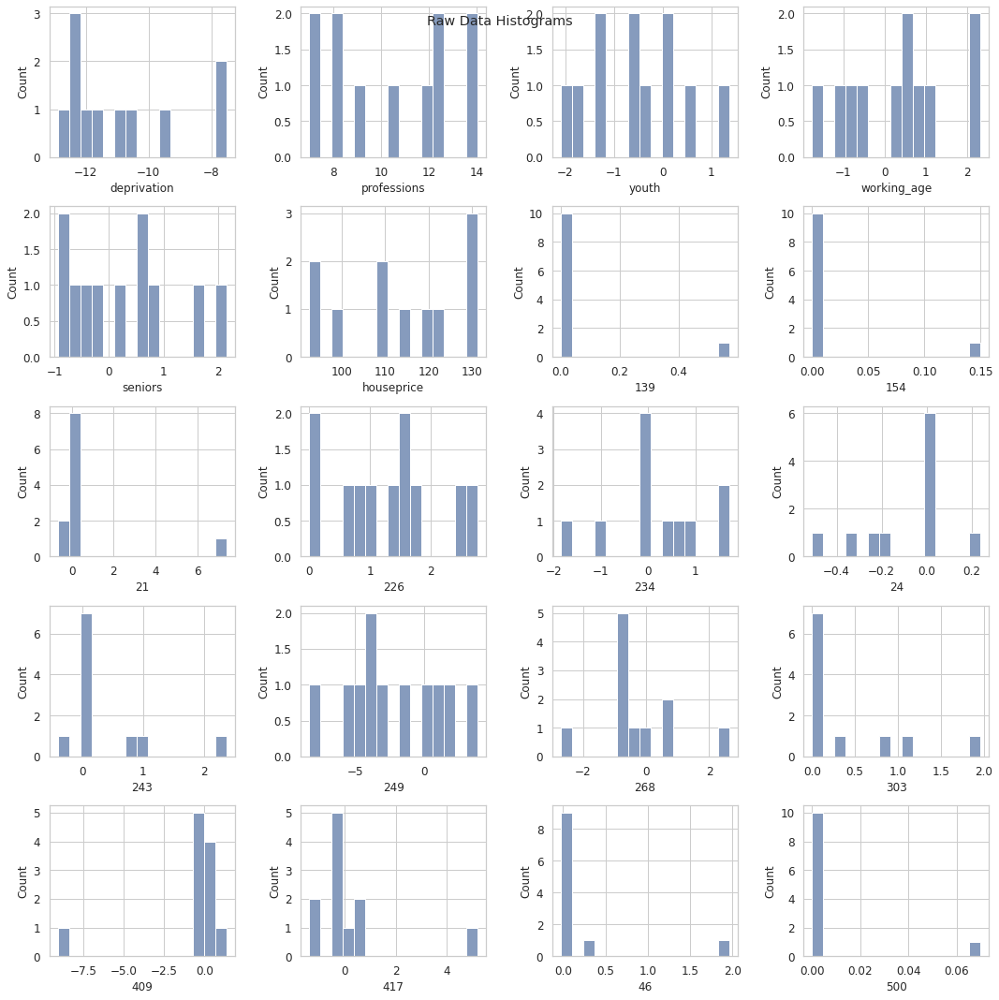

In [225]:
import matplotlib.pyplot as plt

# Calculate the number of rows and columns for subplots
num_cols = df_num.shape[1]
num_rows = (num_cols + 3) // 4  # Divide and round up

# Create subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(15, 3 * num_rows))
axs = axs.ravel()  # Flatten the 2D array of axes

for i, col in enumerate(df_num.columns):
    axs[i].hist(df_num[col], bins=15, color="#869bbd")
    axs[i].set_xlabel(col)
    axs[i].set_ylabel("Count")

# Adjust layout and spacing
plt.tight_layout()

# Add a title
plt.suptitle("Raw Data Histograms")
plt.show()


In [226]:
# plt.suptitle(f"Figure 4 - Raw Data Histograms", x=0.025, size=18, **tfont)

### 4.1 Standardisation

`StandardScaler` (z-score) is more suitable for cases where the data is approximately normally distributed

while `RobustScaler` is suitable for cases where the data contains **outliers or does not conform to the normal distribution**

In [227]:
# Using the `RobustScaler` class from the `sklearn` package for standardising the dataset

rs = RobustScaler(quantile_range=(10.0, 90.0))

Standardised = df_num.copy()
for r in df_num.columns.values:
    Standardised[r] = rs.fit_transform(df_num[r].values.reshape(-1,1))
    print("The range of {} is [{:.2f}, {:.2f}], and the standard deviation is {:.2f}".format(r, Standardised[r].min(), Standardised[r].max(), Standardised[r].std()))
Standardised.head()

The range of deprivation is [-0.29, 0.85], and the standard deviation is 0.40
The range of professions is [-0.53, 0.53], and the standard deviation is 0.40
The range of youth is [-0.66, 0.82], and the standard deviation is 0.45
The range of working_age is [-0.67, 0.57], and the standard deviation is 0.40
The range of seniors is [-0.50, 0.80], and the standard deviation is 0.42
The range of houseprice is [-0.60, 0.47], and the standard deviation is 0.39
The range of 139 is [0.00, 28.50], and the standard deviation is 8.57
The range of 154 is [0.00, 0.15], and the standard deviation is 0.05
The range of 21 is [-1.29, 14.19], and the standard deviation is 4.34
The range of 226 is [-0.52, 0.57], and the standard deviation is 0.35
The range of 234 is [-0.69, 0.64], and the standard deviation is 0.39
The range of 24 is [-1.55, 0.73], and the standard deviation is 0.62
The range of 243 is [-0.43, 2.54], and the standard deviation is 0.83
The range of 249 is [-0.68, 0.97], and the standard dev

,deprivation,professions,youth,working_age,seniors,houseprice,139,154,21,226,234,24,243,249,268,303,409,417,46,500
0,-0.192308,0.530303,-0.658120,0.568389,-0.198312,0.201268,0.0,0.0,0.000000,-0.515625,0.000000,0.000000,0.0,0.967655,0.356725,0.0,-9.135417,3.496815,0.0,0.0
1,-0.173077,0.315152,-0.055556,-0.094225,0.122363,0.160463,0.0,0.0,0.000000,-0.183594,0.630597,0.000000,0.0,-0.266846,1.894737,0.0,-0.197917,0.560510,0.0,0.0
2,-0.068376,-0.248485,0.824786,-0.303951,-0.455696,-0.392611,0.0,0.0,0.000000,0.066406,-0.690299,0.000000,0.0,0.733154,-0.058480,0.0,-0.406250,-0.044586,0.0,0.0
3,0.440171,-0.477273,0.448718,0.000000,-0.502110,-0.537083,28.5,0.0,0.423077,0.152344,0.328358,-0.727273,0.0,-0.056604,0.818713,1.0,0.333333,-0.694268,0.0,0.0
4,-0.145299,0.000000,0.000000,-0.434650,0.544304,-0.172594,0.0,0.0,0.000000,0.484375,0.000000,0.000000,0.0,0.502695,-1.228070,0.0,0.333333,-0.006369,0.0,0.0


Text(0.5, 1.0, 'Scatter Plot: Betting Offices(24) ~ Bank Offices(21) (Standardised)')

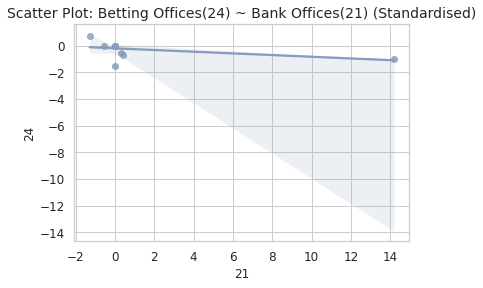

In [228]:
sns.regplot(x="21", y="24", data=Standardised, color='#869bbd')
plt.title('Scatter Plot: Betting Offices(24) ~ Bank Offices(21) (Standardised)')

### 4.2 Clustering Analysis

Due to the limitation of sample size, we choose K-means for cluster analysis.

In [229]:
# Function1: Radar plots of the cluster centroids
def radar_plot_centroids(df_cluster_centroid):
    """
    To visually represent one or more groups of values over multiple variables.
    
    Parameters
    ----------
    df_cluster_centroid: a dataframe with rows representing a cluster centroid and columns representing variables
    
    """
    
    # Add an additional element to categories that’s identical to the first item
    # Manually 'close' the line
    categories = df_cluster_centroid.columns.values.tolist()
    categories = [*categories, categories[0]]
    
    label_loc = np.linspace(start=0, stop=2 * np.pi, num=len(categories))
    
    plt.figure(figsize=(6, 6))
    plt.subplot(polar=True)
    for index, row in df_cluster_centroid.iterrows():
        centroid = row.tolist()
        centroid = [*centroid, centroid[0]]
        label = "Cluster {}".format(index)
        plt.plot(label_loc, centroid, label=label)
    lines, labels = plt.thetagrids(np.degrees(label_loc), labels=categories)
    plt.legend()
    plt.show()    

#### K-Means

##### Elbow, Silhouette Score

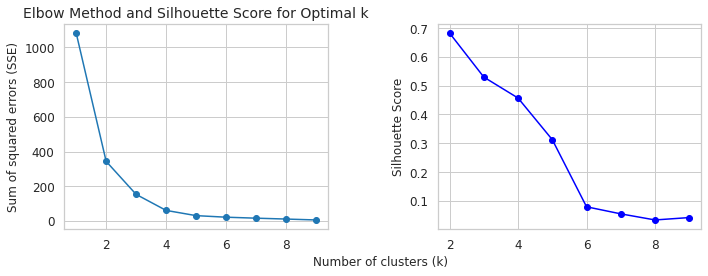

In [230]:
# 1. plot the variation curve of Sum of Squared Errors (SSE) using the Elbow method to find the k corresponding to the inflection point;

# 2. check the silhouette score for different k values to confirm the most appropriate number of clusters.


# Setting the range of k
k_range1 = range(1, 10) 

# 1. Elbow method SSE ~ K
# initialise SSE list
SSE = []
# calculate the K-means model for each K value and calculate the SSE
for k in k_range1:
    km = KMeans(n_clusters=k, random_state=0)
    km.fit(Standardised)
    SSE.append(km.inertia_)

# 2. Silhoutte score SS ~ K
k_range2 = range(2, 10) # sihoutte score start from 2
Silhouette_scores = []
for k in k_range2:
    n_clusters = k
    clusterer = sklc.KMeans(n_clusters=n_clusters, random_state=0).fit(Standardised)
    cluster_labels = clusterer.labels_
    silhouette_avg = sklm.silhouette_score(Standardised, cluster_labels)
    Silhouette_scores.append(silhouette_avg)

    
# Plotting
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4))

# 1.elbow
ax1.plot(k_range1, SSE, marker='o')
ax1.set_xlabel('Number of clusters (k)', x=1.2)
ax1.set_ylabel('Sum of squared errors (SSE)')
ax1.set_title('Elbow Method and Silhouette Score for Optimal k')

# 2. silhoutte
ax2.plot(k_range2, Silhouette_scores, 'bo-', label='Silhouette Score')
ax2.set_ylabel('Silhouette Score')

plt.tight_layout()
plt.show()

number of cluster: choose 3 or 4 based on Elbow Method and Silhouette Score

## 5. Result Visualisation

#### 5.1 Clustered High Streets and Centroid Comparison

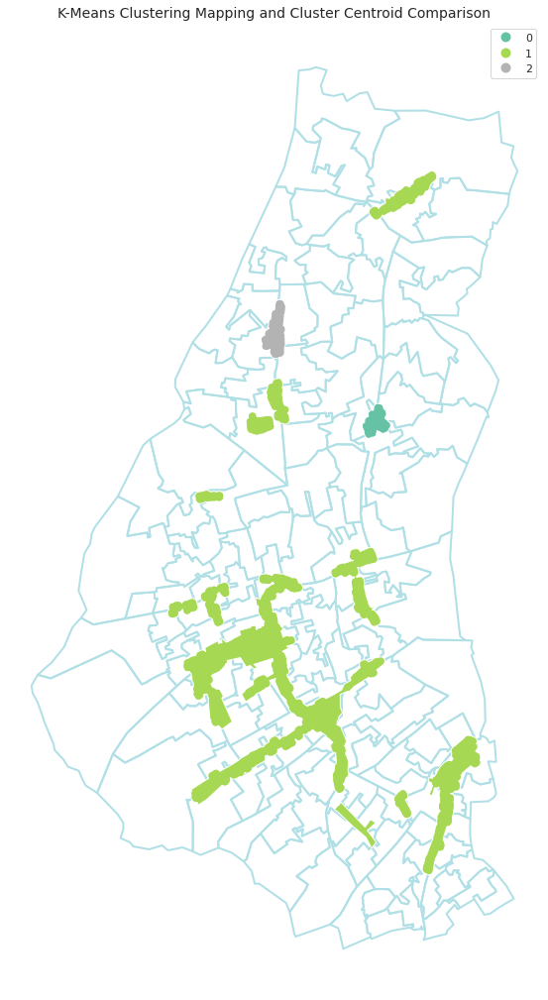

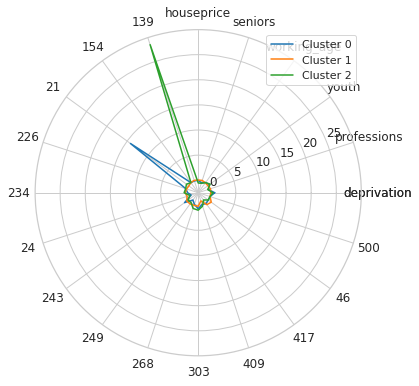

In [231]:
df_geo = wf_hs_lsoa_retail.copy()

def mapping(num_of_cluster):
    fig, ax = plt.subplots(figsize=(18,18))
    df_geo['cluster_nm'] = num_of_cluster
    wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='powderblue', linewidth=2)
    df_geo.plot(ax = ax, column='cluster_nm', categorical=True, legend=True, cmap='Set2')
    ax.axis('off') # turn off axis
    ax.set_xticks([])
    ax.set_yticks([])
    plt.title('K-Means Clustering Mapping and Cluster Centroid Comparison')
    
    
k_cluster = 3
random_seed = 1
kmeans = KMeans(n_clusters=k_cluster,random_state=random_seed)
kmeans.fit(Standardised)

# plotting
mapping(kmeans.labels_)

df_cluster_centroid = pd.DataFrame(kmeans.cluster_centers_, columns=Standardised.columns)
radar_plot_centroids(df_cluster_centroid)

In [232]:
# Function 3: Seperated Radar Plots
def seprated_radar_plot_centroids(df_cluster_centroids):
    """
    To visually represent one or more groups of values over multiple variables.
    
    Parameters
    ----------
    df_cluster_centroids: a dataframe with rows representing cluster centroids and columns representing variables
    
    """
    
    # Add an additional element to categories that’s identical to the first item
    # Manually 'close' the line
    categories = df_cluster_centroids.columns.values.tolist()
    categories = [*categories, categories[0]]
    
    label_loc = np.linspace(start=0, stop=2 * np.pi, num=len(categories))
    
    for index, row in df_cluster_centroids.iterrows():
        plt.figure(figsize=(8, 8))
        plt.subplot(polar=True)
        
        centroid = row.tolist()
        centroid = [*centroid, centroid[0]]
        label = "Cluster {}".format(index)
        plt.plot(label_loc, centroid, label=label)
        
        lines, labels = plt.thetagrids(np.degrees(label_loc), labels=categories)
        
        #plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.title(label)
        plt.show()

In [233]:
df_cluster_centroid

,deprivation,professions,youth,working_age,seniors,houseprice,139,154,21,226,234,24,243,249,268,303,409,417,46,500
0,0.807692,-0.357576,0.294872,0.030395,-0.396624,0.000000,0.000000,0.000000,14.192308,0.125000,-0.369403,-1.000000,0.881720,-0.680593,-0.029240,0.719298,-0.010417,0.184713,0.00000,0.000000
1,0.033238,0.080808,-0.087844,-0.052009,0.096109,0.045921,0.111111,0.016667,-0.175214,-0.048611,0.111940,-0.154882,0.345281,0.273735,0.161793,0.225146,-0.759259,0.457183,0.72381,0.007778
2,0.440171,-0.477273,0.448718,0.000000,-0.502110,-0.537083,28.500000,0.000000,0.423077,0.152344,0.328358,-0.727273,0.000000,-0.056604,0.818713,1.000000,0.333333,-0.694268,0.00000,0.000000


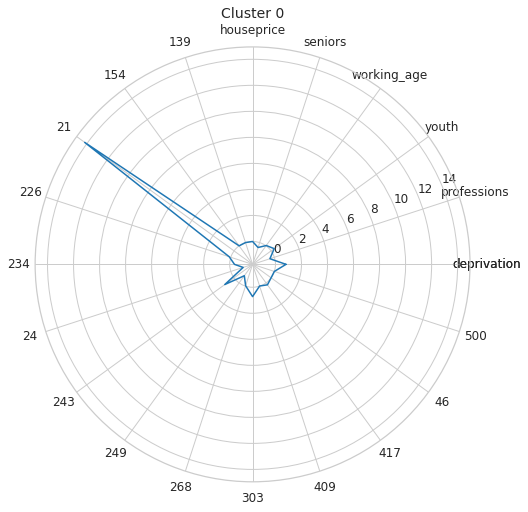

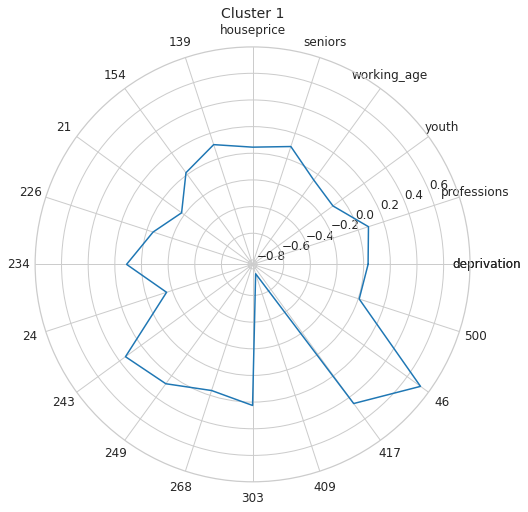

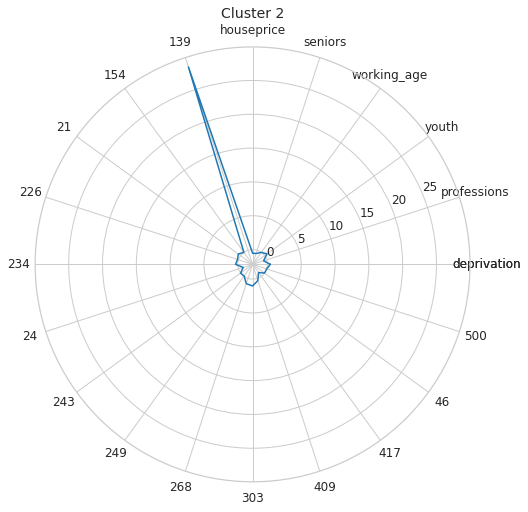

In [234]:
seprated_radar_plot_centroids(df_cluster_centroid)

In [235]:
# add cluster label
cluster_nm = kmeans.labels_

wf_hs_lsoa_retail_with_cluster = wf_hs_lsoa_retail.assign(cluster=cluster_nm)

wf_hs_lsoa_retail_with_cluster

,index,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,geometry,deprivation,professions,...,24,243,249,268,303,409,417,46,500,cluster
0,242,237,"Billet Road, Walthamstow.",4.395863,None,Waltham Forest,E09000031,"POLYGON ((536538.954 190900.525, 536542.912 19...",-12.42,14.03,...,0.00,0.00,3.89,0.00,0.00,-9.09,5.20,0.00,0.00,1
1,250,244,"Forest Road (Pembar Avenue), Blackhorse Road",5.781402,None,Waltham Forest,E09000031,"MULTIPOLYGON (((536388.069 189529.767, 536387....",-12.33,12.61,...,0.00,0.00,-5.27,2.63,0.00,-0.51,0.59,0.00,0.00,1
2,255,249,"Burnside Avenue, Walthamstow.",7.221877,None,Waltham Forest,E09000031,"MULTIPOLYGON (((537130.364 191807.225, 537155....",-11.84,8.89,...,0.00,0.00,2.15,-0.71,0.00,-0.71,-0.36,0.00,0.00,1
3,258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,"POLYGON ((537451.583 192633.269, 537451.715 19...",-9.46,7.38,...,-0.24,0.00,-3.71,0.79,1.14,0.00,-1.38,0.00,0.00,2
4,263,257,"Grove Green Road, Leytonstone.",4.605851,None,Waltham Forest,E09000031,"POLYGON ((538947.848 186917.325, 538938.094 18...",-12.20,10.53,...,0.00,0.00,0.44,-2.71,0.00,0.00,-0.30,0.00,0.00,1
5,403,397,"The Avenue, Highams Park.",9.215191,None,Waltham Forest,E09000031,"POLYGON ((538679.256 191889.252, 538684.327 19...",-7.74,8.17,...,-0.33,0.82,-8.34,-0.66,0.82,-0.33,0.00,0.00,0.00,0
6,474,466,"Francis Road, Leyton",6.813432,None,Waltham Forest,E09000031,"POLYGON ((538057.472 187025.286, 538112.679 18...",-12.90,13.98,...,0.00,0.00,-3.29,-0.31,1.96,0.00,-0.31,1.96,0.00,1
7,515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,"POLYGON ((539839.361 187616.515, 539842.206 18...",-10.50,8.35,...,0.24,0.93,-4.12,-0.61,0.35,-0.32,0.47,0.35,0.00,1
8,519,507,"Wood Street, Wood Street.",21.766876,None,Waltham Forest,E09000031,"POLYGON ((538548.242 190188.508, 538559.398 19...",-11.05,11.75,...,-0.51,0.00,0.68,-0.92,0.00,-0.41,-0.17,0.00,0.00,1
9,520,508,"High Street/Hoe Street, Walthamstow",95.428617,None,Waltham Forest,E09000031,"POLYGON ((537813.332 188310.594, 537812.973 18...",-11.52,12.43,...,-0.19,2.36,-4.62,0.50,0.00,0.25,-0.29,-0.03,0.07,1


In [236]:
wf_hs_lsoa_retail_with_clusters = pd.concat([wf_hs_lsoa_retail, pd.Series(kmeans.labels_, name='cluster')], axis=1)


wf_hs_lsoa_retail_with_clusters

,index,highstreet_id,highstreet_name,area_ha,gdb_geomattr_data,BoroughNM,LAD11CD,geometry,deprivation,professions,...,24,243,249,268,303,409,417,46,500,cluster
0,242,237,"Billet Road, Walthamstow.",4.395863,None,Waltham Forest,E09000031,"POLYGON ((536538.954 190900.525, 536542.912 19...",-12.42,14.03,...,0.00,0.00,3.89,0.00,0.00,-9.09,5.20,0.00,0.00,1
1,250,244,"Forest Road (Pembar Avenue), Blackhorse Road",5.781402,None,Waltham Forest,E09000031,"MULTIPOLYGON (((536388.069 189529.767, 536387....",-12.33,12.61,...,0.00,0.00,-5.27,2.63,0.00,-0.51,0.59,0.00,0.00,1
2,255,249,"Burnside Avenue, Walthamstow.",7.221877,None,Waltham Forest,E09000031,"MULTIPOLYGON (((537130.364 191807.225, 537155....",-11.84,8.89,...,0.00,0.00,2.15,-0.71,0.00,-0.71,-0.36,0.00,0.00,1
3,258,252,"Old Church Road, Chingford.",13.973184,None,Waltham Forest,E09000031,"POLYGON ((537451.583 192633.269, 537451.715 19...",-9.46,7.38,...,-0.24,0.00,-3.71,0.79,1.14,0.00,-1.38,0.00,0.00,2
4,263,257,"Grove Green Road, Leytonstone.",4.605851,None,Waltham Forest,E09000031,"POLYGON ((538947.848 186917.325, 538938.094 18...",-12.20,10.53,...,0.00,0.00,0.44,-2.71,0.00,0.00,-0.30,0.00,0.00,1
5,403,397,"The Avenue, Highams Park.",9.215191,None,Waltham Forest,E09000031,"POLYGON ((538679.256 191889.252, 538684.327 19...",-7.74,8.17,...,-0.33,0.82,-8.34,-0.66,0.82,-0.33,0.00,0.00,0.00,0
6,474,466,"Francis Road, Leyton",6.813432,None,Waltham Forest,E09000031,"POLYGON ((538057.472 187025.286, 538112.679 18...",-12.90,13.98,...,0.00,0.00,-3.29,-0.31,1.96,0.00,-0.31,1.96,0.00,1
7,515,503,"Leytonstone High Road, Leytonstone.",37.861426,None,Waltham Forest,E09000031,"POLYGON ((539839.361 187616.515, 539842.206 18...",-10.50,8.35,...,0.24,0.93,-4.12,-0.61,0.35,-0.32,0.47,0.35,0.00,1
8,519,507,"Wood Street, Wood Street.",21.766876,None,Waltham Forest,E09000031,"POLYGON ((538548.242 190188.508, 538559.398 19...",-11.05,11.75,...,-0.51,0.00,0.68,-0.92,0.00,-0.41,-0.17,0.00,0.00,1
9,520,508,"High Street/Hoe Street, Walthamstow",95.428617,None,Waltham Forest,E09000031,"POLYGON ((537813.332 188310.594, 537812.973 18...",-11.52,12.43,...,-0.19,2.36,-4.62,0.50,0.00,0.25,-0.29,-0.03,0.07,1


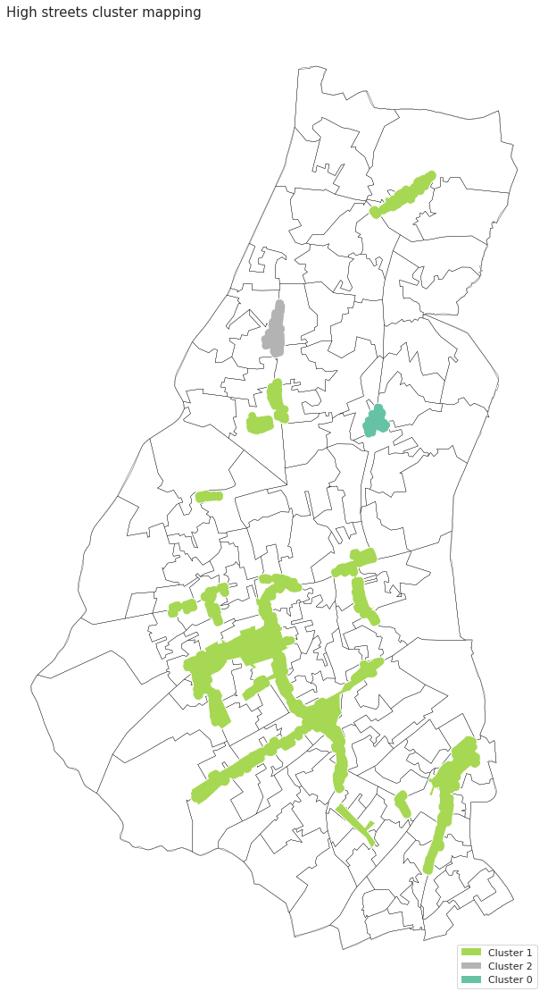

In [237]:
# plot and check
fig, ax = plt.subplots(figsize=(20, 20))

wf_borough.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.3)
wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.3)

wf_hs_lsoa_retail_with_clusters.plot(ax=ax, linewidth=1, column='cluster', categorical=True, legend=True, cmap='Set2')

ax.set_title('High streets cluster mapping', loc='left', fontsize=15)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')


# for index, row in merged_hs.iterrows():
#     highstreet_name = row['highstreet_name']
#     centroid = row['geometry'].centroid
#     ax.text(centroid.x, centroid.y, highstreet_name, fontsize=8, color='black', ha='left', va='baseline')

km_clusters = wf_hs_lsoa_retail_with_clusters['cluster'].unique()

# add legend
cluster_colors = plt.get_cmap('Set2', len(km_clusters))
legend_handles2 = [
    mpatches.Patch(facecolor=cluster_colors(cluster), edgecolor='none', label=f'Cluster {cluster}')
    for cluster in km_clusters]

ax.legend(handles=legend_handles2, loc='lower right', bbox_to_anchor=(1, 0))
ax.axis('off') # turn off axis
ax.set_xticks([])
ax.set_yticks([])
plt.show()

#### 5.2 Clustered High Streets Retail Composition Changes

In [238]:
clustered_hs_value = wf_hs_lsoa_retail_with_clusters.groupby('cluster').mean()

clustered_hs_value = clustered_hs_value.reset_index()
clustered_hs_value = clustered_hs_value.drop(columns=['index', 'area_ha'])

clustered_hs_value

,cluster,deprivation,professions,youth,working_age,seniors,houseprice,139,154,21,...,234,24,243,249,268,303,409,417,46,500
0,0,-7.740000,8.170000,0.130000,0.560000,-0.690000,114.330000,0.000000,0.000000,7.380000,...,-0.99,-0.330000,0.820000,-8.340000,-0.660000,0.820000,-0.330000,0.000000,0.000000,0.000000
1,1,-11.364444,11.063333,-0.765556,0.288889,0.477778,115.995556,0.002222,0.016667,-0.091111,...,0.30,-0.051111,0.321111,-1.258889,-0.333333,0.256667,-1.048889,0.427778,0.253333,0.007778
2,2,-9.460000,7.380000,0.490000,0.460000,-0.940000,94.850000,0.570000,0.000000,0.220000,...,0.88,-0.240000,0.000000,-3.710000,0.790000,1.140000,0.000000,-1.380000,0.000000,0.000000


In [239]:
csv_file_path2 = os.path.join('Data', "cluster_centroid.csv")
clustered_hs_value.round(2).to_csv(csv_file_path2, index=False)
print(f"DataFrame saved in {csv_file_path2}")

DataFrame saved in Data/cluster_centroid.csv


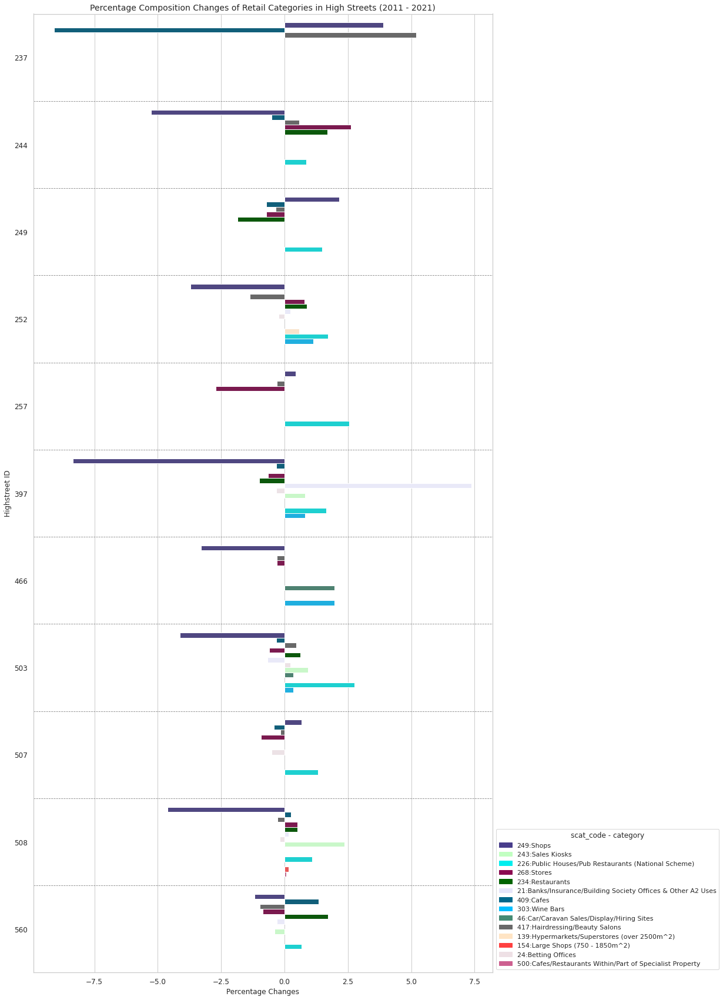

In [240]:
sns.set_style('whitegrid')
sns.set_context("notebook", rc={"axes.labelsize": 12, "axes.titlesize": 14, "xtick.labelsize": 12, "ytick.labelsize": 12})

fig, ax = plt.subplots(figsize=(14, 30))
sns.barplot(x='percentage', y='highstreet_id', hue='scat_code', palette=custom_palette,
            data=composition, orient='h', ax=ax)

ax.set_xlabel('Percentage Changes')
ax.set_ylabel('Highstreet ID')
ax.set_title('Percentage Composition Changes of Retail Categories in High Streets (2011 - 2021)')
ax.legend(handles=legend_handles_code, title='scat_code - category', loc='lower right', bbox_to_anchor=(1.5, 0))

# Adding separating lines
for y_coord in range(len(merged_hs['highstreet_id'])):
    ax.axhline(y=y_coord + 0.5, color='gray', linestyle='--', linewidth=0.8)

plt.show()

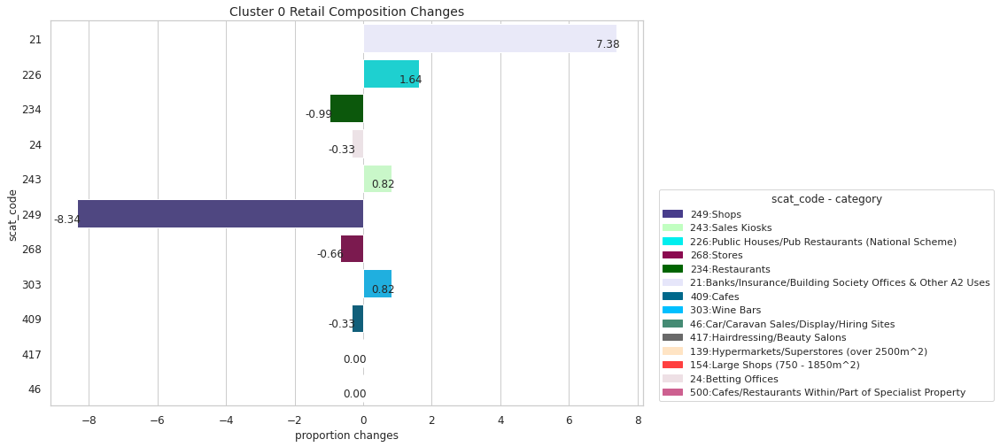

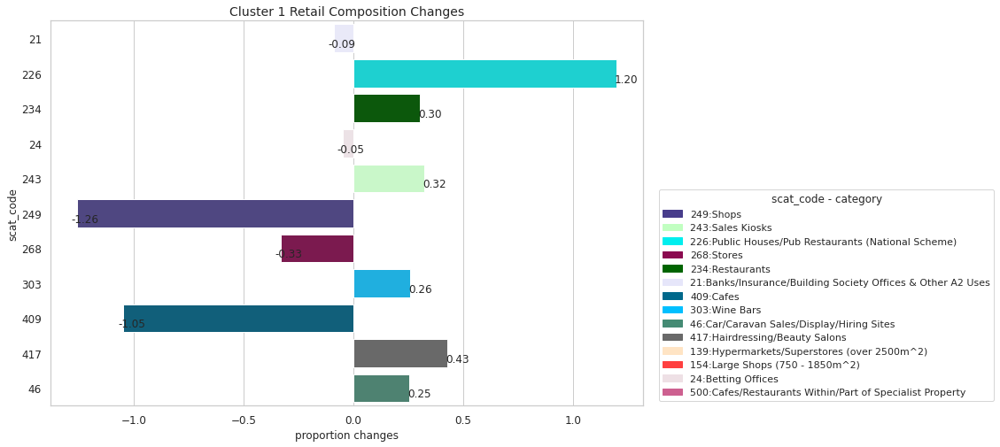

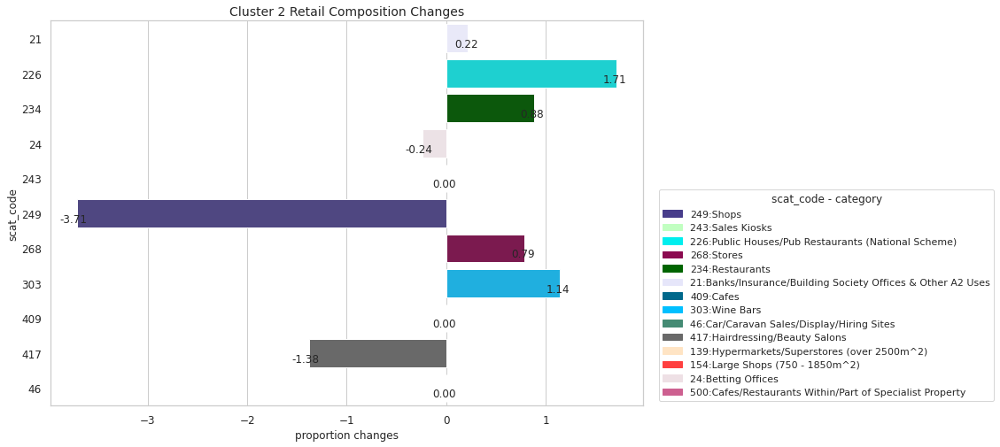

In [241]:
# get code columns
clustered_composition = clustered_hs_value.iloc[:,[0]+list(range(9, 20))]

for index, row in clustered_composition.iterrows():
    cluster = row['cluster'] 
    data = row[1:]
    
    plt.figure(figsize=(12, 8)) 
    ax = sns.barplot(x=data, y=data.index, orient='h', palette=custom_palette)
    for rect in ax.patches: 
        width = rect.get_width()
        plt.text(width + 0.1, rect.get_y() + rect.get_height()/2, f'{width:.2f}', ha='right', va='top')
    
    plt.title(f'Cluster {cluster:.0f} Retail Composition Changes')
    plt.xlabel('proportion changes')
    plt.ylabel('scat_code') 
    plt.legend(handles=legend_handles_code, title='scat_code - category', loc='lower right', bbox_to_anchor=(1.6, 0))

    plt.show()
    


#### 5.3 Plot Duration map of retails

The map distribution derived from the duration of retail points as a value can be used as a manifestation of the impact of gentrification on the high street.

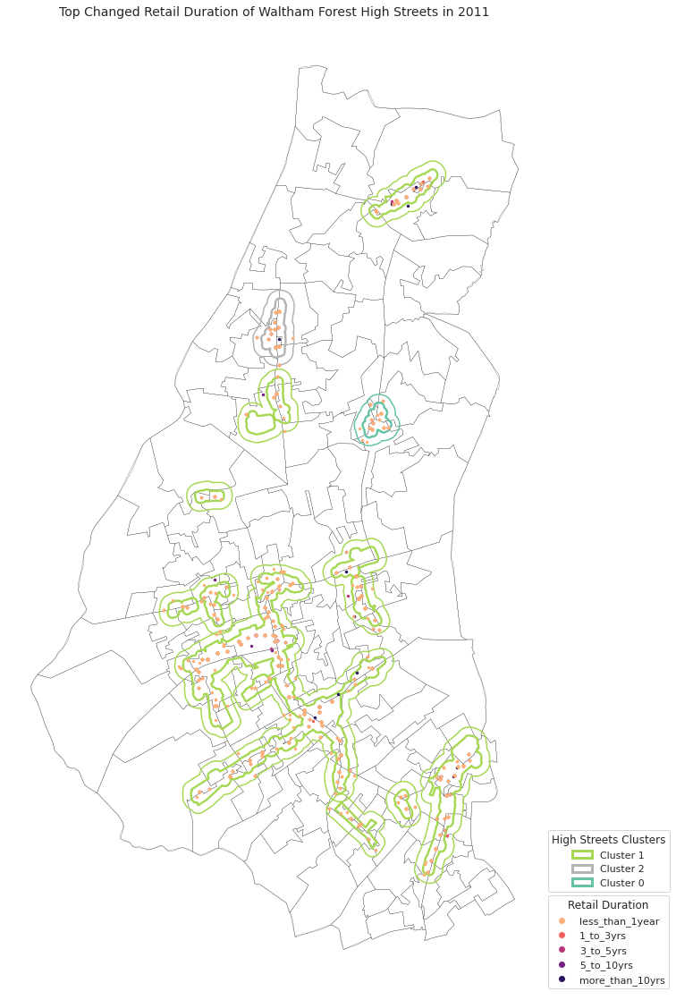

In [242]:
# color and legend setting
cluster_colors = plt.get_cmap('Set2', len(km_clusters))
legend_handles3 = [
    mpatches.Patch(edgecolor=cluster_colors(cluster), facecolor='none', label=f'Cluster {cluster}', linewidth=3)
    for cluster in km_clusters]

# plot and check - 2011
fig, ax = plt.subplots(figsize=(20,20))

wf_borough.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.2)
wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.2)

wf_hs_lsoa_retail_with_clusters.plot(ax=ax, linewidth=2.4, column='cluster', categorical=True, legend=True, cmap='Set2', 
                                     edgecolor=[cluster_colors(cluster) for cluster in wf_hs_lsoa_retail_with_clusters['cluster']], 
                                     facecolor='none', 
                                    )

wf_highstreet_buffered.plot(ax=ax, linewidth=1.5, edgecolor=[cluster_colors(cluster) for cluster in wf_hs_lsoa_retail_with_clusters['cluster']], 
                                     facecolor='none',)

for category in categories1:
    color =color_mapping.get(category, 'gray') # default as gray 
    wf_hs_topretail11[wf_hs_topretail11['duration_category'] == category].plot(ax=ax, color=color, markersize=6, label=category)

plt.title('Top Changed Retail Duration of Waltham Forest High Streets in 2011')

# add legend
legend1 = ax.legend(title='Retail Duration', loc='lower left', handles=legend_handles, bbox_to_anchor=(1, 0))
legend2 =ax.legend(title='High Streets Clusters', loc='lower left', handles=legend_handles3, bbox_to_anchor=(1, 0.1))
ax.add_artist(legend1)
ax.axis('off') # turn off axis
ax.set_xticks([])
ax.set_yticks([])
plt.show()

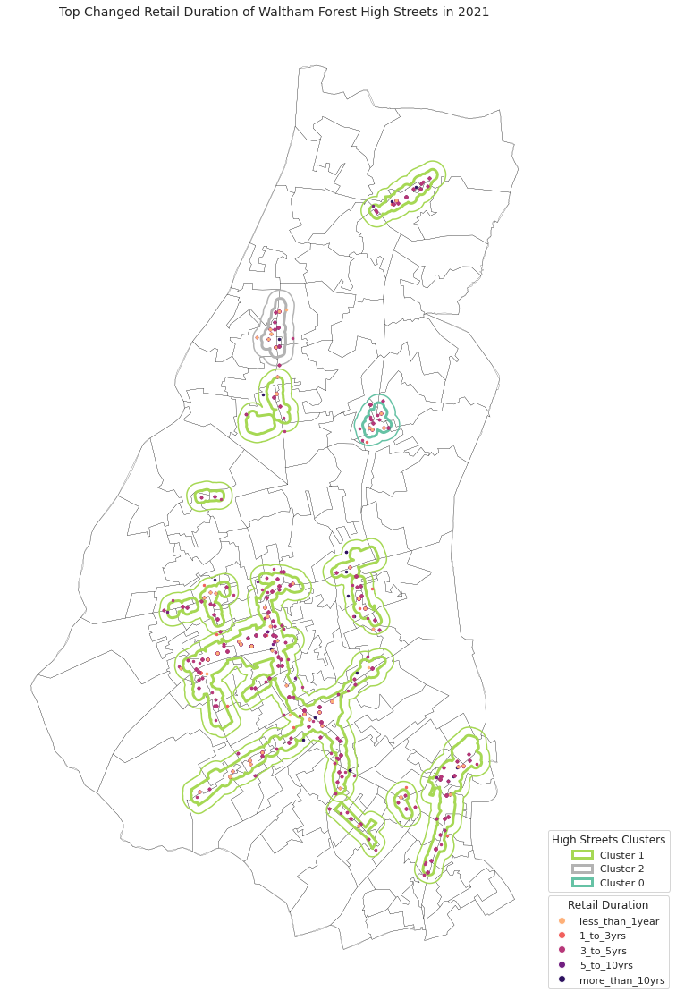

In [243]:
# plot and check - 2021
fig, ax = plt.subplots(figsize=(20,20))

wf_borough.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.2)
wf_lsoa.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.2)

wf_hs_lsoa_retail_with_clusters.plot(ax=ax, linewidth=3, column='cluster', categorical=True, legend=True, cmap='Set2', 
                                     edgecolor=[cluster_colors(cluster) for cluster in wf_hs_lsoa_retail_with_clusters['cluster']], 
                                     facecolor='none'
                                    )
wf_highstreet_buffered.plot(ax=ax, linewidth=1.5, edgecolor=[cluster_colors(cluster) for cluster in wf_hs_lsoa_retail_with_clusters['cluster']], 
                                     facecolor='none',)
for category in categories1:
    color =color_mapping.get(category, 'gray') # default as gray 
    wf_hs_topretail21[wf_hs_topretail21['duration_category'] == category].plot(ax=ax, color=color, markersize=6, label=category)

plt.title('Top Changed Retail Duration of Waltham Forest High Streets in 2021')

# add legend
legend1 = ax.legend(title='Retail Duration', loc='lower left', handles=legend_handles, bbox_to_anchor=(1, 0))
legend2 =ax.legend(title='High Streets Clusters', loc='lower left', handles=legend_handles3, bbox_to_anchor=(1, 0.1))
ax.add_artist(legend1)
ax.axis('off') # turn off axis
ax.set_xticks([])
ax.set_yticks([])
plt.show()